In [1]:
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Dépenses en énergie

In [2]:
# Excel IEA des dépenses en énergie - version complète
budgets = pd.read_excel('/Users/sophierojanathara/Library/CloudStorage/OneDrive-Personnel/DATABIRD/Cas pratique/Envir/01_Datasets/01_Dataset_Study/Budgets_Public-RDD-Expenditures.xlsx')
budgets

,Country,Currency,Technology,1974,1975,1976,1977,1978,1979,1980,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Australia,National currency (nominal),Energy efficiency,..,..,..,..,..,0,5.4,...,29.451,21.467,28.108,32.881,46.263,30.62,46.658,58.852,21.792,..
1,Australia,National currency (nominal),Fossil fuels,..,..,..,..,..,13.41,20.75,...,64.41,42.331,67.878,71.2,68.4,49.117,46.41,138.832,75.171,..
2,Australia,National currency (nominal),Renewables,..,..,..,..,..,6.43,9.96,...,151.449,56.188,68.475,66.505,75.744,41.276,62.038,82.547,78.583,..
3,Australia,National currency (nominal),Nuclear,..,..,..,..,..,0,0,...,9.118,17.551,10.016,8.786,9.789,10.246,15.395,18.026,18.9,..
4,Australia,National currency (nominal),Hydrogen and fuel cells,..,..,..,..,..,..,..,...,4.149,3.883,5.877,32.263,49.781,46.045,81.731,154.66,151.633,..
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1633,IEA Asia Oceania,Euro (2023 prices and exchange rates),Hydrogen and fuel cells,0,0,0,0,0,0,0,...,125.278,132.645,138.756,207.485,279.175,307.048,316.877,357.241,349.425,..
1634,IEA Asia Oceania,Euro (2023 prices and exchange rates),Other power and storage technologies,14.508,14.788,12.067,12.509,16.601,23.984,67.243,...,181.178,254.678,232.225,249.979,233.336,253.952,284.223,301.592,289.813,..
1635,IEA Asia Oceania,Euro (2023 prices and exchange rates),Other cross-cutting technologies/research,262.769,307.239,311.308,15.181,19.086,33.579,55.702,...,165.21,90.855,164.515,168.088,194.607,179.515,162.494,144.941,125.801,..
1636,IEA Asia Oceania,Euro (2023 prices and exchange rates),Unallocated,0,0,0,0,0,0,0,...,2.119,5.695,6.724,5.813,4.873,6.841,1.973,1.339,2.539,..


In [3]:
# Excel IEA dépenses en énergie - Currency en USA (2023 prices and Puchasing Power Parity) - de 2007 à 2017
budgets = budgets[budgets['Currency'] == 'USD (2023 prices and PPP)']
# Premier drop de colonnes des années 1974 -> 2006
columns_to_drop = [str(year) for year in range(1974, 2007)]
budgets = budgets.drop(columns=columns_to_drop)
budgets


,Country,Currency,Technology,2007,2008,2009,2010,2011,2012,2013,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
27,Australia,USD (2023 prices and PPP),Energy efficiency,35.457,41.628,37.391,120.389,87.003,63.043,62.067,...,25.637,18.553,23.448,26.795,36.508,23.812,34.419,39.997,14.337,..
28,Australia,USD (2023 prices and PPP),Fossil fuels,73.866,68.549,285.321,204.42,230.431,347.63,282.7,...,56.069,36.584,56.626,58.022,53.978,38.196,34.236,94.353,49.455,..
29,Australia,USD (2023 prices and PPP),Renewables,50.553,43.747,84.191,89.589,173.803,226.167,448.283,...,131.836,48.56,57.124,54.196,59.773,32.098,45.764,56.101,51.699,..
30,Australia,USD (2023 prices and PPP),Nuclear,16.184,24.807,2.756,2.722,5.357,10.193,7.7,...,7.937,15.168,8.356,7.16,7.725,7.968,11.357,12.251,12.434,..
31,Australia,USD (2023 prices and PPP),Hydrogen and fuel cells,0.678,0.317,1.168,2.215,2.207,0.199,1.606,...,3.612,3.356,4.903,26.292,39.285,35.808,60.292,105.11,99.759,..
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1624,IEA Asia Oceania,USD (2023 prices and PPP),Hydrogen and fuel cells,323.315,384.13,280.833,235.946,206.226,228.155,198.092,...,211.415,225.216,234.524,337.125,448.841,500.616,509.326,555.46,546.918,..
1625,IEA Asia Oceania,USD (2023 prices and PPP),Other power and storage technologies,229.469,249.023,296.269,317.613,275.889,296.643,261.447,...,311.592,432.492,393.895,424.464,388,428.988,461.49,492.796,487.675,..
1626,IEA Asia Oceania,USD (2023 prices and PPP),Other cross-cutting technologies/research,128.34,157.902,50.939,59.663,45.63,38.538,45.124,...,278.753,155.053,278.503,284.461,321.398,289.134,255.099,216.446,192.717,..
1627,IEA Asia Oceania,USD (2023 prices and PPP),Unallocated,0,0,0,0,0,0,0,...,2.269,6.098,7.718,6.709,5.84,8.2,2.365,1.605,3.043,..


In [4]:
# Second drop de colonnes des années 1974 -> 2006
columns_to_drop_2 = [str(year) for year in range(2018, 2025)]
budgets = budgets.drop(columns=columns_to_drop_2)
budgets

,Country,Currency,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
27,Australia,USD (2023 prices and PPP),Energy efficiency,35.457,41.628,37.391,120.389,87.003,63.043,62.067,25.712,25.637,18.553,23.448
28,Australia,USD (2023 prices and PPP),Fossil fuels,73.866,68.549,285.321,204.42,230.431,347.63,282.7,134.791,56.069,36.584,56.626
29,Australia,USD (2023 prices and PPP),Renewables,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.56,57.124
30,Australia,USD (2023 prices and PPP),Nuclear,16.184,24.807,2.756,2.722,5.357,10.193,7.7,6.819,7.937,15.168,8.356
31,Australia,USD (2023 prices and PPP),Hydrogen and fuel cells,0.678,0.317,1.168,2.215,2.207,0.199,1.606,3.527,3.612,3.356,4.903
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1624,IEA Asia Oceania,USD (2023 prices and PPP),Hydrogen and fuel cells,323.315,384.13,280.833,235.946,206.226,228.155,198.092,199.108,211.415,225.216,234.524
1625,IEA Asia Oceania,USD (2023 prices and PPP),Other power and storage technologies,229.469,249.023,296.269,317.613,275.889,296.643,261.447,304.906,311.592,432.492,393.895
1626,IEA Asia Oceania,USD (2023 prices and PPP),Other cross-cutting technologies/research,128.34,157.902,50.939,59.663,45.63,38.538,45.124,36.113,278.753,155.053,278.503
1627,IEA Asia Oceania,USD (2023 prices and PPP),Unallocated,0,0,0,0,0,0,0,6.699,2.269,6.098,7.718


In [5]:
# Trier le dataframe avec uniquement les pays de la sélection
pays_a_conserver = ['Australia', 'Austria', 'Belgium', 'Brazil', 'Canada', 'Chile',
                    'Czech Republic', 'Denmark', 'Estonia', 'Finland', 'France',
                    'Germany', 'Greece','Hungary', 'Ireland', 'Italy', 'Japan', 'Korea', 'Lithuania', 'Luxembourg',
                    'Mexico', 'Netherlands', 'New Zealand', 'Norway', 'Poland',
                    'Portugal', 'Slovak Republic', 'Spain', 'Sweden', 'Switzerland',
                    'Republic of Türkiye', 'United Kingdom', 'United States']

budgets = budgets[budgets['Country'].isin(pays_a_conserver)]
budgets = budgets.drop(columns='Currency')
budgets

,Country,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
27,Australia,Energy efficiency,35.457,41.628,37.391,120.389,87.003,63.043,62.067,25.712,25.637,18.553,23.448
28,Australia,Fossil fuels,73.866,68.549,285.321,204.42,230.431,347.63,282.7,134.791,56.069,36.584,56.626
29,Australia,Renewables,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.56,57.124
30,Australia,Nuclear,16.184,24.807,2.756,2.722,5.357,10.193,7.7,6.819,7.937,15.168,8.356
31,Australia,Hydrogen and fuel cells,0.678,0.317,1.168,2.215,2.207,0.199,1.606,3.527,3.612,3.356,4.903
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1471,United States,Hydrogen and fuel cells,454.24,445.975,491.541,454.262,347.14,155.215,185.866,182.032,156.122,125.645,123.496
1472,United States,Other power and storage technologies,185.536,168.305,1270.275,375.142,238.398,133.373,144.127,349.796,312.478,212.652,249.368
1473,United States,Other cross-cutting technologies/research,1686.355,1807.602,6.904,150.057,2887.136,3165.839,3027.6,2911.436,2857.543,2705.12,2695.016
1474,United States,Unallocated,0,0,0,0,0,0,0,0,0,212.705,147.583


In [6]:
# Je renomme la colonne "Country" en "Economy Name" pour pouvoir fusionner avec d'autres dataframe contenant cet intitulé
budgets.rename(columns = {'Country' : 'Economy Name'}, inplace = True)
budgets

,Economy Name,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
27,Australia,Energy efficiency,35.457,41.628,37.391,120.389,87.003,63.043,62.067,25.712,25.637,18.553,23.448
28,Australia,Fossil fuels,73.866,68.549,285.321,204.42,230.431,347.63,282.7,134.791,56.069,36.584,56.626
29,Australia,Renewables,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.56,57.124
30,Australia,Nuclear,16.184,24.807,2.756,2.722,5.357,10.193,7.7,6.819,7.937,15.168,8.356
31,Australia,Hydrogen and fuel cells,0.678,0.317,1.168,2.215,2.207,0.199,1.606,3.527,3.612,3.356,4.903
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1471,United States,Hydrogen and fuel cells,454.24,445.975,491.541,454.262,347.14,155.215,185.866,182.032,156.122,125.645,123.496
1472,United States,Other power and storage technologies,185.536,168.305,1270.275,375.142,238.398,133.373,144.127,349.796,312.478,212.652,249.368
1473,United States,Other cross-cutting technologies/research,1686.355,1807.602,6.904,150.057,2887.136,3165.839,3027.6,2911.436,2857.543,2705.12,2695.016
1474,United States,Unallocated,0,0,0,0,0,0,0,0,0,212.705,147.583


## Traitement des valeurs manquantes (Interpolate)

In [7]:
# Remplacer les ".." par np.nan dans les colonnes de 2007 à 2017
years = [str(year) for year in range(2007, 2018)]
budgets[years] = budgets[years].replace("..", np.nan)

/var/folders/f0/kz3pcppd42x67vkzrt_f2f4w0000gn/T/ipykernel_52158/88202087.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  budgets[years] = budgets[years].replace("..", np.nan)


In [8]:
# Vérifier pour une énergie pour laquelle nous avions des ".." que nous avons maintenant des NaN
budgets[budgets['Technology'] == 'Renewables']

,Economy Name,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
29,Australia,Renewables,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.560,57.124
74,Austria,Renewables,28.002,45.348,59.308,60.608,58.045,48.935,50.330,54.151,36.128,48.910,33.920
119,Belgium,Renewables,27.484,NaN,NaN,0.000,29.660,29.787,32.115,44.781,28.922,24.496,25.865
164,Brazil,Renewables,NaN,NaN,NaN,NaN,NaN,NaN,421.388,502.598,399.460,330.241,297.990
209,Canada,Renewables,84.813,103.536,168.995,167.776,196.938,225.268,134.360,117.747,144.331,121.561,123.506
254,Chile,Renewables,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.944,11.740,9.488,12.667
299,Czech Republic,Renewables,3.239,14.504,17.274,16.814,27.030,22.797,14.155,14.069,17.550,15.384,16.499
344,Denmark,Renewables,60.043,66.714,79.416,116.253,108.223,88.737,113.492,76.134,94.884,62.323,38.042
389,Estonia,Renewables,NaN,NaN,NaN,NaN,12.435,0.420,3.629,2.545,2.967,2.649,0.987
434,Finland,Renewables,56.760,58.030,70.931,66.722,90.959,57.420,75.190,47.815,54.073,48.433,54.702


In [9]:
budgets_interpolate = budgets

In [10]:
budgets_interpolate.set_index('Economy Name', inplace=True)
budgets_interpolate

,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Economy Name,,,,,,,,,,,,
Australia,Energy efficiency,35.457,41.628,37.391,120.389,87.003,63.043,62.067,25.712,25.637,18.553,23.448
Australia,Fossil fuels,73.866,68.549,285.321,204.420,230.431,347.630,282.700,134.791,56.069,36.584,56.626
Australia,Renewables,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.560,57.124
Australia,Nuclear,16.184,24.807,2.756,2.722,5.357,10.193,7.700,6.819,7.937,15.168,8.356
Australia,Hydrogen and fuel cells,0.678,0.317,1.168,2.215,2.207,0.199,1.606,3.527,3.612,3.356,4.903
...,...,...,...,...,...,...,...,...,...,...,...,...
United States,Hydrogen and fuel cells,454.240,445.975,491.541,454.262,347.140,155.215,185.866,182.032,156.122,125.645,123.496
United States,Other power and storage technologies,185.536,168.305,1270.275,375.142,238.398,133.373,144.127,349.796,312.478,212.652,249.368
United States,Other cross-cutting technologies/research,1686.355,1807.602,6.904,150.057,2887.136,3165.839,3027.600,2911.436,2857.543,2705.120,2695.016


In [11]:
budgets_interpolate_transpose = budgets_interpolate.T
budgets_interpolate_transpose

Economy Name,Australia,Australia,Australia,Australia,Australia,Australia,Australia,Australia,Australia,Austria,...,United Kingdom,United States,United States,United States,United States,United States,United States,United States,United States,United States
Technology,Energy efficiency,Fossil fuels,Renewables,Nuclear,Hydrogen and fuel cells,Other power and storage technologies,Other cross-cutting technologies/research,Unallocated,Total Budget,Energy efficiency,...,Total Budget,Energy efficiency,Fossil fuels,Renewables,Nuclear,Hydrogen and fuel cells,Other power and storage technologies,Other cross-cutting technologies/research,Unallocated,Total Budget
2007,35.457,73.866,50.553,16.184,0.678,14.254,125.908,0.0,316.899,14.511,...,308.186,776.323,640.3,787.765,1190.516,454.24,185.536,1686.355,0.0,5721.034
2008,41.628,68.549,43.747,24.807,0.317,13.639,124.501,0.0,317.186,43.617,...,327.853,920.518,785.768,622.482,1341.637,445.975,168.305,1807.602,0.0,6092.286
2009,37.391,285.321,84.191,2.756,1.168,16.266,9.836,0.0,436.926,68.167,...,549.754,2932.679,4635.123,3045.899,1163.959,491.541,1270.275,6.904,0.0,13546.38
2010,120.389,204.42,89.589,2.722,2.215,12.576,10.801,0.0,442.712,100.321,...,1026.915,1898.898,627.509,1787.038,1211.366,454.262,375.142,150.057,0.0,6504.272
2011,87.003,230.431,173.803,5.357,2.207,10.473,7.323,0.0,516.597,112.819,...,691.138,1178.944,674.945,1551.141,1637.701,347.14,238.398,2887.136,0.0,8515.404
2012,63.043,347.63,226.167,10.193,0.199,16.696,13.284,0.0,677.212,96.067,...,615.712,1266.211,411.917,1955.033,1015.698,155.215,133.373,3165.839,0.0,8103.285
2013,62.067,282.7,448.283,7.7,1.606,20.822,8.117,0.0,831.295,94.868,...,769.826,1630.012,445.672,1266.488,952.791,185.866,144.127,3027.6,0.0,7652.556
2014,25.712,134.791,81.671,6.819,3.527,9.284,0.19,6.699,268.695,103.143,...,645.428,1644.303,537.083,1146.593,1111.963,182.032,349.796,2911.436,0.0,7883.206
2015,25.637,56.069,131.836,7.937,3.612,14.619,1.912,2.269,243.89,93.03,...,704.755,1522.566,521.679,1130.971,1106.927,156.122,312.478,2857.543,0.0,7608.286


In [12]:
technology = budgets_interpolate_transpose.head(1)

In [13]:
colonnes = budgets_interpolate_transpose.columns.tolist()
colonnes

['Australia',
 'Australia',
 'Australia',
 'Australia',
 'Australia',
 'Australia',
 'Australia',
 'Australia',
 'Australia',
 'Austria',
 'Austria',
 'Austria',
 'Austria',
 'Austria',
 'Austria',
 'Austria',
 'Austria',
 'Austria',
 'Belgium',
 'Belgium',
 'Belgium',
 'Belgium',
 'Belgium',
 'Belgium',
 'Belgium',
 'Belgium',
 'Belgium',
 'Brazil',
 'Brazil',
 'Brazil',
 'Brazil',
 'Brazil',
 'Brazil',
 'Brazil',
 'Brazil',
 'Brazil',
 'Canada',
 'Canada',
 'Canada',
 'Canada',
 'Canada',
 'Canada',
 'Canada',
 'Canada',
 'Canada',
 'Chile',
 'Chile',
 'Chile',
 'Chile',
 'Chile',
 'Chile',
 'Chile',
 'Chile',
 'Chile',
 'Czech Republic',
 'Czech Republic',
 'Czech Republic',
 'Czech Republic',
 'Czech Republic',
 'Czech Republic',
 'Czech Republic',
 'Czech Republic',
 'Czech Republic',
 'Denmark',
 'Denmark',
 'Denmark',
 'Denmark',
 'Denmark',
 'Denmark',
 'Denmark',
 'Denmark',
 'Denmark',
 'Estonia',
 'Estonia',
 'Estonia',
 'Estonia',
 'Estonia',
 'Estonia',
 'Estonia',
 'Eston

In [14]:
for col in colonnes:
    budgets_interpolate_transpose[col] = budgets_interpolate_transpose[col].apply(pd.to_numeric, errors='coerce').interpolate()

In [15]:
budgets_interpolate_concat = pd.concat((technology, budgets_interpolate_transpose), axis=0)

In [16]:
budgets_interpolate_concat2 = budgets_interpolate_concat.drop(budgets_interpolate_concat.index[1])
budgets_interpolate_concat2

Economy Name,Australia,Australia,Australia,Australia,Australia,Australia,Australia,Australia,Australia,Austria,...,United Kingdom,United States,United States,United States,United States,United States,United States,United States,United States,United States
2007,35.457,73.866,50.553,16.184,0.678,14.254,125.908,0.0,316.899,14.511,...,308.186,776.323,640.3,787.765,1190.516,454.24,185.536,1686.355,0.0,5721.034
2008,41.628,68.549,43.747,24.807,0.317,13.639,124.501,0.0,317.186,43.617,...,327.853,920.518,785.768,622.482,1341.637,445.975,168.305,1807.602,0.0,6092.286
2009,37.391,285.321,84.191,2.756,1.168,16.266,9.836,0.0,436.926,68.167,...,549.754,2932.679,4635.123,3045.899,1163.959,491.541,1270.275,6.904,0.0,13546.38
2010,120.389,204.42,89.589,2.722,2.215,12.576,10.801,0.0,442.712,100.321,...,1026.915,1898.898,627.509,1787.038,1211.366,454.262,375.142,150.057,0.0,6504.272
2011,87.003,230.431,173.803,5.357,2.207,10.473,7.323,0.0,516.597,112.819,...,691.138,1178.944,674.945,1551.141,1637.701,347.14,238.398,2887.136,0.0,8515.404
2012,63.043,347.63,226.167,10.193,0.199,16.696,13.284,0.0,677.212,96.067,...,615.712,1266.211,411.917,1955.033,1015.698,155.215,133.373,3165.839,0.0,8103.285
2013,62.067,282.7,448.283,7.7,1.606,20.822,8.117,0.0,831.295,94.868,...,769.826,1630.012,445.672,1266.488,952.791,185.866,144.127,3027.6,0.0,7652.556
2014,25.712,134.791,81.671,6.819,3.527,9.284,0.19,6.699,268.695,103.143,...,645.428,1644.303,537.083,1146.593,1111.963,182.032,349.796,2911.436,0.0,7883.206
2015,25.637,56.069,131.836,7.937,3.612,14.619,1.912,2.269,243.89,93.03,...,704.755,1522.566,521.679,1130.971,1106.927,156.122,312.478,2857.543,0.0,7608.286
2016,18.553,36.584,48.56,15.168,3.356,16.148,2.221,6.098,146.688,106.399,...,881.552,1932.737,618.105,896.19,1064.921,125.645,212.652,2705.12,212.705,7768.075


In [17]:
budgets_interpolate_concat = pd.concat((technology, budgets_interpolate_concat2), axis=0)
budgets_interpolate_concat

Economy Name,Australia,Australia,Australia,Australia,Australia,Australia,Australia,Australia,Australia,Austria,...,United Kingdom,United States,United States,United States,United States,United States,United States,United States,United States,United States
Technology,Energy efficiency,Fossil fuels,Renewables,Nuclear,Hydrogen and fuel cells,Other power and storage technologies,Other cross-cutting technologies/research,Unallocated,Total Budget,Energy efficiency,...,Total Budget,Energy efficiency,Fossil fuels,Renewables,Nuclear,Hydrogen and fuel cells,Other power and storage technologies,Other cross-cutting technologies/research,Unallocated,Total Budget
2007,35.457,73.866,50.553,16.184,0.678,14.254,125.908,0.0,316.899,14.511,...,308.186,776.323,640.3,787.765,1190.516,454.24,185.536,1686.355,0.0,5721.034
2008,41.628,68.549,43.747,24.807,0.317,13.639,124.501,0.0,317.186,43.617,...,327.853,920.518,785.768,622.482,1341.637,445.975,168.305,1807.602,0.0,6092.286
2009,37.391,285.321,84.191,2.756,1.168,16.266,9.836,0.0,436.926,68.167,...,549.754,2932.679,4635.123,3045.899,1163.959,491.541,1270.275,6.904,0.0,13546.38
2010,120.389,204.42,89.589,2.722,2.215,12.576,10.801,0.0,442.712,100.321,...,1026.915,1898.898,627.509,1787.038,1211.366,454.262,375.142,150.057,0.0,6504.272
2011,87.003,230.431,173.803,5.357,2.207,10.473,7.323,0.0,516.597,112.819,...,691.138,1178.944,674.945,1551.141,1637.701,347.14,238.398,2887.136,0.0,8515.404
2012,63.043,347.63,226.167,10.193,0.199,16.696,13.284,0.0,677.212,96.067,...,615.712,1266.211,411.917,1955.033,1015.698,155.215,133.373,3165.839,0.0,8103.285
2013,62.067,282.7,448.283,7.7,1.606,20.822,8.117,0.0,831.295,94.868,...,769.826,1630.012,445.672,1266.488,952.791,185.866,144.127,3027.6,0.0,7652.556
2014,25.712,134.791,81.671,6.819,3.527,9.284,0.19,6.699,268.695,103.143,...,645.428,1644.303,537.083,1146.593,1111.963,182.032,349.796,2911.436,0.0,7883.206
2015,25.637,56.069,131.836,7.937,3.612,14.619,1.912,2.269,243.89,93.03,...,704.755,1522.566,521.679,1130.971,1106.927,156.122,312.478,2857.543,0.0,7608.286


In [18]:
budgets_interpolate = budgets_interpolate_concat.T
budgets_interpolate.head(50)

,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Economy Name,,,,,,,,,,,,
Australia,Energy efficiency,35.457,41.628,37.391,120.389,87.003,63.043,62.067,25.712,25.637,18.553,23.448
Australia,Fossil fuels,73.866,68.549,285.321,204.42,230.431,347.63,282.7,134.791,56.069,36.584,56.626
Australia,Renewables,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.56,57.124
Australia,Nuclear,16.184,24.807,2.756,2.722,5.357,10.193,7.7,6.819,7.937,15.168,8.356
Australia,Hydrogen and fuel cells,0.678,0.317,1.168,2.215,2.207,0.199,1.606,3.527,3.612,3.356,4.903
Australia,Other power and storage technologies,14.254,13.639,16.266,12.576,10.473,16.696,20.822,9.284,14.619,16.148,14.15
Australia,Other cross-cutting technologies/research,125.908,124.501,9.836,10.801,7.323,13.284,8.117,0.19,1.912,2.221,2.144
Australia,Unallocated,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.699,2.269,6.098,2.866
Australia,Total Budget,316.899,317.186,436.926,442.712,516.597,677.212,831.295,268.695,243.89,146.688,169.617


In [19]:
budgets_interpolate[budgets_interpolate['Technology'] == 'Renewables']

,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Economy Name,,,,,,,,,,,,
Australia,Renewables,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.56,57.124
Austria,Renewables,28.002,45.348,59.308,60.608,58.045,48.935,50.33,54.151,36.128,48.91,33.92
Belgium,Renewables,27.484,18.322667,9.161333,0.0,29.66,29.787,32.115,44.781,28.922,24.496,25.865
Brazil,Renewables,NaN,NaN,NaN,NaN,NaN,NaN,421.388,502.598,399.46,330.241,297.99
Canada,Renewables,84.813,103.536,168.995,167.776,196.938,225.268,134.36,117.747,144.331,121.561,123.506
Chile,Renewables,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.944,11.74,9.488,12.667
Czech Republic,Renewables,3.239,14.504,17.274,16.814,27.03,22.797,14.155,14.069,17.55,15.384,16.499
Denmark,Renewables,60.043,66.714,79.416,116.253,108.223,88.737,113.492,76.134,94.884,62.323,38.042
Estonia,Renewables,NaN,NaN,NaN,NaN,12.435,0.42,3.629,2.545,2.967,2.649,0.987


In [20]:
budgets = budgets_interpolate
budgets.head(3)

,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Economy Name,,,,,,,,,,,,
Australia,Energy efficiency,35.457,41.628,37.391,120.389,87.003,63.043,62.067,25.712,25.637,18.553,23.448
Australia,Fossil fuels,73.866,68.549,285.321,204.42,230.431,347.63,282.7,134.791,56.069,36.584,56.626
Australia,Renewables,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.56,57.124


In [21]:
# Vérifier pour une énergie pour laquelle nous avions des NaN que nous avons maintenant des données
budgets[budgets['Technology'] == 'Renewables']


,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Economy Name,,,,,,,,,,,,
Australia,Renewables,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.56,57.124
Austria,Renewables,28.002,45.348,59.308,60.608,58.045,48.935,50.33,54.151,36.128,48.91,33.92
Belgium,Renewables,27.484,18.322667,9.161333,0.0,29.66,29.787,32.115,44.781,28.922,24.496,25.865
Brazil,Renewables,NaN,NaN,NaN,NaN,NaN,NaN,421.388,502.598,399.46,330.241,297.99
Canada,Renewables,84.813,103.536,168.995,167.776,196.938,225.268,134.36,117.747,144.331,121.561,123.506
Chile,Renewables,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.944,11.74,9.488,12.667
Czech Republic,Renewables,3.239,14.504,17.274,16.814,27.03,22.797,14.155,14.069,17.55,15.384,16.499
Denmark,Renewables,60.043,66.714,79.416,116.253,108.223,88.737,113.492,76.134,94.884,62.323,38.042
Estonia,Renewables,NaN,NaN,NaN,NaN,12.435,0.42,3.629,2.545,2.967,2.649,0.987


In [22]:
budgets = budgets.reset_index('Economy Name')
budgets

,Economy Name,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,Australia,Energy efficiency,35.457,41.628,37.391,120.389,87.003,63.043,62.067,25.712,25.637,18.553,23.448
1,Australia,Fossil fuels,73.866,68.549,285.321,204.42,230.431,347.63,282.7,134.791,56.069,36.584,56.626
2,Australia,Renewables,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.56,57.124
3,Australia,Nuclear,16.184,24.807,2.756,2.722,5.357,10.193,7.7,6.819,7.937,15.168,8.356
4,Australia,Hydrogen and fuel cells,0.678,0.317,1.168,2.215,2.207,0.199,1.606,3.527,3.612,3.356,4.903
...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,United States,Hydrogen and fuel cells,454.24,445.975,491.541,454.262,347.14,155.215,185.866,182.032,156.122,125.645,123.496
293,United States,Other power and storage technologies,185.536,168.305,1270.275,375.142,238.398,133.373,144.127,349.796,312.478,212.652,249.368
294,United States,Other cross-cutting technologies/research,1686.355,1807.602,6.904,150.057,2887.136,3165.839,3027.6,2911.436,2857.543,2705.12,2695.016
295,United States,Unallocated,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,212.705,147.583


# Indicateurs économiques

In [23]:
df_economy = pd.read_excel('/Users/sophierojanathara/Library/CloudStorage/OneDrive-Personnel/DATABIRD/Cas pratique/Envir/01_Datasets/01_Dataset_Study/Economic_indicators.xlsx')
df_economy

,Economy ISO3,Economy Name,Indicator ID,Indicator,Attribute 1,Attribute 2,Attribute 3,Partner,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
0,AUS,Australia,WEF.GCIHH.AIRSEATKM,"Available airline seat km/week, millions",Rank,-,-,-,8.00,8.00,7.00,6.00,6.00,6.00,6.00,7.00,7.00,7.00,7.00,NaN
1,AUS,Australia,WEF.GCIHH.AIRSEATKM,"Available airline seat km/week, millions",Value,-,-,-,2923.76,3233.83,3337.55,3587.13,3881.09,4092.36,4334.33,4467.15,4533.78,4840.97,5007.41,NaN
2,AUS,Australia,WEF.GCIHH.BBSUBPC,Fixed broadband Internet subscriptions/100 pop.,Rank,-,-,-,30.00,20.00,17.00,18.00,25.00,24.00,23.00,26.00,33.00,26.00,24.00,NaN
3,AUS,Australia,WEF.GCIHH.BBSUBPC,Fixed broadband Internet subscriptions/100 pop.,Value,-,-,-,10.43,19.15,24.53,25.36,23.19,23.93,25.06,25.01,25.76,27.85,30.44,NaN
4,AUS,Australia,WEF.GCIHH.BRIBEIDX,"Irregular payments and bribes, 1-7 (best)",Rank,-,-,-,NaN,NaN,NaN,16.00,23.00,20.00,20.00,16.00,16.00,17.00,12.00,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10753,USA,United States,WEF.GCIHH.STARTBUSPROC,No. procedures to start a business,Value,-,-,-,5.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,NaN
10754,USA,United States,WEF.GCIHH.TBPC,"Tuberculosis cases/100,000 pop.",Rank,-,-,-,3.00,1.00,1.00,6.00,4.00,4.00,8.00,5.00,2.00,3.00,3.00,NaN
10755,USA,United States,WEF.GCIHH.TBPC,"Tuberculosis cases/100,000 pop.",Value,-,-,-,4.53,4.00,4.00,4.76,4.10,4.10,3.90,3.60,3.30,3.10,3.20,NaN
10756,USA,United States,WEF.GCIHH.TFDUTY,"Trade tariffs, % duty",Rank,-,-,-,7.00,33.00,33.00,32.00,32.00,35.00,33.00,33.00,33.00,33.00,34.00,NaN


In [24]:
df_economy['Indicator'].nunique()

163

### GDP

In [25]:
# Extraction de l'indicateur GDP en PPP $ billions
df_economy_gdp = df_economy[(df_economy['Indicator'] == 'GDP (PPP$ billions)') & (df_economy['Attribute 1'] == "Value")]
df_economy_gdp.head(5)

,Economy ISO3,Economy Name,Indicator ID,Indicator,Attribute 1,Attribute 2,Attribute 3,Partner,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
279,AUS,Australia,WEF.GCIHH.GDPPPP,GDP (PPP$ billions),Value,-,-,-,680154.0,760812.0,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,1138.08,1187.32,NaN
605,AUT,Austria,WEF.GCIHH.GDPPPP,GDP (PPP$ billions),Value,-,-,-,297727.0,317807.0,328.57,322.51,332.00,352.02,359.02,361.40,395.49,404.29,417.23,NaN
931,BEL,Belgium,WEF.GCIHH.GDPPPP,GDP (PPP$ billions),Value,-,-,-,364649.0,375993.0,389.52,382.75,394.35,413.28,420.31,422.81,481.47,494.12,509.53,NaN
1257,BRA,Brazil,WEF.GCIHH.GDPPPP,GDP (PPP$ billions),Value,-,-,-,1701183.0,1835642.0,1981.21,2013.19,2172.06,2294.24,2355.59,2423.31,3263.83,3192.40,3141.33,NaN
1583,CAN,Canada,WEF.GCIHH.GDPPPP,GDP (PPP$ billions),Value,-,-,-,1156463.0,1265838.0,1303.23,1281.06,1330.27,1396.13,1488.31,1526.08,1591.58,1631.94,1682.36,NaN


In [26]:
# Clean du df en supprimant les colonnes inutiles
# df_economy_gdp <> GDP in PPP$ billions
df_economy_gdp = df_economy_gdp.drop(columns=["Economy ISO3", "Indicator ID", "Indicator", "Attribute 1", "Attribute 2", "Attribute 3", "Partner"])
df_economy_gdp.head(5)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
279,Australia,680154.0,760812.0,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,1138.08,1187.32,NaN
605,Austria,297727.0,317807.0,328.57,322.51,332.00,352.02,359.02,361.40,395.49,404.29,417.23,NaN
931,Belgium,364649.0,375993.0,389.52,382.75,394.35,413.28,420.31,422.81,481.47,494.12,509.53,NaN
1257,Brazil,1701183.0,1835642.0,1981.21,2013.19,2172.06,2294.24,2355.59,2423.31,3263.83,3192.40,3141.33,NaN
1583,Canada,1156463.0,1265838.0,1303.23,1281.06,1330.27,1396.13,1488.31,1526.08,1591.58,1631.94,1682.36,NaN


In [27]:
# Clean des valeurs de 2007 et 2008 qui ne sont pas dans les bonnes échelles versus les années suivantes
df_economy_gdp['2007'] = (df_economy_gdp['2007'] / 1000).round(2)
df_economy_gdp['2008'] = (df_economy_gdp['2008'] / 1000).round(2)
df_economy_gdp

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
279,Australia,680.15,760.81,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,1138.08,1187.32,NaN
605,Austria,297.73,317.81,328.57,322.51,332.00,352.02,359.02,361.40,395.49,404.29,417.23,NaN
931,Belgium,364.65,375.99,389.52,382.75,394.35,413.28,420.31,422.81,481.47,494.12,509.53,NaN
1257,Brazil,1701.18,1835.64,1981.21,2013.19,2172.06,2294.24,2355.59,2423.31,3263.83,3192.40,3141.33,NaN
1583,Canada,1156.46,1265.84,1303.23,1281.06,1330.27,1396.13,1488.31,1526.08,1591.58,1631.94,1682.36,NaN
1909,Switzerland,272.30,300.19,312.75,314.87,324.51,339.89,363.42,371.57,472.83,482.35,495.96,NaN
2235,Chile,212.67,231.06,243.04,243.57,257.88,299.63,320.54,334.76,409.33,422.42,438.75,NaN
2561,Czechia,236.54,248.90,262.17,252.95,261.29,284.95,286.95,286.04,314.58,332.48,350.72,NaN
2887,Germany,2558.91,2809.69,2910.49,2806.27,2940.43,3099.08,3197.07,3232.54,3721.55,3840.55,3980.28,NaN
3213,Denmark,198.37,203.68,204.06,197.06,201.74,206.59,210.15,211.92,249.53,258.70,273.86,NaN


In [28]:
df_economy_gdp['Economy Name'].unique()

array(['Australia', 'Austria', 'Belgium', 'Brazil', 'Canada',
       'Switzerland', 'Chile', 'Czechia', 'Germany', 'Denmark', 'Spain',
       'Estonia', 'Finland', 'France', 'United Kingdom', 'Greece',
       'Hungary', 'Ireland', 'Italy', 'Japan', 'Korea, Rep.', 'Lithuania',
       'Luxembourg', 'Mexico', 'Netherlands', 'Norway', 'New Zealand',
       'Poland', 'Portugal', 'Slovak Republic', 'Sweden', 'Turkiye',
       'United States'], dtype=object)

In [29]:
# Je compare aux pays de mon DF budgets je constate un écart sur quelques noms de pays
budgets['Economy Name'].unique()

array(['Australia', 'Austria', 'Belgium', 'Brazil', 'Canada', 'Chile',
       'Czech Republic', 'Denmark', 'Estonia', 'Finland', 'France',
       'Germany', 'Greece', 'Hungary', 'Ireland', 'Italy', 'Japan',
       'Korea', 'Lithuania', 'Luxembourg', 'Mexico', 'Netherlands',
       'New Zealand', 'Norway', 'Poland', 'Portugal', 'Slovak Republic',
       'Spain', 'Sweden', 'Switzerland', 'Republic of Türkiye',
       'United Kingdom', 'United States'], dtype=object)

In [30]:
dic = {"Czech Republic": "Czechia",
"Korea, Rep.": "Korea",
"Republic of Türkiye": "Turkiye"}

In [31]:
df_economy_gdp['Economy Name'] = df_economy_gdp['Economy Name'].replace(dic)
df_economy_gdp['Economy Name'].unique()

array(['Australia', 'Austria', 'Belgium', 'Brazil', 'Canada',
       'Switzerland', 'Chile', 'Czechia', 'Germany', 'Denmark', 'Spain',
       'Estonia', 'Finland', 'France', 'United Kingdom', 'Greece',
       'Hungary', 'Ireland', 'Italy', 'Japan', 'Korea', 'Lithuania',
       'Luxembourg', 'Mexico', 'Netherlands', 'Norway', 'New Zealand',
       'Poland', 'Portugal', 'Slovak Republic', 'Sweden', 'Turkiye',
       'United States'], dtype=object)

In [32]:
budgets['Economy Name'] = budgets['Economy Name'].replace(dic)
budgets['Economy Name'].unique()


array(['Australia', 'Austria', 'Belgium', 'Brazil', 'Canada', 'Chile',
       'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany',
       'Greece', 'Hungary', 'Ireland', 'Italy', 'Japan', 'Korea',
       'Lithuania', 'Luxembourg', 'Mexico', 'Netherlands', 'New Zealand',
       'Norway', 'Poland', 'Portugal', 'Slovak Republic', 'Spain',
       'Sweden', 'Switzerland', 'Turkiye', 'United Kingdom',
       'United States'], dtype=object)

## Focus GDP Pays - Exemple Australie

In [34]:
# Focus GDP pays, exemple pour l'Australie
# Sélectionner les années de 2007 à 2017 :
years = [str(year) for year in range(2007, 2018)]

In [35]:
# Filtrer les données pour l'Australie et les années de 2007 à 2017 :
australia_gdp = df_economy_gdp[df_economy_gdp['Economy Name'] == 'Australia'][years].transpose()
australia_gdp

,279
2007,680.15
2008,760.81
2009,795.30
2010,851.17
2011,882.36
2012,914.48
2013,970.76
2014,999.60
2015,1095.38
2016,1138.08


In [36]:
# Renommer les colonnes et ajuster l'index :
australia_gdp.columns = ['GDP']
australia_gdp.index.name = 'Year'
australia_gdp.reset_index(inplace=True)
australia_gdp

,Year,GDP
0,2007,680.15
1,2008,760.81
2,2009,795.30
3,2010,851.17
4,2011,882.36
5,2012,914.48
6,2013,970.76
7,2014,999.60
8,2015,1095.38
9,2016,1138.08


In [37]:
# Convertir les années en entiers :
australia_gdp['Year'] = australia_gdp['Year'].astype(int)

/var/folders/f0/kz3pcppd42x67vkzrt_f2f4w0000gn/T/ipykernel_52158/1040830807.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Year', y='GDP', data=australia_gdp, palette='viridis')


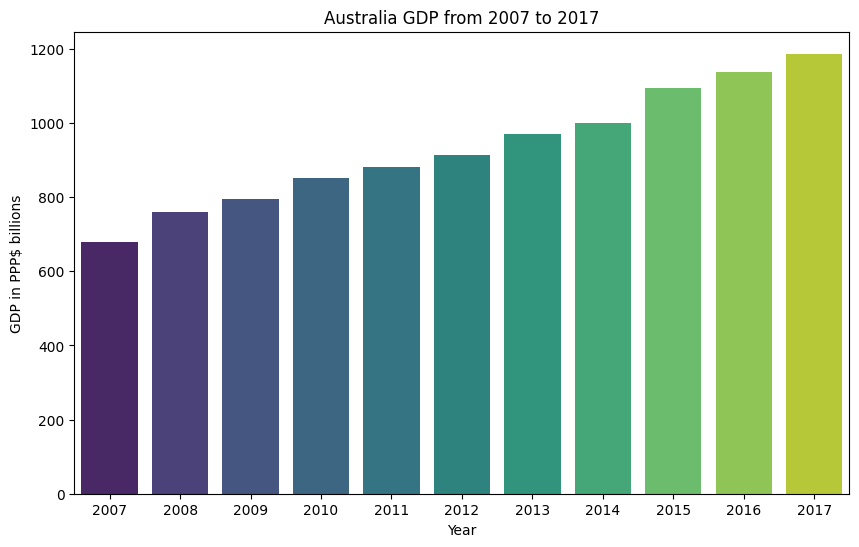

In [38]:
# Tracer le graphique en barres :
plt.figure(figsize=(10, 6))
sns.barplot(x='Year', y='GDP', data=australia_gdp, palette='viridis')

plt.title('Australia GDP from 2007 to 2017')
plt.ylabel('GDP in PPP$ billions')

plt.show()

# To do : Comprendre pourquoi 2007 et 2008 ont des ordres de grandeur abbérantes

# Analyse par pays

### Korea

#### Korea - Investissements énergie

In [39]:
# Filtre sur le pays pour avoir les postes d'investissement en énergie de 2007 à 2017
budgets_korea = budgets[budgets['Economy Name'] == 'Korea']
budgets_korea = budgets_korea.drop(columns={'Economy Name'})
budgets_korea

,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
153,Energy efficiency,158.801,151.771,160.843,166.444,152.633,189.883,173.239,173.883,175.284,181.952,224.707
154,Fossil fuels,115.552,95.804,136.186,135.243,119.07,157.152,176.102,155.116,155.498,91.879,83.219
155,Renewables,129.524,151.78,218.479,274.846,246.099,289.01,276.769,254.233,226.701,242.974,220.966
156,Nuclear,410.286,112.09,130.563,142.947,188.243,188.905,168.511,161.659,141.214,118.329,107.505
157,Hydrogen and fuel cells,73.429,126.927,93.986,86.056,78.814,58.779,58.193,48.524,45.597,59.593,59.251
158,Other power and storage technologies,47.995,88.623,120.67,127.895,118.507,156.38,176.334,190.369,191.383,180.641,158.838
159,Other cross-cutting technologies/research,0.0,31.093,36.705,44.504,35.314,25.254,37.007,35.923,41.864,48.828,52.997
160,Unallocated,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
161,Total Budget,935.586,758.088,897.433,977.935,938.68,1065.363,1066.156,1019.707,977.54,924.195,907.483


##### Répartition des investissements par type d'énergie pour une année donnée

In [40]:
# Focus uniquement sur 2017 pour sortir le pie chart de répartition des investissements
columns_to_drop_korea = [str(year) for year in range(2007, 2017)]
budgets_korea_2017 = budgets_korea.drop(columns=columns_to_drop_korea)
budgets_korea_2017

,Technology,2017
153,Energy efficiency,224.707
154,Fossil fuels,83.219
155,Renewables,220.966
156,Nuclear,107.505
157,Hydrogen and fuel cells,59.251
158,Other power and storage technologies,158.838
159,Other cross-cutting technologies/research,52.997
160,Unallocated,0.0
161,Total Budget,907.483


In [41]:
# Drop des lignes total & unallocated > à voir en fonction des pays
budgets_korea_2017 = budgets_korea_2017.head(7)
budgets_korea_2017

,Technology,2017
153,Energy efficiency,224.707
154,Fossil fuels,83.219
155,Renewables,220.966
156,Nuclear,107.505
157,Hydrogen and fuel cells,59.251
158,Other power and storage technologies,158.838
159,Other cross-cutting technologies/research,52.997


In [42]:
budgets_korea_2017.dtypes

Technology    object
2017          object
dtype: object

In [43]:
# Mise au bon format int pour les valeurs de l'année 2017
budgets_korea_2017['2017'] = budgets_korea_2017['2017'].astype(int)
budgets_korea_2017

/var/folders/f0/kz3pcppd42x67vkzrt_f2f4w0000gn/T/ipykernel_52158/3273726759.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  budgets_korea_2017['2017'] = budgets_korea_2017['2017'].astype(int)


,Technology,2017
153,Energy efficiency,224
154,Fossil fuels,83
155,Renewables,220
156,Nuclear,107
157,Hydrogen and fuel cells,59
158,Other power and storage technologies,158
159,Other cross-cutting technologies/research,52


In [44]:
# Tri des valeurs par ordre décroissant
budgets_korea_2017 = budgets_korea_2017.sort_values(by='2017', ascending=False)

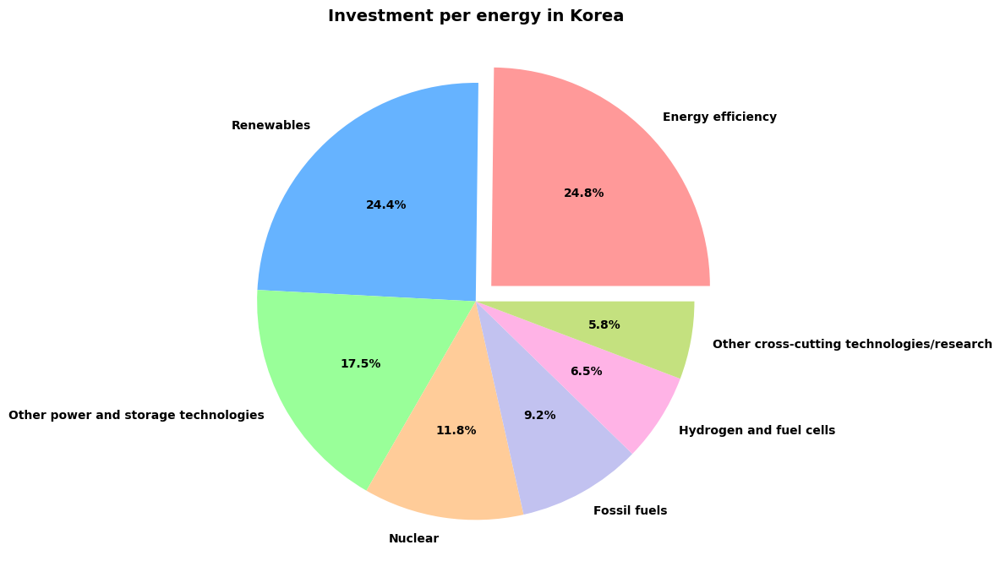

In [45]:
# Définir les données
sizes = budgets_korea_2017['2017']
labels = budgets_korea_2017['Technology']
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0','#ffb3e6','#c4e17f']
explode = [0.1 if size == max(sizes) else 0 for size in sizes]  # Explose seulement le plus grand segment

# Créer le graphique
plt.figure(figsize=(10, 7))
plt.pie(sizes, labels=labels, autopct='%0.1f%%', explode=explode, colors=colors, textprops={'weight': 'bold', 'fontsize': 10})
plt.title('Investment per energy in Korea', fontsize=14, weight='bold')
plt.tight_layout()
plt.show()

##### Evolution des investissements en énergie de 2007 à 2017

In [46]:
#retour au full années pour voir l'évolution des investissements sur la période complète et drop du total & unallocated > attention à voir en fonction du pays
budgets_korea

,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
153,Energy efficiency,158.801,151.771,160.843,166.444,152.633,189.883,173.239,173.883,175.284,181.952,224.707
154,Fossil fuels,115.552,95.804,136.186,135.243,119.07,157.152,176.102,155.116,155.498,91.879,83.219
155,Renewables,129.524,151.78,218.479,274.846,246.099,289.01,276.769,254.233,226.701,242.974,220.966
156,Nuclear,410.286,112.09,130.563,142.947,188.243,188.905,168.511,161.659,141.214,118.329,107.505
157,Hydrogen and fuel cells,73.429,126.927,93.986,86.056,78.814,58.779,58.193,48.524,45.597,59.593,59.251
158,Other power and storage technologies,47.995,88.623,120.67,127.895,118.507,156.38,176.334,190.369,191.383,180.641,158.838
159,Other cross-cutting technologies/research,0.0,31.093,36.705,44.504,35.314,25.254,37.007,35.923,41.864,48.828,52.997
160,Unallocated,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
161,Total Budget,935.586,758.088,897.433,977.935,938.68,1065.363,1066.156,1019.707,977.54,924.195,907.483


In [47]:
budgets_korea = budgets_korea.head(8)

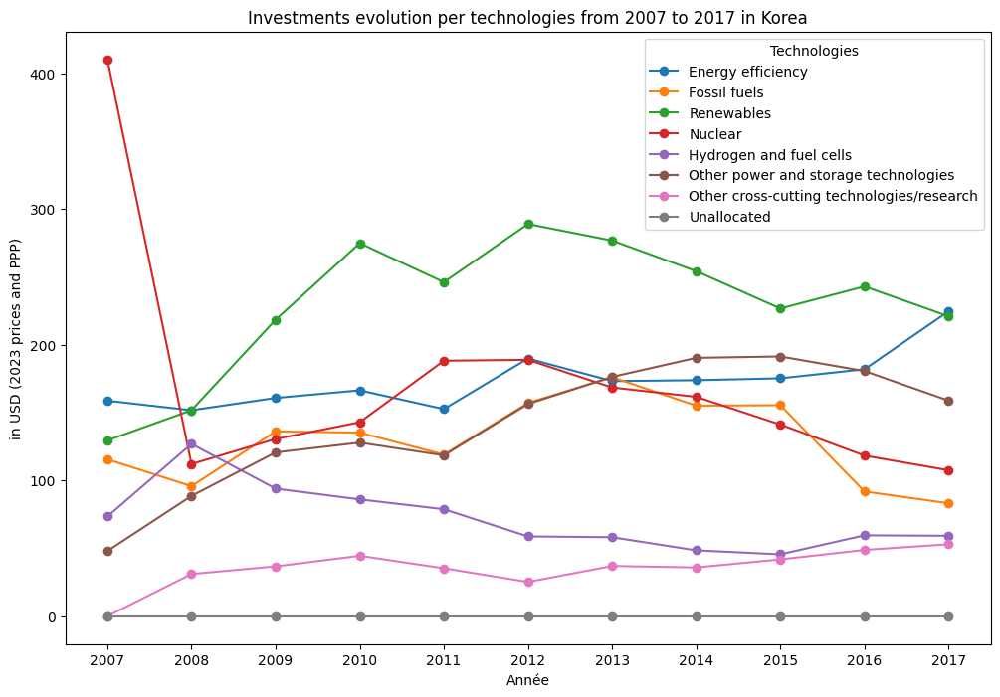

In [48]:
#graph dévolution des investissements
# Mettre 'Technology' comme index
budgets_korea.set_index('Technology', inplace=True)

# Création du graphique en ligne
plt.figure(figsize=(12, 8))

for tech in budgets_korea.index:
    plt.plot(budgets_korea.columns, budgets_korea.loc[tech], marker='o', label=tech)

plt.title('Investments evolution per technologies from 2007 to 2017 in Korea')
plt.xlabel('Année')
plt.ylabel('in USD (2023 prices and PPP)')
plt.legend(title='Technologies')
plt.grid(False)
plt.show()

##### Répartition des investissements ER sur total inv énergie de 2007 à 2017

In [49]:
budgets_korea

,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
Technology,,,,,,,,,,,
Energy efficiency,158.801,151.771,160.843,166.444,152.633,189.883,173.239,173.883,175.284,181.952,224.707
Fossil fuels,115.552,95.804,136.186,135.243,119.07,157.152,176.102,155.116,155.498,91.879,83.219
Renewables,129.524,151.78,218.479,274.846,246.099,289.01,276.769,254.233,226.701,242.974,220.966
Nuclear,410.286,112.09,130.563,142.947,188.243,188.905,168.511,161.659,141.214,118.329,107.505
Hydrogen and fuel cells,73.429,126.927,93.986,86.056,78.814,58.779,58.193,48.524,45.597,59.593,59.251
Other power and storage technologies,47.995,88.623,120.67,127.895,118.507,156.38,176.334,190.369,191.383,180.641,158.838
Other cross-cutting technologies/research,0.0,31.093,36.705,44.504,35.314,25.254,37.007,35.923,41.864,48.828,52.997
Unallocated,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [50]:
# On repasse le 'Technology' en en-tête
budgets_korea = budgets_korea.reset_index()
budgets_korea

,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,Energy efficiency,158.801,151.771,160.843,166.444,152.633,189.883,173.239,173.883,175.284,181.952,224.707
1,Fossil fuels,115.552,95.804,136.186,135.243,119.07,157.152,176.102,155.116,155.498,91.879,83.219
2,Renewables,129.524,151.78,218.479,274.846,246.099,289.01,276.769,254.233,226.701,242.974,220.966
3,Nuclear,410.286,112.09,130.563,142.947,188.243,188.905,168.511,161.659,141.214,118.329,107.505
4,Hydrogen and fuel cells,73.429,126.927,93.986,86.056,78.814,58.779,58.193,48.524,45.597,59.593,59.251
5,Other power and storage technologies,47.995,88.623,120.67,127.895,118.507,156.38,176.334,190.369,191.383,180.641,158.838
6,Other cross-cutting technologies/research,0.0,31.093,36.705,44.504,35.314,25.254,37.007,35.923,41.864,48.828,52.997
7,Unallocated,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [51]:
Technology_a_conserver = ['Renewables', 'Total Budget']

budgets_korea_ERtot = budgets_korea[budgets_korea['Technology'].isin(Technology_a_conserver)]
budgets_korea_ERtot

,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
2,Renewables,129.524,151.78,218.479,274.846,246.099,289.01,276.769,254.233,226.701,242.974,220.966


In [52]:
budgets_korea_ERtot.dtypes

Technology    object
2007          object
2008          object
2009          object
2010          object
2011          object
2012          object
2013          object
2014          object
2015          object
2016          object
2017          object
dtype: object

In [53]:
colonne_to_float = ['2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017']

In [54]:
budgets_korea_ERtot[colonne_to_float] = budgets_korea_ERtot[colonne_to_float].astype(float)

/var/folders/f0/kz3pcppd42x67vkzrt_f2f4w0000gn/T/ipykernel_52158/4214996569.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  budgets_korea_ERtot[colonne_to_float] = budgets_korea_ERtot[colonne_to_float].astype(float)


In [55]:
budgets_korea_ERtot.dtypes

Technology     object
2007          float64
2008          float64
2009          float64
2010          float64
2011          float64
2012          float64
2013          float64
2014          float64
2015          float64
2016          float64
2017          float64
dtype: object

In [56]:
budgets_korea_ERtot.set_index('Technology', inplace= True)

In [57]:
budgets_korea_ERtot2 = budgets_korea_ERtot.T
budgets_korea_ERtot2

Technology,Renewables
2007,129.524
2008,151.780
2009,218.479
2010,274.846
2011,246.099
2012,289.010
2013,276.769
2014,254.233
2015,226.701
2016,242.974


In [58]:
# Calculer la part des renouvelables et des autres pour chaque année
budgets_korea_ERtot2['Non-Renewables'] = budgets_korea_ERtot2['Total Budget'] - budgets_korea_ERtot2['Renewables']

KeyError: 'Total Budget'

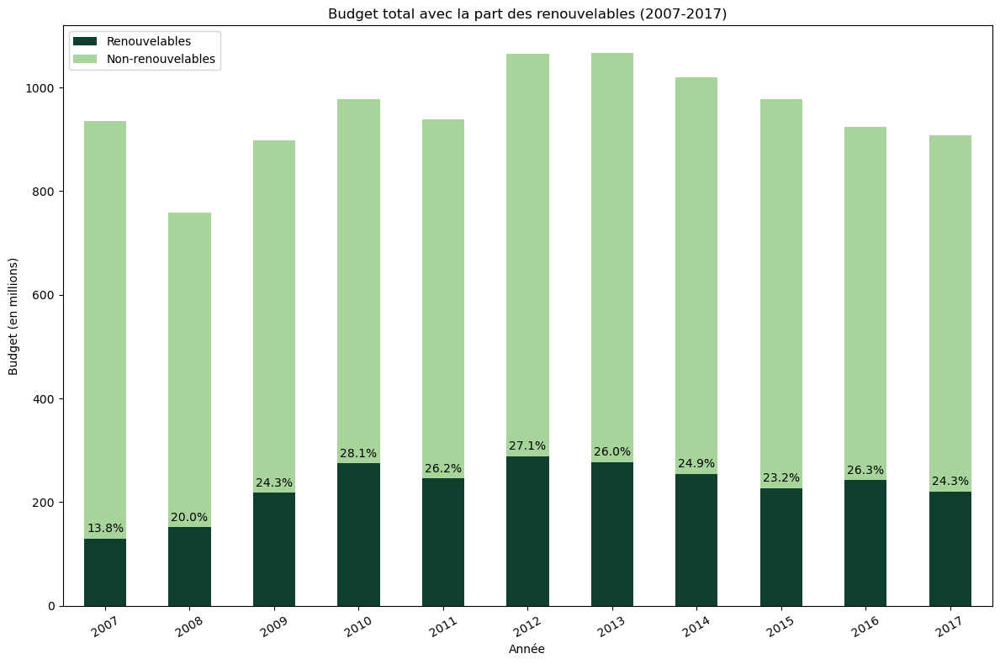

In [ ]:
#l'index était de type str donc je l'ai passé en int pour éviter l'erreur 
budgets_korea_ERtot2.index = budgets_korea_ERtot2.index.astype(int)

# Création de la figure et des axes
fig, ax = plt.subplots(figsize=(12, 8))

# Tracer les barres empilées
budgets_korea_ERtot2[['Renewables', 'Non-Renewables']].plot(kind='bar', stacked=True, ax=ax, color=['#0E402D', '#A7D49B'])

# Ajouter les annotations pour les pourcentages des renouvelables
for i, (index, row) in enumerate(budgets_korea_ERtot2.iterrows()):
    total = row['Total Budget']
    renewables = row['Renewables']
    percentage = renewables / total * 100
    ax.text(i, renewables + row['Non-Renewables'] * 0.01, f'{percentage:.1f}%', ha='center', va='bottom', fontsize=10, color='black')

# Configuration des étiquettes et du titre
ax.set_xlabel('Année')
ax.set_ylabel('Budget (en millions)')
ax.set_title('Budget total avec la part des renouvelables (2007-2017)')
ax.legend(['Renouvelables', 'Non-renouvelables'], loc='upper left')
ax.set_xticks(range(len(budgets_korea_ERtot2.index)))
ax.set_xticklabels(budgets_korea_ERtot2.index, rotation=30)
plt.tight_layout()
plt.show()

##### Ratio investissements ER / Total Energies 

In [59]:
# Ensemble des investissements en énergies renouvelables par pays sur la période complète
budgets_renewables = budgets[(budgets['Technology'] == 'Renewables')] 

In [60]:
#merge des deux data frames pour avoir l'ensemble des I en ER et le GDP par pays sur la période
budgets_renewables_gdp = budgets_renewables.merge(df_economy_gdp, on='Economy Name')


In [61]:
budgets_renewables_gdp.columns

Index(['Economy Name', 'Technology', '2007_x', '2008_x', '2009_x', '2010_x',
       '2011_x', '2012_x', '2013_x', '2014_x', '2015_x', '2016_x', '2017_x',
       '2007_y', '2008_y', '2009_y', '2010_y', '2011_y', '2012_y', '2013_y',
       '2014_y', '2015_y', '2016_y', '2017_y', 'Moyenne GCI'],
      dtype='object')

In [62]:
#clean des noms de colonnes 
budgets_renewables_gdp = budgets_renewables_gdp.rename(columns={'2007_x' : '2007_ER' , '2008_x' : '2008_ER', '2009_x' : '2009_ER', 
                                                                '2010_x' : '2010_ER',
       '2011_x' : '2011_ER', '2012_x' : '2012_ER', '2013_x' : '2013_ER' , '2014_x' : '2014_ER', '2015_x' : '2015_ER',
        '2016_x' : '2016_ER', '2017_x' : '2017_ER',
       '2007_y' : '2007_GDP', '2008_y' : '2008_GDP', '2009_y' : '2009_GDP', '2010_y' : '2010_GDP', '2011_y' : '2011_GDP', 
       '2012_y' : '2012_GDP', '2013_y' : '2013_GDP',
       '2014_y' : '2014_GDP', '2015_y' : '2015_GDP', '2016_y' : '2016_GDP', '2017_y' : '2017_GDP'})


In [63]:
#déplacement des colonnes pour regrouper les ER et GDP par année 
budgets_renewables_gdp = budgets_renewables_gdp[['Economy Name', 'Technology', '2007_ER',  '2007_GDP', '2008_ER', '2008_GDP', '2009_ER', '2009_GDP',
       '2010_ER', '2010_GDP', '2011_ER', '2011_GDP', '2012_ER', '2012_GDP', '2013_ER', '2013_GDP', '2014_ER', '2014_GDP', '2015_ER', '2015_GDP',
       '2016_ER', '2016_GDP', '2017_ER', '2017_GDP']]

In [64]:
# Fonction pour calculer la part des investissements en ER sur le total GDP
def calcul_part_ER_gdp (budgets_renewables_gdp):
        for year in range(2007, 2018):
            er_col = f'{year}_ER'
            gdp_col = f'{year}_GDP'
            share_col = f'{year}_ER_GDP_Share'
            budgets_renewables_gdp[share_col] = budgets_renewables_gdp[er_col] / budgets_renewables_gdp[gdp_col]
        return budgets_renewables_gdp

# Calculer la part des investissements en ER sur le total GDP
budgets_renewables_gdp_share = calcul_part_ER_gdp (budgets_renewables_gdp)

In [65]:
#drop des colonnes inutiles 
budgets_share_ER_GDP = budgets_renewables_gdp_share.drop(columns= ['2007_ER', '2007_GDP', '2008_ER',
       '2008_GDP', '2009_ER', '2009_GDP', '2010_ER', '2010_GDP', '2011_ER',
       '2011_GDP', '2012_ER', '2012_GDP', '2013_ER', '2013_GDP', '2014_ER',
       '2014_GDP', '2015_ER', '2015_GDP', '2016_ER', '2016_GDP', '2017_ER',
       '2017_GDP'] )

In [66]:
budgets_share_ER_GDP_Korea = budgets_share_ER_GDP[(budgets_share_ER_GDP['Economy Name'] == 'Korea')]
budgets_share_ER_GDP_Korea

,Economy Name,Technology,2007_ER_GDP_Share,2008_ER_GDP_Share,2009_ER_GDP_Share,2010_ER_GDP_Share,2011_ER_GDP_Share,2012_ER_GDP_Share,2013_ER_GDP_Share,2014_ER_GDP_Share,2015_ER_GDP_Share,2016_ER_GDP_Share,2017_ER_GDP_Share
17,Korea,Renewables,0.112088,0.126391,0.16276,0.201478,0.168648,0.18596,0.171489,0.152531,0.127445,0.131442,0.114252


In [67]:
#transposer pour préparer la visu histogramme
budgets_share_ER_GDP_Korea_T = budgets_share_ER_GDP_Korea.T
budgets_share_ER_GDP_Korea_T

,17
Economy Name,Korea
Technology,Renewables
2007_ER_GDP_Share,0.112088
2008_ER_GDP_Share,0.126391
2009_ER_GDP_Share,0.16276
2010_ER_GDP_Share,0.201478
2011_ER_GDP_Share,0.168648
2012_ER_GDP_Share,0.18596
2013_ER_GDP_Share,0.171489
2014_ER_GDP_Share,0.152531


In [68]:
budgets_share_ER_GDP_Korea_T = budgets_share_ER_GDP_Korea_T.drop(budgets_share_ER_GDP_Korea_T.index[0])

In [69]:
#Double drop index pour enlever les 2 premières lignes 
budgets_share_ER_GDP_Korea_T = budgets_share_ER_GDP_Korea_T.drop(budgets_share_ER_GDP_Korea_T.index[0])

In [70]:
budgets_share_ER_GDP_Korea_T = budgets_share_ER_GDP_Korea_T.reset_index()
budgets_share_ER_GDP_Korea_T

,index,17
0,2007_ER_GDP_Share,0.112088
1,2008_ER_GDP_Share,0.126391
2,2009_ER_GDP_Share,0.16276
3,2010_ER_GDP_Share,0.201478
4,2011_ER_GDP_Share,0.168648
5,2012_ER_GDP_Share,0.18596
6,2013_ER_GDP_Share,0.171489
7,2014_ER_GDP_Share,0.152531
8,2015_ER_GDP_Share,0.127445
9,2016_ER_GDP_Share,0.131442


In [71]:
budgets_share_ER_GDP_Korea_T = budgets_share_ER_GDP_Korea_T.rename(columns={'index':'annee', 17:'Part_ER_GDP'})
budgets_share_ER_GDP_Korea_T

,annee,Part_ER_GDP
0,2007_ER_GDP_Share,0.112088
1,2008_ER_GDP_Share,0.126391
2,2009_ER_GDP_Share,0.16276
3,2010_ER_GDP_Share,0.201478
4,2011_ER_GDP_Share,0.168648
5,2012_ER_GDP_Share,0.18596
6,2013_ER_GDP_Share,0.171489
7,2014_ER_GDP_Share,0.152531
8,2015_ER_GDP_Share,0.127445
9,2016_ER_GDP_Share,0.131442


In [72]:
budgets_share_ER_GDP_Korea_T['Part_ER_GDP_%'] = budgets_share_ER_GDP_Korea_T['Part_ER_GDP'] * 100
budgets_share_ER_GDP_Korea_T

,annee,Part_ER_GDP,Part_ER_GDP_%
0,2007_ER_GDP_Share,0.112088,11.208765
1,2008_ER_GDP_Share,0.126391,12.639065
2,2009_ER_GDP_Share,0.16276,16.275981
3,2010_ER_GDP_Share,0.201478,20.147784
4,2011_ER_GDP_Share,0.168648,16.864759
5,2012_ER_GDP_Share,0.18596,18.596017
6,2013_ER_GDP_Share,0.171489,17.148867
7,2014_ER_GDP_Share,0.152531,15.253126
8,2015_ER_GDP_Share,0.127445,12.74446
9,2016_ER_GDP_Share,0.131442,13.144245


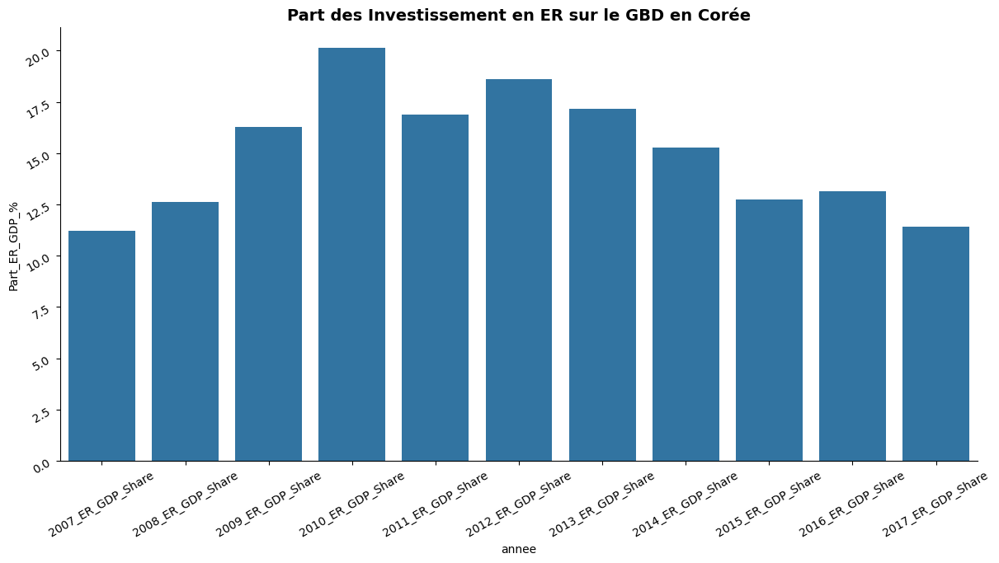

<Figure size 700x600 with 0 Axes>

In [73]:
sns.catplot(data=budgets_share_ER_GDP_Korea_T, x='annee', y='Part_ER_GDP_%', kind="bar", height=6, aspect=2)

plt.xticks(rotation=30)
plt.yticks(rotation=30)
plt.title('Part des Investissement en ER sur le GBD en Corée',  fontweight='bold', fontsize=14)
plt.figure(figsize=(7,6)) # autre option pour ajuster la taille
plt.show()

#### Korea - Economie

In [74]:
df_economy_korea = df_economy[(df_economy['Economy Name'] == 'Korea, Rep.') & (df_economy['Attribute 1'] == 'Value')]
df_economy_korea

,Economy ISO3,Economy Name,Indicator ID,Indicator,Attribute 1,Attribute 2,Attribute 3,Partner,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
6521,KOR,"Korea, Rep.",WEF.GCIHH.AIRSEATKM,"Available airline seat km/week, millions",Value,-,-,-,1588.43,1701.26,1647.86,1665.34,1920.23,2090.81,2167.37,2293.07,2445.99,2631.01,2830.55,NaN
6523,KOR,"Korea, Rep.",WEF.GCIHH.BBSUBPC,Fixed broadband Internet subscriptions/100 pop.,Value,-,-,-,25.24,29.27,31.98,33.82,36.63,36.91,37.56,38.04,38.78,40.25,41.13,NaN
6525,KOR,"Korea, Rep.",WEF.GCIHH.BRIBEIDX,"Irregular payments and bribes, 1-7 (best)",Value,-,-,-,NaN,NaN,NaN,4.62,4.52,4.44,4.35,4.39,4.48,4.45,4.67,NaN
6527,KOR,"Korea, Rep.",WEF.GCIHH.CCRATING,"Country credit rating, 0-100 (best)",Value,-,-,-,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81.69,NaN
6529,KOR,"Korea, Rep.",WEF.GCIHH.CORPTAXRATE,"Total tax rate, % profits",Value,-,-,-,30.90,34.90,33.70,31.90,29.80,29.70,29.80,27.90,32.40,33.20,33.10,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6837,KOR,"Korea, Rep.",WEF.GCIHH.SHRGDPWL,GDP (PPP) as share (%) of world total,Value,-,-,-,NaN,1.85,1.85,1.94,1.97,1.97,1.94,NaN,NaN,NaN,NaN,NaN
6839,KOR,"Korea, Rep.",WEF.GCIHH.STARTBUSDAYS,No. days to start a business,Value,-,-,-,22.00,17.00,17.00,14.00,14.00,7.00,7.00,5.50,4.00,4.00,4.00,NaN
6841,KOR,"Korea, Rep.",WEF.GCIHH.STARTBUSPROC,No. procedures to start a business,Value,-,-,-,12.00,10.00,10.00,8.00,8.00,5.00,5.00,5.00,3.00,3.00,2.00,NaN
6843,KOR,"Korea, Rep.",WEF.GCIHH.TBPC,"Tuberculosis cases/100,000 pop.",Value,-,-,-,96.41,88.00,90.00,88.00,90.00,97.00,100.00,108.00,97.00,86.00,80.00,NaN


In [75]:
## Je pense qu'on n'a pas besoin de ces lignes comme tu as déjà mis le clean tout en haut du script 
# Clean DF des colonnes inutiles
df_economy_korea = df_economy_korea.drop(columns=["Economy ISO3", "Economy Name", "Indicator ID", "Attribute 1", "Attribute 2", "Attribute 3", "Partner"])

##### Evolution GDP (PPP$ billions) 2007 to 2017

In [76]:
#Je pense qu'on n'a pas besoin de ces lignes comme tu as déjà mis le clean tout en haut du script 
df_economy_korea_gdp = df_economy_korea[df_economy_korea['Indicator'] == 'GDP (PPP$ billions)']
df_economy_korea_gdp

,Indicator,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
6799,GDP (PPP$ billions),1155565.0,1200879.0,1342.34,1364.15,1459.25,1554.15,1613.92,1666.76,1778.82,1848.52,1934.03,NaN


In [77]:
## Je pense qu'on n'a pas besoin de ces lignes comme tu as déjà mis le clean tout en haut du script 
df_economy_gdp

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
279,Australia,680.15,760.81,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,1138.08,1187.32,NaN
605,Austria,297.73,317.81,328.57,322.51,332.00,352.02,359.02,361.40,395.49,404.29,417.23,NaN
931,Belgium,364.65,375.99,389.52,382.75,394.35,413.28,420.31,422.81,481.47,494.12,509.53,NaN
1257,Brazil,1701.18,1835.64,1981.21,2013.19,2172.06,2294.24,2355.59,2423.31,3263.83,3192.40,3141.33,NaN
1583,Canada,1156.46,1265.84,1303.23,1281.06,1330.27,1396.13,1488.31,1526.08,1591.58,1631.94,1682.36,NaN
1909,Switzerland,272.30,300.19,312.75,314.87,324.51,339.89,363.42,371.57,472.83,482.35,495.96,NaN
2235,Chile,212.67,231.06,243.04,243.57,257.88,299.63,320.54,334.76,409.33,422.42,438.75,NaN
2561,Czechia,236.54,248.90,262.17,252.95,261.29,284.95,286.95,286.04,314.58,332.48,350.72,NaN
2887,Germany,2558.91,2809.69,2910.49,2806.27,2940.43,3099.08,3197.07,3232.54,3721.55,3840.55,3980.28,NaN
3213,Denmark,198.37,203.68,204.06,197.06,201.74,206.59,210.15,211.92,249.53,258.70,273.86,NaN


In [78]:
## Je pense qu'on n'a pas besoin de ces lignes comme tu as déjà mis le clean tout en haut du script 
# Diviser les valeurs des colonnes 2007 et 2008 par 100 pour corriger l'ordre de grandeur constaté sur ces 2 années
df_economy_korea_gdp['2007'] = df_economy_korea_gdp['2007'] / 1000
df_economy_korea_gdp['2008'] = df_economy_korea_gdp['2008'] / 1000

/var/folders/f0/kz3pcppd42x67vkzrt_f2f4w0000gn/T/ipykernel_52158/768647670.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_economy_korea_gdp['2007'] = df_economy_korea_gdp['2007'] / 1000
/var/folders/f0/kz3pcppd42x67vkzrt_f2f4w0000gn/T/ipykernel_52158/768647670.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_economy_korea_gdp['2008'] = df_economy_korea_gdp['2008'] / 1000


In [79]:
## Je pense qu'on n'a pas besoin de ces lignes comme tu as déjà mis le clean tout en haut du script 
# Vérifier que les valeurs 2007 et 2008 sont bien corrigées
df_economy_korea_gdp

,Indicator,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
6799,GDP (PPP$ billions),1155.565,1200.879,1342.34,1364.15,1459.25,1554.15,1613.92,1666.76,1778.82,1848.52,1934.03,NaN


In [80]:
df_economy_korea_gdp_t = df_economy_korea_gdp.set_index('Indicator').T
df_economy_korea_gdp_t.index.name = "Year"
df_economy_korea_gdp_t.reset_index(inplace=True)

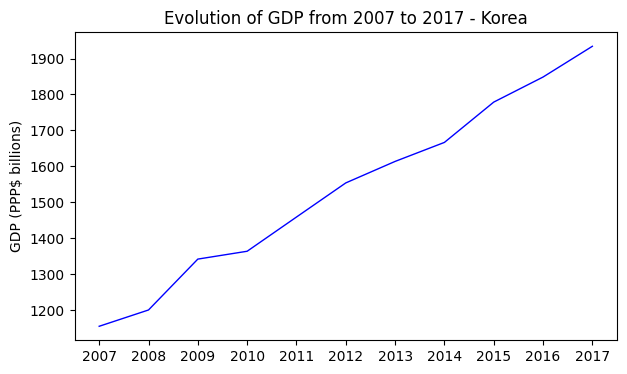

In [81]:
# Tracer le graphique en lignes
plt.figure(figsize=(7, 4))
plt.plot(df_economy_korea_gdp_t['Year'], df_economy_korea_gdp_t['GDP (PPP$ billions)'], linestyle='-', color='blue', linewidth=1)

# Ajouter des étiquettes et un titre
plt.ylabel('GDP (PPP$ billions)')
plt.title('Evolution of GDP from 2007 to 2017 - Korea')

# Afficher le graphique
plt.grid(False)
plt.show()

##### Pilliers 2007 versus 2017

In [82]:
# Liste des indicateurs que je souhaite conserver
indicators_to_keep = [
    "1st pillar: Institutions",
    "2nd pillar: Infrastructure",
    "3rd pillar: Macroeconomic environment",
    "4th pillar: Health and primary education",
    "5th pillar: Higher education and training",
    "6th pillar: Goods market efficiency",
    "7th pillar: Labor market efficiency",
    "8th pillar: Financial market development",
    "9th pillar: Technological readiness",
    "10th pillar: Market size",
    "11th pillar: Business sophistication",
    "12th pillar: Innovation",
    #"GDP (PPP$ billions)"
]


In [83]:
df_economy_korea

,Indicator,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
6521,"Available airline seat km/week, millions",1588.43,1701.26,1647.86,1665.34,1920.23,2090.81,2167.37,2293.07,2445.99,2631.01,2830.55,NaN
6523,Fixed broadband Internet subscriptions/100 pop.,25.24,29.27,31.98,33.82,36.63,36.91,37.56,38.04,38.78,40.25,41.13,NaN
6525,"Irregular payments and bribes, 1-7 (best)",NaN,NaN,NaN,4.62,4.52,4.44,4.35,4.39,4.48,4.45,4.67,NaN
6527,"Country credit rating, 0-100 (best)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81.69,NaN
6529,"Total tax rate, % profits",30.90,34.90,33.70,31.90,29.80,29.70,29.80,27.90,32.40,33.20,33.10,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6837,GDP (PPP) as share (%) of world total,NaN,1.85,1.85,1.94,1.97,1.97,1.94,NaN,NaN,NaN,NaN,NaN
6839,No. days to start a business,22.00,17.00,17.00,14.00,14.00,7.00,7.00,5.50,4.00,4.00,4.00,NaN
6841,No. procedures to start a business,12.00,10.00,10.00,8.00,8.00,5.00,5.00,5.00,3.00,3.00,2.00,NaN
6843,"Tuberculosis cases/100,000 pop.",96.41,88.00,90.00,88.00,90.00,97.00,100.00,108.00,97.00,86.00,80.00,NaN


In [84]:
# Dataframe Korea avec uniquement les indicateurs qui m'intéressent
df_economy_korea = df_economy_korea.loc[df_economy_korea['Indicator'].isin(indicators_to_keep)]
df_economy_korea

,Indicator,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
6711,1st pillar: Institutions,5.05,4.95,4.23,3.98,3.89,3.98,3.84,3.70,3.90,4.02,4.04,4.143636
6731,2nd pillar: Infrastructure,5.55,5.63,5.60,5.59,5.94,5.92,5.85,5.74,5.82,5.96,6.08,5.789091
6737,3rd pillar: Macroeconomic environment,6.00,6.15,5.80,5.76,6.37,6.25,6.32,6.44,6.58,6.58,6.63,6.261818
6739,4th pillar: Health and primary education,6.08,6.10,5.99,6.34,6.38,6.49,6.37,6.31,6.34,6.28,6.34,6.274545
6747,5th pillar: Higher education and training,5.65,5.51,5.24,5.42,5.44,5.52,5.41,5.38,5.36,5.32,5.34,5.417273
6755,6th pillar: Goods market efficiency,5.23,5.00,4.64,4.55,4.57,4.75,4.68,4.70,4.81,4.93,4.97,4.802727
6765,7th pillar: Labor market efficiency,4.79,4.60,4.22,4.27,4.30,4.35,4.21,4.07,4.08,4.14,4.18,4.291818
6771,8th pillar: Financial market development,5.15,4.85,4.36,3.99,3.95,4.06,3.89,3.81,3.60,3.86,3.90,4.129091
6777,9th pillar: Technological readiness,5.46,5.51,5.50,5.05,5.33,5.70,5.57,5.42,5.50,5.54,5.65,5.475455
6783,10th pillar: Market size,5.37,5.44,5.56,5.56,5.57,5.60,5.61,5.60,5.56,5.51,5.53,5.537273


In [85]:
# Extraire les données pour les années 2007 et 2017
data_2007 = df_economy_korea['2007']
data_2017 = df_economy_korea['2017']
indicators = df_economy_korea['Indicator']

In [86]:
# Trier le DataFrame par les valeurs de 2007
df_economy_korea_sorted = df_economy_korea.sort_values(by='2007', ascending=False)
df_economy_korea_sorted

,Indicator,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
6739,4th pillar: Health and primary education,6.08,6.10,5.99,6.34,6.38,6.49,6.37,6.31,6.34,6.28,6.34,6.274545
6737,3rd pillar: Macroeconomic environment,6.00,6.15,5.80,5.76,6.37,6.25,6.32,6.44,6.58,6.58,6.63,6.261818
6747,5th pillar: Higher education and training,5.65,5.51,5.24,5.42,5.44,5.52,5.41,5.38,5.36,5.32,5.34,5.417273
6731,2nd pillar: Infrastructure,5.55,5.63,5.60,5.59,5.94,5.92,5.85,5.74,5.82,5.96,6.08,5.789091
6791,11th pillar: Business sophistication,5.47,5.22,4.91,4.81,4.86,4.99,4.86,4.73,4.80,4.87,4.91,4.948182
6777,9th pillar: Technological readiness,5.46,5.51,5.50,5.05,5.33,5.70,5.57,5.42,5.50,5.54,5.65,5.475455
6783,10th pillar: Market size,5.37,5.44,5.56,5.56,5.57,5.60,5.61,5.60,5.56,5.51,5.53,5.537273
6793,12th pillar: Innovation,5.36,5.18,4.84,4.81,4.89,4.94,4.78,4.83,4.83,4.75,4.78,4.908182
6755,6th pillar: Goods market efficiency,5.23,5.00,4.64,4.55,4.57,4.75,4.68,4.70,4.81,4.93,4.97,4.802727
6771,8th pillar: Financial market development,5.15,4.85,4.36,3.99,3.95,4.06,3.89,3.81,3.60,3.86,3.90,4.129091


In [87]:
# Extraire les données triées pour les années 2007
data_2007 = df_economy_korea_sorted['2007']
indicators = df_economy_korea_sorted['Indicator']

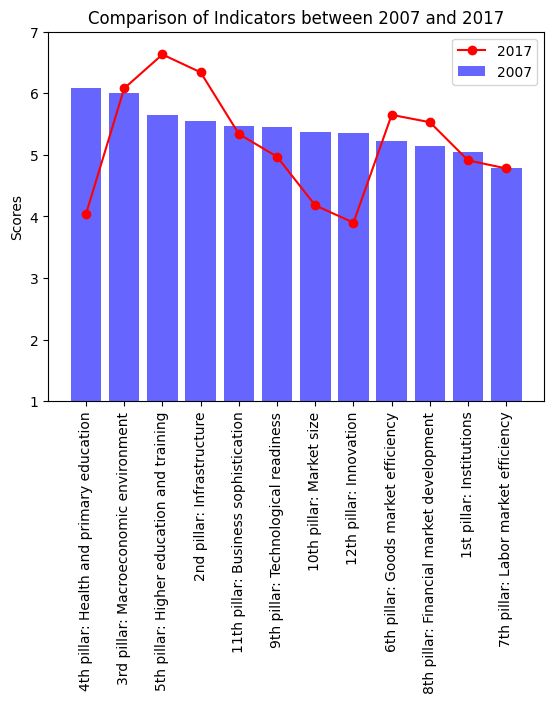

In [88]:
# Créer le graphique
fig, ax = plt.subplots()

# Créer l'histogramme pour l'année 2007
ax.bar(indicators, data_2007, color='b', alpha=0.6, label='2007')

# Ajouter une courbe pour l'année 2017
ax.plot(indicators, data_2017, color='r', marker='o', label='2017')

# Définir les limites de l'axe Y de 1 à 7
ax.set_ylim(1, 7)

# Ajouter des étiquettes et un titre
#ax.set_xlabel('Indicator')
ax.set_ylabel('Scores')
ax.set_title('Comparison of Indicators between 2007 and 2017')
ax.tick_params(axis='x', rotation=90)

# Ajouter une légende
ax.legend()


# Afficher le graphique
plt.show()

##### Pilliers comparatif au meilleur et moins bon pays sur une année donnée

In [89]:
df_economy_value = df_economy[(df_economy['Attribute 1'] == "Value")]

In [90]:
indices_a_conserver = ['1st pillar: Institutions', '2nd pillar: Infrastructure', '3rd pillar: Macroeconomic environment',
       '4th pillar: Health and primary education', '5th pillar: Higher education and training', '6th pillar: Goods market efficiency', 
       '7th pillar: Labor market efficiency', '8th pillar: Financial market development', '9th pillar: Technological readiness', 
       '10th pillar: Market size', '11th pillar: Business sophistication', '12th pillar: Innovation',]

df_economy_Monde = df_economy_value[df_economy_value['Indicator'].isin(indices_a_conserver)]
df_economy_Monde

,Economy ISO3,Economy Name,Indicator ID,Indicator,Attribute 1,Attribute 2,Attribute 3,Partner,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
191,AUS,Australia,WEF.GCIHH.GCI.A.01,1st pillar: Institutions,Value,-,-,-,5.66,5.72,5.60,5.49,5.39,5.27,5.04,5.14,5.31,5.32,5.35,5.390000
211,AUS,Australia,WEF.GCIHH.GCI.A.02,2nd pillar: Infrastructure,Value,-,-,-,5.53,5.33,5.19,5.44,5.43,5.70,5.60,5.60,5.66,5.65,5.27,5.490909
217,AUS,Australia,WEF.GCIHH.GCI.A.03,3rd pillar: Macroeconomic environment,Value,-,-,-,5.39,5.66,5.56,5.55,5.62,5.57,5.75,5.61,5.62,5.69,5.67,5.608182
219,AUS,Australia,WEF.GCIHH.GCI.A.04,4th pillar: Health and primary education,Value,-,-,-,6.26,6.27,6.18,6.49,6.51,6.46,6.36,6.46,6.54,6.56,6.52,6.419091
227,AUS,Australia,WEF.GCIHH.GCI.B.05,5th pillar: Higher education and training,Value,-,-,-,5.46,5.44,5.33,5.53,5.62,5.64,5.51,5.67,5.84,5.91,5.88,5.620909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10683,USA,United States,WEF.GCIHH.GCI.B.08,8th pillar: Financial market development,Value,-,-,-,5.68,5.61,4.96,4.67,4.87,5.07,5.26,5.35,5.45,5.56,5.73,5.291818
10689,USA,United States,WEF.GCIHH.GCI.B.09,9th pillar: Technological readiness,Value,-,-,-,5.43,5.57,5.61,5.10,5.23,5.84,5.72,5.78,5.85,6.02,6.23,5.670909
10695,USA,United States,WEF.GCIHH.GCI.B.10,10th pillar: Market size,Value,-,-,-,6.83,6.91,6.93,6.93,6.92,6.93,6.94,6.94,6.91,6.90,6.86,6.909091
10703,USA,United States,WEF.GCIHH.GCI.C.11,11th pillar: Business sophistication,Value,-,-,-,5.60,5.75,5.65,5.40,5.35,5.34,5.49,5.58,5.60,5.62,5.77,5.559091


In [91]:
df_economy_Monde = df_economy_Monde.drop(columns = ['Economy ISO3', 'Indicator ID', 'Attribute 1', 'Attribute 2', 'Attribute 3', 'Partner', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016'])

In [92]:
df_economy_par_pilier = df_economy_Monde.groupby('Economy Name')['2017'].mean().to_frame().reset_index()


In [93]:
df_economy_par_pilier.sort_values(by='2017', ascending=False).round(2)

,Economy Name,2017
29,Switzerland,5.93
32,United States,5.82
21,Netherlands,5.74
11,Germany,5.70
28,Sweden,5.58
9,Finland,5.56
31,United Kingdom,5.55
22,New Zealand,5.53
23,Norway,5.52
16,Japan,5.51


In [94]:
pays_a_conserver = ['Switzerland']

df_economy_Suisse = df_economy_Monde[df_economy_Monde['Economy Name'].isin(pays_a_conserver)]

In [95]:
pays_a_conserver = ['Brazil']

df_economy_Bresil = df_economy_Monde[df_economy_Monde['Economy Name'].isin(pays_a_conserver)]

In [96]:
pays_a_conserver = ['Korea, Rep.']

df_economy_Korea = df_economy_Monde[df_economy_Monde['Economy Name'].isin(pays_a_conserver)]


In [97]:
# Choisir deux années pour la visualisation
year = "2017"
values1 = df_economy_Suisse[year].values
values2 = df_economy_Korea[year].values
values3 = df_economy_Bresil[year].values
labels = df_economy_Korea["Indicator"]

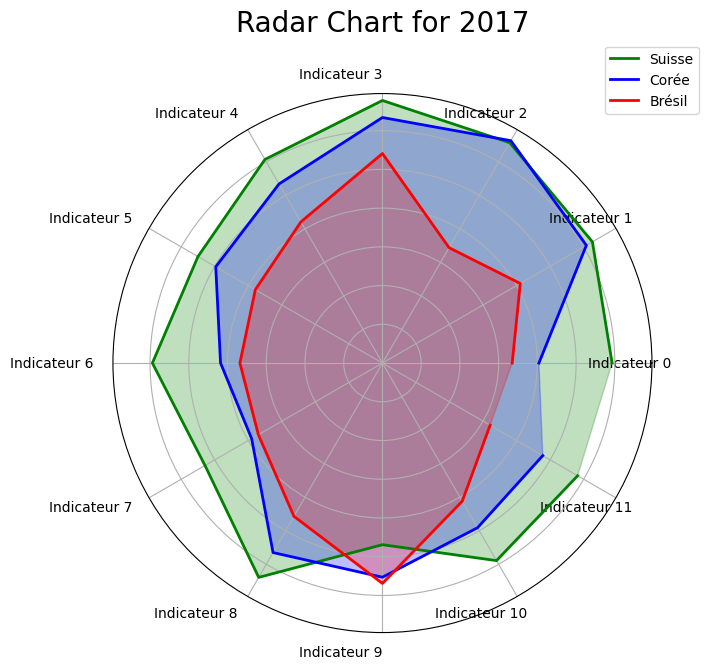

In [98]:
# Calculer les angles de chaque indicateur sur le graphique radar
angles = np.linspace(0, 2 * np.pi, 12, endpoint=False)

fig, ax = plt.subplots(figsize=(7, 7), subplot_kw=dict(polar=True))

# Tracer les données pour les Suisse = top country
ax.fill(angles, values1, color='green', alpha=0.25)
ax.plot(angles, values1, color='green', linewidth=2, label=str('Suisse'))

# Tracer les données pour la Corée
ax.fill(angles, values2, color='blue', alpha=0.25)
ax.plot(angles, values2, color='blue', linewidth=2, label=str('Corée'))

# Tracer les données pour le Brésil = flop country
ax.fill(angles, values3, color='red', alpha=0.25)
ax.plot(angles, values3, color='red', linewidth=2, label=str('Brésil'))

ax.set_yticklabels([])
ax.set_xticks(angles)
ax.set_xticklabels([f'Indicateur {i}' for i in range(12)], fontsize=10, rotation=45, ha='right')
ax.set_rlabel_position(0)

plt.title(f"Radar Chart for {year}", size=20, color='black', y=1.1)
plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1)) 
plt.show()

In [99]:
# pour tous les pays
df_economy_Monde2 = df_economy_Monde

In [100]:
df_economy_Monde2['Indicator'].unique()

array(['1st pillar: Institutions', '2nd pillar: Infrastructure',
       '3rd pillar: Macroeconomic environment',
       '4th pillar: Health and primary education',
       '5th pillar: Higher education and training',
       '6th pillar: Goods market efficiency',
       '7th pillar: Labor market efficiency',
       '8th pillar: Financial market development',
       '9th pillar: Technological readiness', '10th pillar: Market size',
       '11th pillar: Business sophistication', '12th pillar: Innovation'],
      dtype=object)

In [101]:
dic_pillars = {
'1st pillar: Institutions':'#1 Institutions', 
'2nd pillar: Infrastructure':'#2 Infrastructure',
'3rd pillar: Macroeconomic environment':'#3 Macroeconomic',
'4th pillar: Health and primary education':'#4 Health and primary education',
'5th pillar: Higher education and training':'#5 Higher education and training',
'6th pillar: Goods market efficiency':'#6 Goods market',
'7th pillar: Labor market efficiency':'#7 Labor market',
'8th pillar: Financial market development':'#8 Financial market',
'9th pillar: Technological readiness':'#9 Technological readiness', 
'10th pillar: Market size':'#10 Market size',
'11th pillar: Business sophistication':'#11 Business sophistication', 
'12th pillar: Innovation':'#12 Innovation'
}

In [102]:
df_economy_Monde2['Indicator'] = df_economy_Monde2['Indicator'].replace(dic_pillars)

In [103]:
df_economy_Monde2

,Economy Name,Indicator,2017,Moyenne GCI
191,Australia,#1 Institutions,5.35,5.390000
211,Australia,#2 Infrastructure,5.27,5.490909
217,Australia,#3 Macroeconomic,5.67,5.608182
219,Australia,#4 Health and primary education,6.52,6.419091
227,Australia,#5 Higher education and training,5.88,5.620909
...,...,...,...,...
10683,United States,#8 Financial market,5.73,5.291818
10689,United States,#9 Technological readiness,6.23,5.670909
10695,United States,#10 Market size,6.86,6.909091
10703,United States,#11 Business sophistication,5.77,5.559091


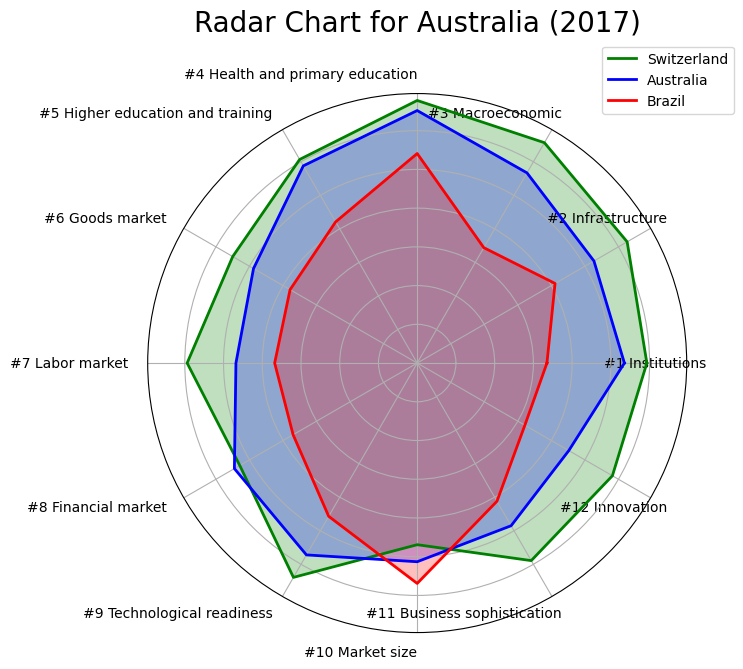

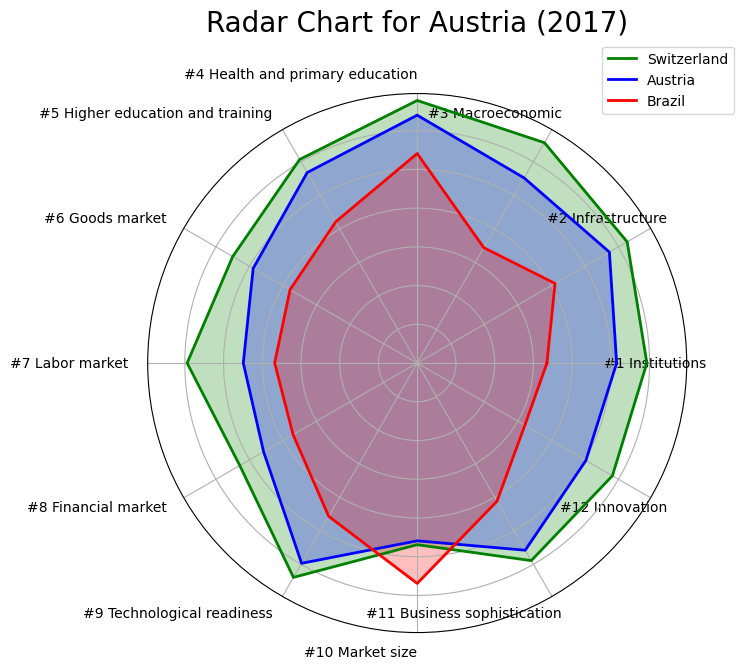

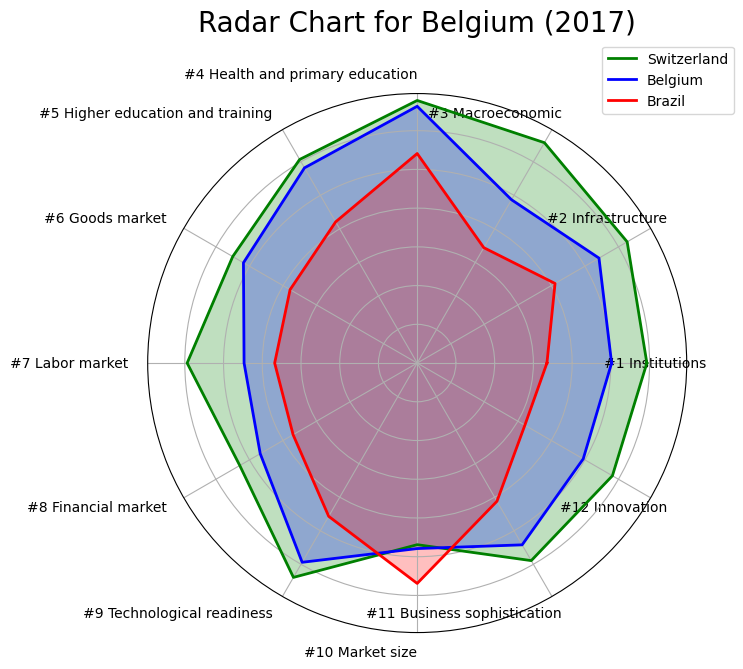

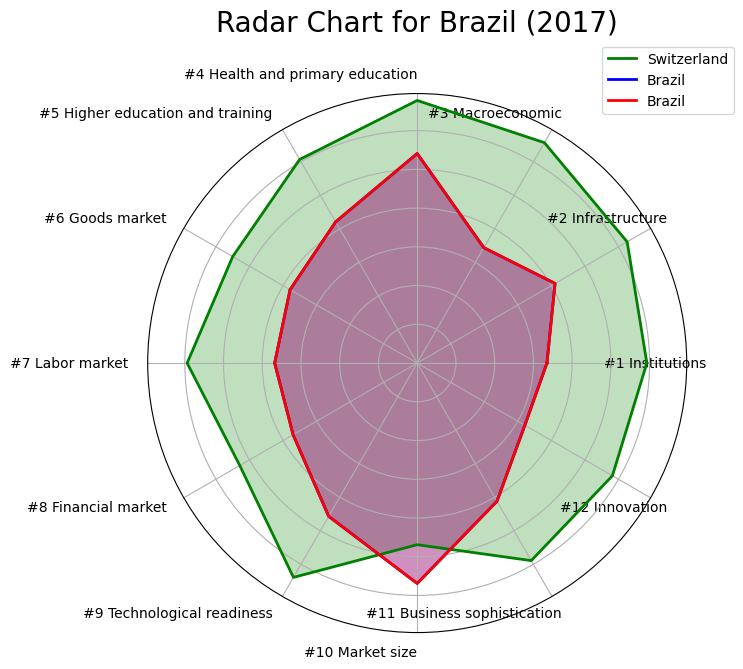

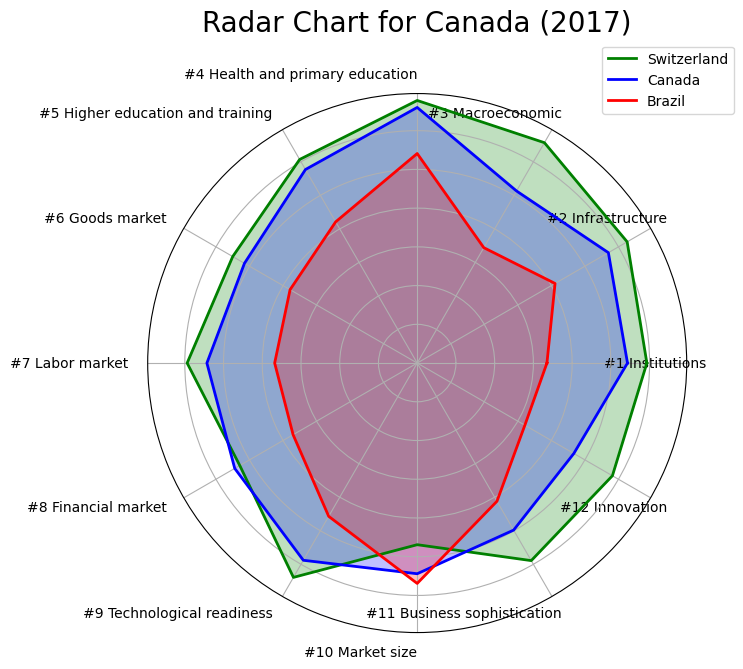

...

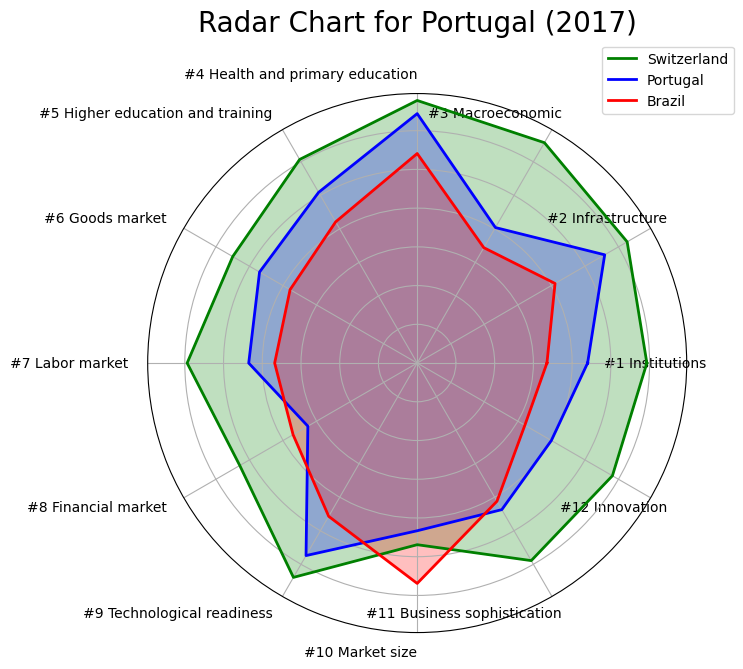

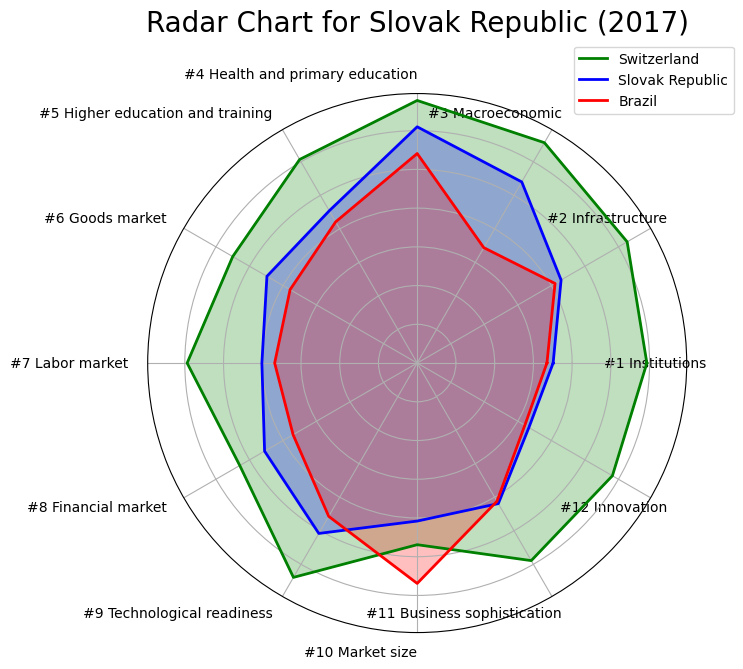

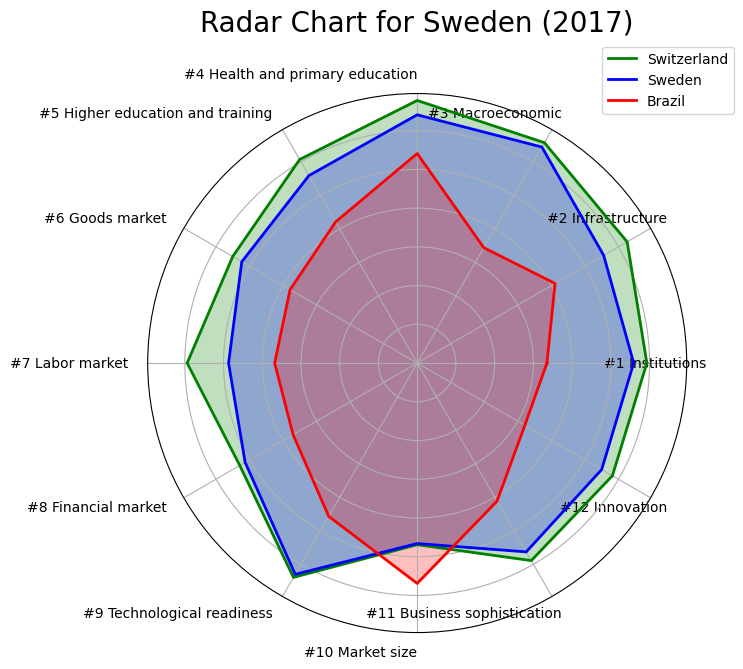

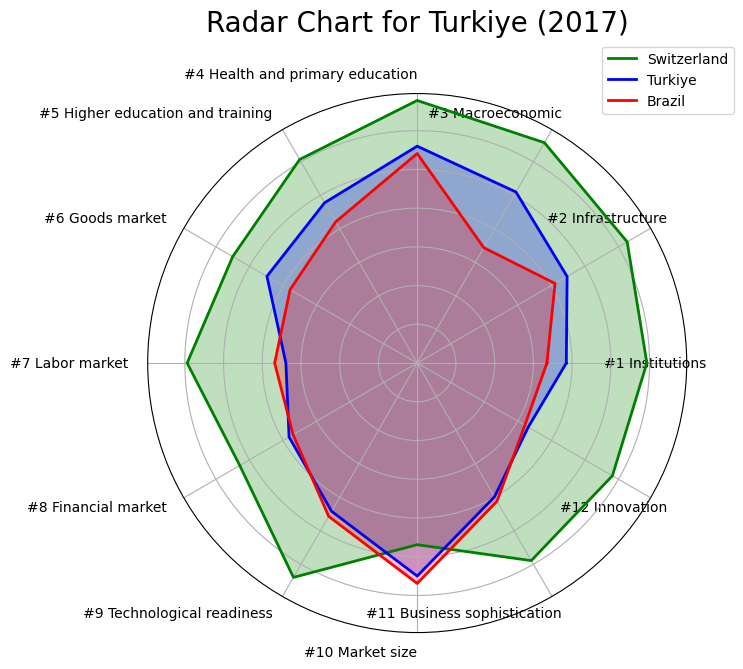

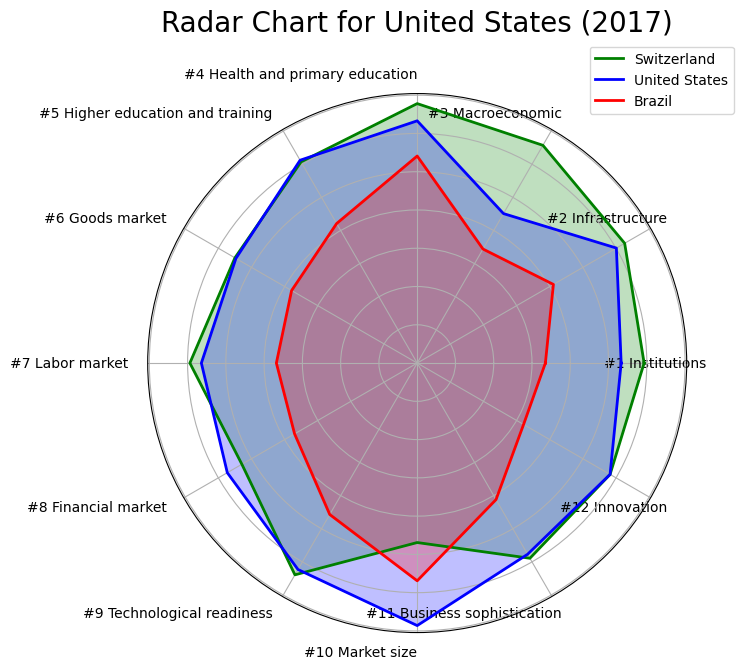

In [104]:

# Liste des pays pour lesquels générer des graphiques
countries = ['Australia', 'Austria', 'Belgium', 'Brazil', 'Canada',
       'Switzerland', 'Chile', 'Czechia', 'Germany', 'Denmark', 'Spain',
       'Estonia', 'Finland', 'France', 'United Kingdom', 'Greece',
       'Hungary', 'Ireland', 'Italy', 'Japan', 'Korea, Rep.', 'Lithuania',
       'Luxembourg', 'Mexico', 'Netherlands', 'Norway', 'New Zealand',
       'Poland', 'Portugal', 'Slovak Republic', 'Sweden', 'Turkiye',
       'United States']  

# Pays de référence
top_country = 'Switzerland'
flop_country = 'Brazil'

# Indicateurs à afficher sur le radar chart (assurez-vous qu'ils sont dans le même ordre pour chaque pays)
indicators = df_economy_Monde2['Indicator'].unique()

# Fonction pour générer un radar chart pour un pays donné
def generate_radar_chart(country):
    values_top = df_economy_Monde2[df_economy_Monde2['Economy Name'] == top_country]['2017'].values
    values_flop = df_economy_Monde2[df_economy_Monde2['Economy Name'] == flop_country]['2017'].values
    values_country = df_economy_Monde2[df_economy_Monde2['Economy Name'] == country]['2017'].values
    
    angles = np.linspace(0, 2 * np.pi, len(indicators), endpoint=False).tolist()
    values_top = np.concatenate((values_top,[values_top[0]]))
    values_flop = np.concatenate((values_flop,[values_flop[0]]))
    values_country = np.concatenate((values_country,[values_country[0]]))
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(7, 7), subplot_kw=dict(polar=True))
    
    ax.fill(angles, values_top, color='green', alpha=0.25)
    ax.plot(angles, values_top, color='green', linewidth=2, label=top_country)
    
    ax.fill(angles, values_country, color='blue', alpha=0.25)
    ax.plot(angles, values_country, color='blue', linewidth=2, label=country)
    
    ax.fill(angles, values_flop, color='red', alpha=0.25)
    ax.plot(angles, values_flop, color='red', linewidth=2, label=flop_country)
    
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(indicators, fontsize=10, rotation=45, ha='right')
    ax.set_rlabel_position(0)
    
    plt.title(f"Radar Chart for {country} (2017)", size=20, color='black', y=1.1)
    plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1)) 
    plt.show()

# Générer les graphiques pour chaque pays dans la liste
for country in countries:
    generate_radar_chart(country)

In [191]:
df_clusters = pd.read_excel('/Users/sophierojanathara/Library/CloudStorage/OneDrive-Personnel/DATABIRD/Cas pratique/Envir/01_Datasets/01_Dataset_Study/Clusters_MeanCGI2017.xlsx')
df_clusters

,Cluster,Pillier,Mean 2017
0,Low,1st pillar: Institutions,3.54
1,Low,2nd pillar: Infrastructure,4.56
2,Low,3rd pillar: Macroeconomic environment,4.67
3,Low,4th pillar: Health and primary education,5.89
4,Low,5th pillar: Higher education and training,4.60
5,Low,6th pillar: Goods market efficiency,4.32
6,Low,7th pillar: Labor market efficiency,3.82
7,Low,8th pillar: Financial market development,3.82
8,Low,9th pillar: Technological readiness,4.77
9,Low,10th pillar: Market size,5.04


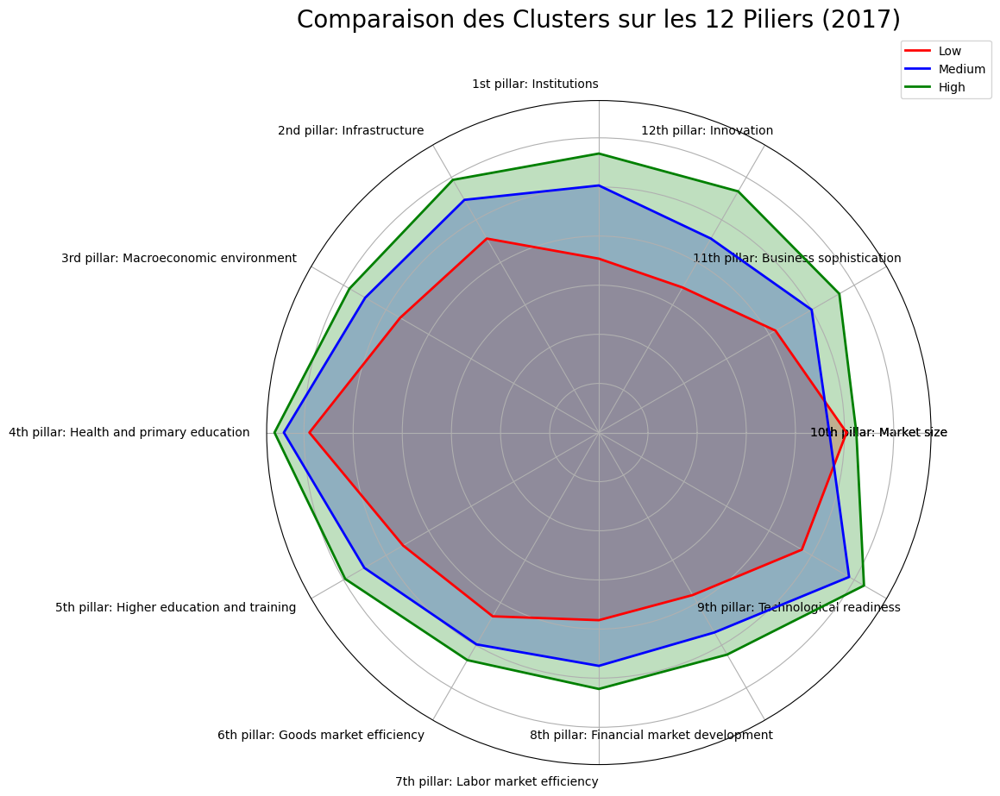

In [192]:

# Transformation des données pour le radar chart
df_pivot = df_clusters.pivot(index='Pillier', columns='Cluster', values='Mean 2017')
categories = list(df_pivot.index)

# Ajouter la première catégorie pour fermer le cercle
categories += categories[:1]

# Créer les angles pour le radar chart
angles = np.linspace(0, 2 * np.pi, len(categories) - 1, endpoint=False).tolist()
angles += angles[:1]

# Initialiser le radar chart
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

# Fonction pour ajouter les clusters au radar chart
def add_cluster_to_radar(cluster, color):
    values = df_pivot[cluster].tolist()
    values += values[:1]
    ax.fill(angles, values, color=color, alpha=0.25)
    ax.plot(angles, values, color=color, linewidth=2, label=cluster)

# Ajouter chaque cluster
add_cluster_to_radar('Low', 'red')
add_cluster_to_radar('Medium', 'blue')
add_cluster_to_radar('High', 'green')

# Ajouter les labels et les titres
ax.set_yticklabels([])
ax.set_xticks(angles)
ax.set_xticklabels(categories, fontsize=10, ha='right')
ax.set_rlabel_position(0)

plt.title('Comparaison des Clusters sur les 12 Piliers (2017)', size=20, color='black', y=1.1)
plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))
plt.show()

##### Investissement ER vs Totales - Moyenne periode par pays

In [105]:
budgets

,Economy Name,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,Australia,Energy efficiency,35.457,41.628,37.391,120.389,87.003,63.043,62.067,25.712,25.637,18.553,23.448
1,Australia,Fossil fuels,73.866,68.549,285.321,204.42,230.431,347.63,282.7,134.791,56.069,36.584,56.626
2,Australia,Renewables,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.56,57.124
3,Australia,Nuclear,16.184,24.807,2.756,2.722,5.357,10.193,7.7,6.819,7.937,15.168,8.356
4,Australia,Hydrogen and fuel cells,0.678,0.317,1.168,2.215,2.207,0.199,1.606,3.527,3.612,3.356,4.903
...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,United States,Hydrogen and fuel cells,454.24,445.975,491.541,454.262,347.14,155.215,185.866,182.032,156.122,125.645,123.496
293,United States,Other power and storage technologies,185.536,168.305,1270.275,375.142,238.398,133.373,144.127,349.796,312.478,212.652,249.368
294,United States,Other cross-cutting technologies/research,1686.355,1807.602,6.904,150.057,2887.136,3165.839,3027.6,2911.436,2857.543,2705.12,2695.016
295,United States,Unallocated,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,212.705,147.583


In [106]:
Technology_a_conserver = ['Renewables', 'Total Budget']

budgets_ER_Tot_global = budgets[budgets['Technology'].isin(Technology_a_conserver)]
budgets_ER_Tot_global

,Economy Name,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
2,Australia,Renewables,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.56,57.124
8,Australia,Total Budget,316.899,317.186,436.926,442.712,516.597,677.212,831.295,268.695,243.89,146.688,169.617
11,Austria,Renewables,28.002,45.348,59.308,60.608,58.045,48.935,50.33,54.151,36.128,48.91,33.92
17,Austria,Total Budget,60.247,131.915,168.024,217.982,213.993,208.263,212.668,239.072,209.746,226.036,221.335
20,Belgium,Renewables,27.484,18.322667,9.161333,0.0,29.66,29.787,32.115,44.781,28.922,24.496,25.865
...,...,...,...,...,...,...,...,...,...,...,...,...,...
278,Turkiye,Total Budget,17.751,14.839,18.024,44.8774,71.7308,98.5842,125.4376,152.291,140.699,190.5,215.823
281,United Kingdom,Renewables,158.628,96.647,183.484,336.986,115.737,113.824,169.652,129.922,129.435,223.382,181.618
287,United Kingdom,Total Budget,308.186,327.853,549.754,1026.915,691.138,615.712,769.826,645.428,704.755,881.552,1171.927
290,United States,Renewables,787.765,622.482,3045.899,1787.038,1551.141,1955.033,1266.488,1146.593,1130.971,896.19,823.019


In [107]:
budgets_ER_Tot_global.dtypes

Economy Name    object
Technology      object
2007            object
2008            object
2009            object
2010            object
2011            object
2012            object
2013            object
2014            object
2015            object
2016            object
2017            object
dtype: object

In [108]:
colonne_to_float = ['2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017']

In [109]:
budgets_ER_Tot_global[colonne_to_float] = budgets_ER_Tot_global[colonne_to_float].astype(float)

/var/folders/f0/kz3pcppd42x67vkzrt_f2f4w0000gn/T/ipykernel_52158/2697888857.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  budgets_ER_Tot_global[colonne_to_float] = budgets_ER_Tot_global[colonne_to_float].astype(float)


In [110]:
budgets_ER_Tot_global['Moyenne'] = budgets_ER_Tot_global[colonne_to_float].mean(axis = 1)
budgets_ER_Tot_global

/var/folders/f0/kz3pcppd42x67vkzrt_f2f4w0000gn/T/ipykernel_52158/4105907451.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  budgets_ER_Tot_global['Moyenne'] = budgets_ER_Tot_global[colonne_to_float].mean(axis = 1)


,Economy Name,Technology,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne
2,Australia,Renewables,50.553,43.747000,84.191000,89.5890,173.8030,226.1670,448.2830,81.671,131.836,48.560,57.124,130.502182
8,Australia,Total Budget,316.899,317.186000,436.926000,442.7120,516.5970,677.2120,831.2950,268.695,243.890,146.688,169.617,397.065182
11,Austria,Renewables,28.002,45.348000,59.308000,60.6080,58.0450,48.9350,50.3300,54.151,36.128,48.910,33.920,47.607727
17,Austria,Total Budget,60.247,131.915000,168.024000,217.9820,213.9930,208.2630,212.6680,239.072,209.746,226.036,221.335,191.752818
20,Belgium,Renewables,27.484,18.322667,9.161333,0.0000,29.6600,29.7870,32.1150,44.781,28.922,24.496,25.865,24.599455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
278,Turkiye,Total Budget,17.751,14.839000,18.024000,44.8774,71.7308,98.5842,125.4376,152.291,140.699,190.500,215.823,99.141545
281,United Kingdom,Renewables,158.628,96.647000,183.484000,336.9860,115.7370,113.8240,169.6520,129.922,129.435,223.382,181.618,167.210455
287,United Kingdom,Total Budget,308.186,327.853000,549.754000,1026.9150,691.1380,615.7120,769.8260,645.428,704.755,881.552,1171.927,699.367818
290,United States,Renewables,787.765,622.482000,3045.899000,1787.0380,1551.1410,1955.0330,1266.4880,1146.593,1130.971,896.190,823.019,1364.783545


In [111]:
columns_to_drop_2

['2018', '2019', '2020', '2021', '2022', '2023', '2024']

In [112]:
budgets_ER_Tot_moy = budgets_ER_Tot_global.drop(['2007', '2008', '2009', '2010','2011','2012','2013', '2014','2015','2016','2017'], axis=1) 
budgets_ER_Tot_moy

,Economy Name,Technology,Moyenne
2,Australia,Renewables,130.502182
8,Australia,Total Budget,397.065182
11,Austria,Renewables,47.607727
17,Austria,Total Budget,191.752818
20,Belgium,Renewables,24.599455
...,...,...,...
278,Turkiye,Total Budget,99.141545
281,United Kingdom,Renewables,167.210455
287,United Kingdom,Total Budget,699.367818
290,United States,Renewables,1364.783545


In [113]:
budgets_ER_Tot_moy_T = pd.pivot_table(budgets_ER_Tot_moy, values='Moyenne', index='Economy Name', columns='Technology')
budgets_ER_Tot_moy_T

Technology,Renewables,Total Budget
Economy Name,,
Australia,130.502182,397.065182
Austria,47.607727,191.752818
Belgium,24.599455,233.010000
Brazil,390.335400,1744.108000
Canada,144.439182,1029.898636
Chile,13.459750,14.609500
Czechia,16.301364,110.114000
Denmark,82.205545,180.944182
Estonia,3.661714,11.450714


In [114]:
budgets_ER_Tot_moy_T = budgets_ER_Tot_moy_T.reset_index()
budgets_ER_Tot_moy_T

Technology,Economy Name,Renewables,Total Budget
0,Australia,130.502182,397.065182
1,Austria,47.607727,191.752818
2,Belgium,24.599455,233.010000
3,Brazil,390.335400,1744.108000
4,Canada,144.439182,1029.898636
5,Chile,13.459750,14.609500
6,Czechia,16.301364,110.114000
7,Denmark,82.205545,180.944182
8,Estonia,3.661714,11.450714
9,Finland,61.912273,332.007909


In [115]:
budgets_ER_Tot_moy_T.columns

Index(['Economy Name', 'Renewables', 'Total Budget'], dtype='object', name='Technology')

In [116]:
budgets_ER_Tot_moy_T = budgets_ER_Tot_moy_T.rename_axis(None, axis=1)
budgets_ER_Tot_moy_T.set_index('Economy Name', inplace=True)

In [117]:
budgets_ER_Tot_moy_T = budgets_ER_Tot_moy_T.reset_index()

In [118]:
budgets_ER_Tot_moy_T

,Economy Name,Renewables,Total Budget
0,Australia,130.502182,397.065182
1,Austria,47.607727,191.752818
2,Belgium,24.599455,233.010000
3,Brazil,390.335400,1744.108000
4,Canada,144.439182,1029.898636
5,Chile,13.459750,14.609500
6,Czechia,16.301364,110.114000
7,Denmark,82.205545,180.944182
8,Estonia,3.661714,11.450714
9,Finland,61.912273,332.007909


In [119]:
budgets_ER_Tot_moy_T = budgets_ER_Tot_moy_T.sort_values(by='Total Budget', ascending=False)

In [120]:
# Calculer la part des renouvelables et des autres pour chaque année
budgets_ER_Tot_moy_T['Non-Renewables'] = budgets_ER_Tot_moy_T['Total Budget'] - budgets_ER_Tot_moy_T['Renewables']

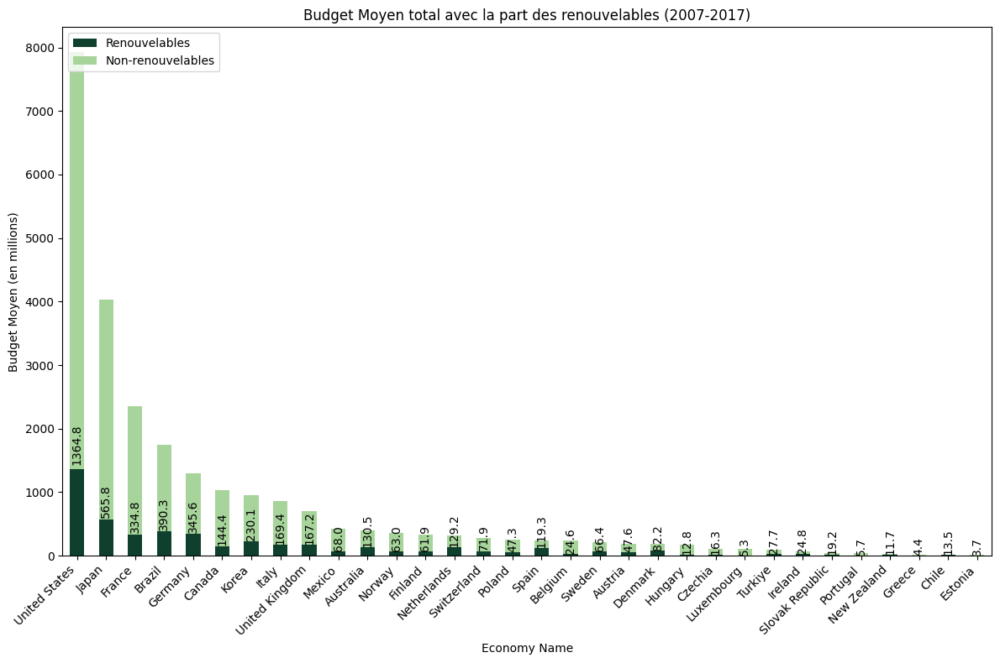

In [121]:
#l'index était de type str donc je l'ai passé en int pour éviter l'erreur 
budgets_ER_Tot_moy_T.index = budgets_ER_Tot_moy_T.index.astype(int)

# Création de la figure et des axes
fig, ax = plt.subplots(figsize=(12, 8))

# Tracer les barres empilées
budgets_ER_Tot_moy_T[['Renewables', 'Non-Renewables']].plot(kind='bar', stacked=True, ax=ax, color=['#0E402D', '#A7D49B'])

# Ajouter les annotations pour les pourcentages des renouvelables
for i, (index, row) in enumerate(budgets_ER_Tot_moy_T.iterrows()):
    total = row['Total Budget']
    renewables = row['Renewables']
    percentage = renewables / total
    ax.text(i, renewables + row['Non-Renewables'] * 0.01, f'{renewables:.1f}', ha='center', va='bottom', rotation=90, fontsize=10, color='black')

# Configuration des étiquettes et du titre
ax.set_xlabel('Economy Name')
ax.set_ylabel('Budget Moyen (en millions)')
ax.set_title('Budget Moyen total avec la part des renouvelables (2007-2017)')
ax.legend(['Renouvelables', 'Non-renouvelables'], loc='upper left')
ax.set_xticks(range(len(budgets_ER_Tot_moy_T.index)))
ax.set_xticklabels(budgets_ER_Tot_moy_T['Economy Name'], rotation=45, ha='right')
plt.tight_layout()
plt.show()

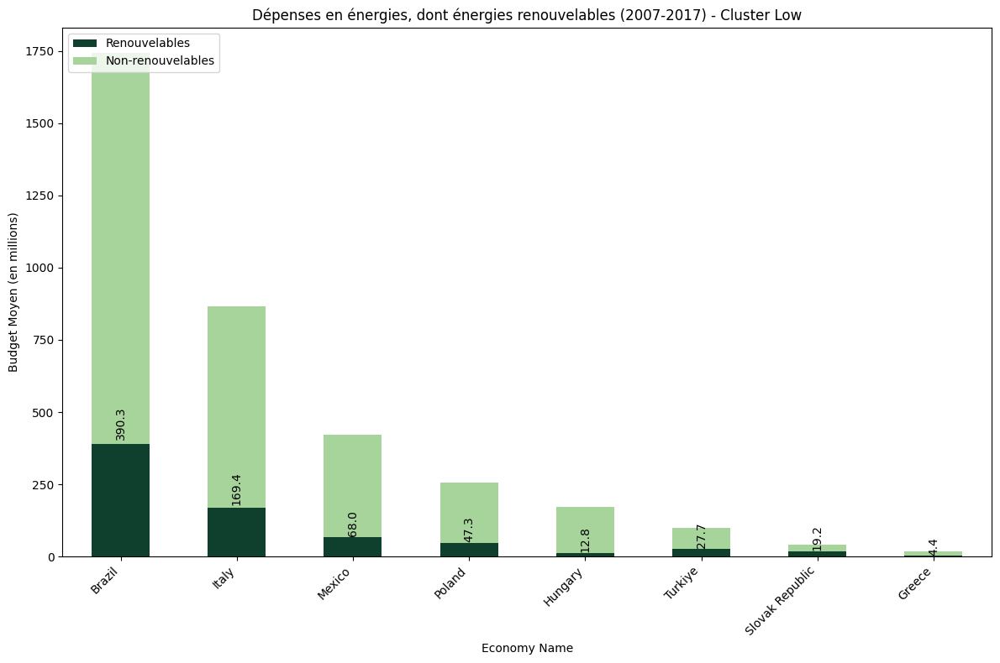

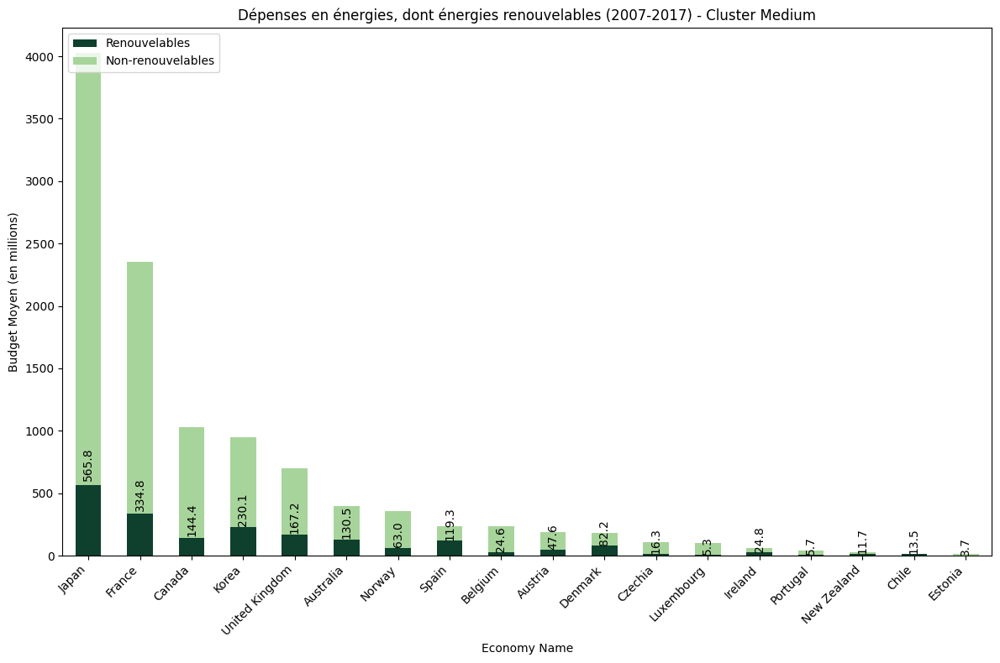

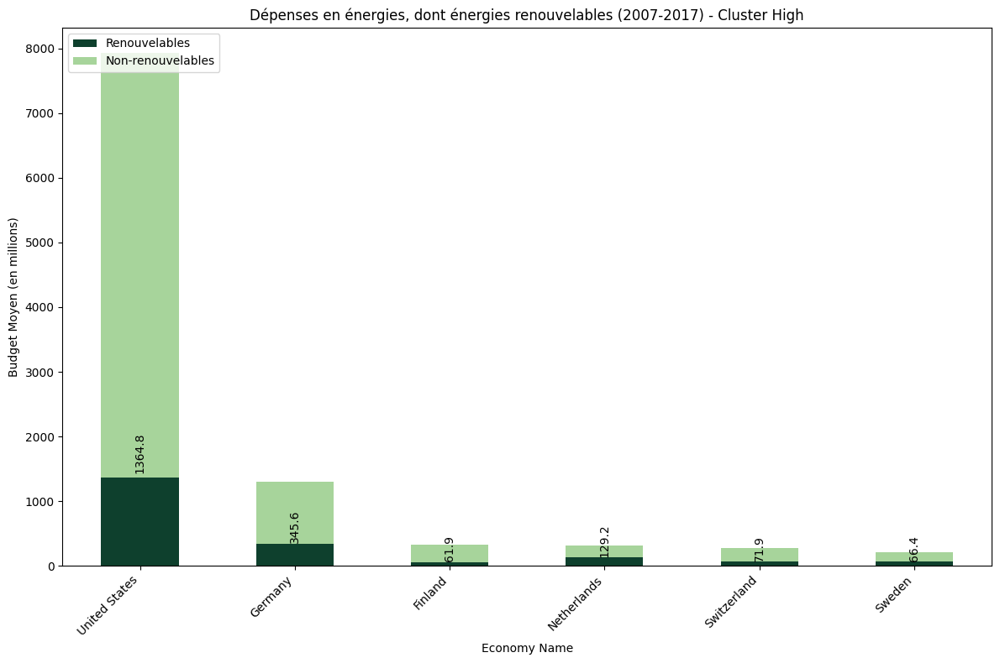

In [122]:
# Généré par Cluster 

# Définir les clusters
cluster_low = ['Brazil', 'Greece', 'Hungary', 'Italy', 'Mexico', 'Poland', 'Slovak Republic', 'Turkiye']
cluster_medium = ['Australia', 'Austria', 'Belgium', 'Canada', 'Chile', 'Czechia', 'Denmark', 'Estonia', 'France', 'Ireland', 'Japan', 'Korea', 'Lithuania', 'Luxembourg', 'New Zealand', 'Norway', 'Portugal', 'Spain', 'United Kingdom']
cluster_high = ['Finland', 'Germany', 'Netherlands', 'Sweden', 'Switzerland', 'United States']

# Filtrer les données par cluster
def plot_cluster(cluster, cluster_name):
    cluster_data = budgets_ER_Tot_moy_T[budgets_ER_Tot_moy_T['Economy Name'].isin(cluster)]
    
    fig, ax = plt.subplots(figsize=(12, 8))

    cluster_data[['Renewables', 'Non-Renewables']].plot(kind='bar', stacked=True, ax=ax, color=['#0E402D', '#A7D49B'])

    # Ajouter les annotations pour les pourcentages des renouvelables
    for i, (index, row) in enumerate(cluster_data.iterrows()):
        total = row['Total Budget']
        renewables = row['Renewables']
        percentage = renewables / total
        ax.text(i, renewables + row['Non-Renewables'] * 0.01, f'{renewables:.1f}', ha='center', va='bottom', rotation=90, fontsize=10, color='black')

    # Configuration des étiquettes et du titre
    ax.set_xlabel('Economy Name')
    ax.set_ylabel('Budget Moyen (en millions)')
    ax.set_title(f'Dépenses en énergies, dont énergies renouvelables (2007-2017) - {cluster_name}')
    ax.legend(['Renouvelables', 'Non-renouvelables'], loc='upper left')
    ax.set_xticks(range(len(cluster_data.index)))
    ax.set_xticklabels(cluster_data['Economy Name'], rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Tracer les graphiques pour chaque cluster
plot_cluster(cluster_low, 'Cluster Low')
plot_cluster(cluster_medium, 'Cluster Medium')
plot_cluster(cluster_high, 'Cluster High')


# Analyse globale

### Dataframes

#### Dataframe GDP par pays de 2007 à 2017

In [123]:
# GDP par pays de 2007 à 2008
df_economy_gdp

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
279,Australia,680.15,760.81,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,1138.08,1187.32,NaN
605,Austria,297.73,317.81,328.57,322.51,332.00,352.02,359.02,361.40,395.49,404.29,417.23,NaN
931,Belgium,364.65,375.99,389.52,382.75,394.35,413.28,420.31,422.81,481.47,494.12,509.53,NaN
1257,Brazil,1701.18,1835.64,1981.21,2013.19,2172.06,2294.24,2355.59,2423.31,3263.83,3192.40,3141.33,NaN
1583,Canada,1156.46,1265.84,1303.23,1281.06,1330.27,1396.13,1488.31,1526.08,1591.58,1631.94,1682.36,NaN
1909,Switzerland,272.30,300.19,312.75,314.87,324.51,339.89,363.42,371.57,472.83,482.35,495.96,NaN
2235,Chile,212.67,231.06,243.04,243.57,257.88,299.63,320.54,334.76,409.33,422.42,438.75,NaN
2561,Czechia,236.54,248.90,262.17,252.95,261.29,284.95,286.95,286.04,314.58,332.48,350.72,NaN
2887,Germany,2558.91,2809.69,2910.49,2806.27,2940.43,3099.08,3197.07,3232.54,3721.55,3840.55,3980.28,NaN
3213,Denmark,198.37,203.68,204.06,197.06,201.74,206.59,210.15,211.92,249.53,258.70,273.86,NaN


#### Dataframe GCI moyen par pays de 2007 à 2017

In [124]:
# Sélection des 12 pilliers à conserver pour l'étude
selected_indicators = [
    '1st pillar: Institutions',
    '2nd pillar: Infrastructure',
    '3rd pillar: Macroeconomic environment',
    '4th pillar: Health and primary education',
    '5th pillar: Higher education and training',
    '6th pillar: Goods market efficiency',
    '7th pillar: Labor market efficiency',
    '8th pillar: Financial market development',
    '9th pillar: Technological readiness',
    '10th pillar: Market size',
    '11th pillar: Business sophistication',
    '12th pillar: Innovation'
]

In [125]:
# Filtrer le DataFrame pour inclure uniquement les indicateurs sélectionnés (12 pilliers) et les valeurs (pas rank)
df_gci = df_economy[
    (df_economy['Indicator'].isin(selected_indicators)) &
    (df_economy['Attribute 1'] == "Value")
]

In [126]:
# Clean DF des colonnes inutiles
df_gci = df_gci.drop(columns=["Economy ISO3", "Indicator ID", "Attribute 1", "Attribute 2", "Attribute 3", "Partner"])
df_gci

,Economy Name,Indicator,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
191,Australia,1st pillar: Institutions,5.66,5.72,5.60,5.49,5.39,5.27,5.04,5.14,5.31,5.32,5.35,5.390000
211,Australia,2nd pillar: Infrastructure,5.53,5.33,5.19,5.44,5.43,5.70,5.60,5.60,5.66,5.65,5.27,5.490909
217,Australia,3rd pillar: Macroeconomic environment,5.39,5.66,5.56,5.55,5.62,5.57,5.75,5.61,5.62,5.69,5.67,5.608182
219,Australia,4th pillar: Health and primary education,6.26,6.27,6.18,6.49,6.51,6.46,6.36,6.46,6.54,6.56,6.52,6.419091
227,Australia,5th pillar: Higher education and training,5.46,5.44,5.33,5.53,5.62,5.64,5.51,5.67,5.84,5.91,5.88,5.620909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10683,United States,8th pillar: Financial market development,5.68,5.61,4.96,4.67,4.87,5.07,5.26,5.35,5.45,5.56,5.73,5.291818
10689,United States,9th pillar: Technological readiness,5.43,5.57,5.61,5.10,5.23,5.84,5.72,5.78,5.85,6.02,6.23,5.670909
10695,United States,10th pillar: Market size,6.83,6.91,6.93,6.93,6.92,6.93,6.94,6.94,6.91,6.90,6.86,6.909091
10703,United States,11th pillar: Business sophistication,5.60,5.75,5.65,5.40,5.35,5.34,5.49,5.58,5.60,5.62,5.77,5.559091


In [127]:
df_gci

,Economy Name,Indicator,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
191,Australia,1st pillar: Institutions,5.66,5.72,5.60,5.49,5.39,5.27,5.04,5.14,5.31,5.32,5.35,5.390000
211,Australia,2nd pillar: Infrastructure,5.53,5.33,5.19,5.44,5.43,5.70,5.60,5.60,5.66,5.65,5.27,5.490909
217,Australia,3rd pillar: Macroeconomic environment,5.39,5.66,5.56,5.55,5.62,5.57,5.75,5.61,5.62,5.69,5.67,5.608182
219,Australia,4th pillar: Health and primary education,6.26,6.27,6.18,6.49,6.51,6.46,6.36,6.46,6.54,6.56,6.52,6.419091
227,Australia,5th pillar: Higher education and training,5.46,5.44,5.33,5.53,5.62,5.64,5.51,5.67,5.84,5.91,5.88,5.620909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10683,United States,8th pillar: Financial market development,5.68,5.61,4.96,4.67,4.87,5.07,5.26,5.35,5.45,5.56,5.73,5.291818
10689,United States,9th pillar: Technological readiness,5.43,5.57,5.61,5.10,5.23,5.84,5.72,5.78,5.85,6.02,6.23,5.670909
10695,United States,10th pillar: Market size,6.83,6.91,6.93,6.93,6.92,6.93,6.94,6.94,6.91,6.90,6.86,6.909091
10703,United States,11th pillar: Business sophistication,5.60,5.75,5.65,5.40,5.35,5.34,5.49,5.58,5.60,5.62,5.77,5.559091


In [128]:
# Sélectionner les colonnes des années (de 2007 à 2017)
years = [str(year) for year in range(2007, 2018)]

In [129]:
# Grouper par 'Economy Name' et calculer la moyenne pour chaque groupe sur les années spécifiées
df_gci_mean_country_base = df_gci.groupby('Economy Name')[years].mean().reset_index()
df_gci_mean_country_base

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,Australia,5.317500,5.345000,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,5.326667
1,Austria,5.297500,5.314167,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,5.300833
2,Belgium,5.153333,5.215000,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,5.265833
3,Brazil,3.996667,4.137500,4.230833,4.267500,4.314167,4.415000,4.334167,4.332500,4.078333,4.027500,4.106667
4,Canada,5.439167,5.491667,5.435000,5.411667,5.437500,5.399167,5.340000,5.373333,5.443333,5.403333,5.468333
5,Chile,4.692500,4.670000,4.650833,4.625833,4.710000,4.742500,4.734167,4.740000,4.675000,4.700000,4.768333
6,Czechia,4.606667,4.683333,4.715833,4.665000,4.629167,4.611667,4.530833,4.660833,4.835833,4.869167,4.922500
7,Denmark,5.658333,5.685833,5.555833,5.414167,5.475833,5.345000,5.230833,5.374167,5.421667,5.425000,5.472500
8,Estonia,4.760000,4.798333,4.710000,4.703333,4.733333,4.816667,4.807500,4.900833,4.929167,4.986667,5.043333
9,Finland,5.559167,5.582500,5.507500,5.438333,5.529167,5.600000,5.583333,5.555833,5.511667,5.496667,5.556667


#### Dataframe Budgets Energies Renouvelables

In [130]:
# Attention, revoir le interpolate dans le code Dépenses en énergie car les ordres de grandeur ne sont pas OK
budgets_renewables = budgets[budgets['Technology'] == 'Renewables'].drop('Technology', axis=1)
budgets_renewables.rename(columns = {'Country' : 'Economy Name'}, inplace = True)
budgets_renewables.head(3)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
2,Australia,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.56,57.124
11,Austria,28.002,45.348,59.308,60.608,58.045,48.935,50.33,54.151,36.128,48.91,33.92
20,Belgium,27.484,18.322667,9.161333,0.0,29.66,29.787,32.115,44.781,28.922,24.496,25.865


In [131]:
# Aligner les noms des pays dans mes 2 df
budgets_renewables['Economy Name'] = budgets_renewables['Economy Name'].replace({'Czech Republic': 'Czechia','Korea, Rep.':'Korea','Republic of Türkiye':'Turkiye'})
budgets_renewables.head(2)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
2,Australia,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.56,57.124
11,Austria,28.002,45.348,59.308,60.608,58.045,48.935,50.33,54.151,36.128,48.91,33.92


In [132]:
budgets_renewables['Economy Name'].unique()

array(['Australia', 'Austria', 'Belgium', 'Brazil', 'Canada', 'Chile',
       'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany',
       'Greece', 'Hungary', 'Ireland', 'Italy', 'Japan', 'Korea',
       'Lithuania', 'Luxembourg', 'Mexico', 'Netherlands', 'New Zealand',
       'Norway', 'Poland', 'Portugal', 'Slovak Republic', 'Spain',
       'Sweden', 'Switzerland', 'Turkiye', 'United Kingdom',
       'United States'], dtype=object)

## GCI et Clusters

In [133]:
df_gci_mean_country_base

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,Australia,5.317500,5.345000,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,5.326667
1,Austria,5.297500,5.314167,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,5.300833
2,Belgium,5.153333,5.215000,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,5.265833
3,Brazil,3.996667,4.137500,4.230833,4.267500,4.314167,4.415000,4.334167,4.332500,4.078333,4.027500,4.106667
4,Canada,5.439167,5.491667,5.435000,5.411667,5.437500,5.399167,5.340000,5.373333,5.443333,5.403333,5.468333
5,Chile,4.692500,4.670000,4.650833,4.625833,4.710000,4.742500,4.734167,4.740000,4.675000,4.700000,4.768333
6,Czechia,4.606667,4.683333,4.715833,4.665000,4.629167,4.611667,4.530833,4.660833,4.835833,4.869167,4.922500
7,Denmark,5.658333,5.685833,5.555833,5.414167,5.475833,5.345000,5.230833,5.374167,5.421667,5.425000,5.472500
8,Estonia,4.760000,4.798333,4.710000,4.703333,4.733333,4.816667,4.807500,4.900833,4.929167,4.986667,5.043333
9,Finland,5.559167,5.582500,5.507500,5.438333,5.529167,5.600000,5.583333,5.555833,5.511667,5.496667,5.556667


In [134]:
# Calculer la moyenne pour chaque pays sur la période de 2007 à 2017
df_gci_mean_country_base['gci_mean_period']=df_gci_mean_country_base.iloc[:, 1:].mean(axis=1)
df_gci_mean_country_base

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,gci_mean_period
0,Australia,5.317500,5.345000,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,5.326667,5.292500
1,Austria,5.297500,5.314167,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,5.300833,5.245606
2,Belgium,5.153333,5.215000,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,5.265833,5.222121
3,Brazil,3.996667,4.137500,4.230833,4.267500,4.314167,4.415000,4.334167,4.332500,4.078333,4.027500,4.106667,4.203712
4,Canada,5.439167,5.491667,5.435000,5.411667,5.437500,5.399167,5.340000,5.373333,5.443333,5.403333,5.468333,5.422045
5,Chile,4.692500,4.670000,4.650833,4.625833,4.710000,4.742500,4.734167,4.740000,4.675000,4.700000,4.768333,4.700833
6,Czechia,4.606667,4.683333,4.715833,4.665000,4.629167,4.611667,4.530833,4.660833,4.835833,4.869167,4.922500,4.702803
7,Denmark,5.658333,5.685833,5.555833,5.414167,5.475833,5.345000,5.230833,5.374167,5.421667,5.425000,5.472500,5.459924
8,Estonia,4.760000,4.798333,4.710000,4.703333,4.733333,4.816667,4.807500,4.900833,4.929167,4.986667,5.043333,4.835379
9,Finland,5.559167,5.582500,5.507500,5.438333,5.529167,5.600000,5.583333,5.555833,5.511667,5.496667,5.556667,5.538258


In [135]:
df_clusters_gci = df_gci_mean_country_base[['Economy Name', 'gci_mean_period']]
df_clusters_gci

,Economy Name,gci_mean_period
0,Australia,5.292500
1,Austria,5.245606
2,Belgium,5.222121
3,Brazil,4.203712
4,Canada,5.422045
5,Chile,4.700833
6,Czechia,4.702803
7,Denmark,5.459924
8,Estonia,4.835379
9,Finland,5.538258


/var/folders/f0/kz3pcppd42x67vkzrt_f2f4w0000gn/T/ipykernel_52158/3968837231.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clusters_gci['Cluster'] = pd.cut(df_clusters_gci['gci_mean_period'], bins=bins, labels=labels, include_lowest=True)


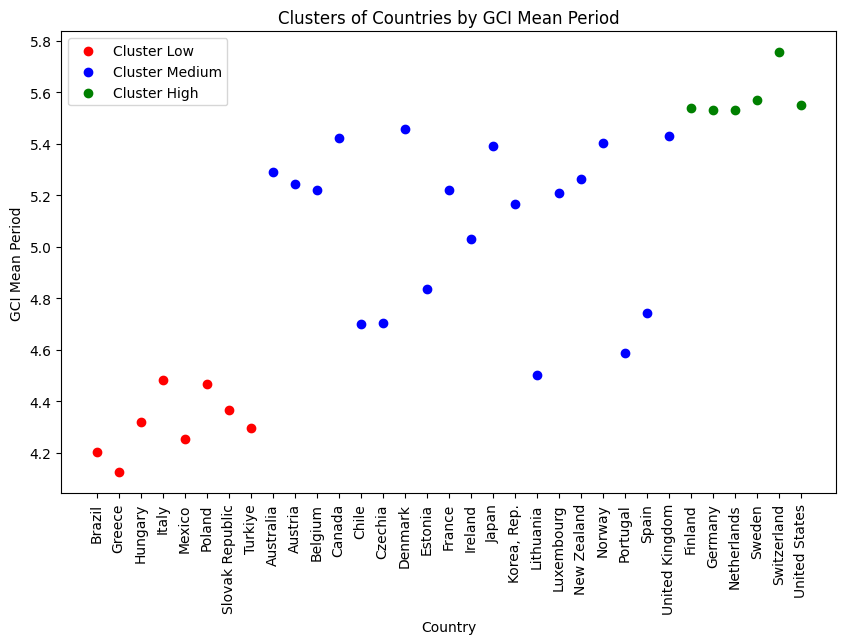

       Economy Name  gci_mean_period Cluster
0         Australia         5.292500  Medium
1           Austria         5.245606  Medium
2           Belgium         5.222121  Medium
3            Brazil         4.203712     Low
4            Canada         5.422045  Medium
5             Chile         4.700833  Medium
6           Czechia         4.702803  Medium
7           Denmark         5.459924  Medium
8           Estonia         4.835379  Medium
9           Finland         5.538258    High
10           France         5.221667  Medium
11          Germany         5.531515    High
12           Greece         4.124167     Low
13          Hungary         4.318182     Low
14          Ireland         5.031894  Medium
15            Italy         4.484091     Low
16            Japan         5.391288  Medium
17      Korea, Rep.         5.164924  Medium
18        Lithuania         4.504015  Medium
19       Luxembourg         5.210682  Medium
20           Mexico         4.255530     Low
21      Ne

In [136]:

# Définir les intervalles pour les clusters
# Par exemple, vous pouvez créer 3 clusters : bas, moyen et élevé
bins = [df_clusters_gci['gci_mean_period'].min(), 4.5, 5.5, df_clusters_gci['gci_mean_period'].max()]
labels = ['Low', 'Medium', 'High']

# Ajouter une colonne 'Cluster' au DataFrame
df_clusters_gci['Cluster'] = pd.cut(df_clusters_gci['gci_mean_period'], bins=bins, labels=labels, include_lowest=True)

# Visualiser les clusters
plt.figure(figsize=(10, 6))

colors = {'Low': 'red', 'Medium': 'blue', 'High': 'green'}
for cluster in labels:
    cluster_data = df_clusters_gci[df_clusters_gci['Cluster'] == cluster]
    plt.scatter(cluster_data['Economy Name'], cluster_data['gci_mean_period'], color=colors[cluster], label=f'Cluster {cluster}')

plt.xlabel('Country')
plt.ylabel('GCI Mean Period')
plt.title('Clusters of Countries by GCI Mean Period')
plt.legend()
plt.xticks(rotation=90)
plt.grid(False)
plt.show()

# Afficher le DataFrame avec les clusters
print(df_clusters_gci)

In [137]:
clus_low = df_clusters_gci[df_clusters_gci['Cluster'] == 'Low']
clus_low

,Economy Name,gci_mean_period,Cluster
3,Brazil,4.203712,Low
12,Greece,4.124167,Low
13,Hungary,4.318182,Low
15,Italy,4.484091,Low
20,Mexico,4.255530,Low
24,Poland,4.466591,Low
26,Slovak Republic,4.367652,Low
30,Turkiye,4.297727,Low


In [138]:
clus_low['Economy Name'].unique()

array(['Brazil', 'Greece', 'Hungary', 'Italy', 'Mexico', 'Poland',
       'Slovak Republic', 'Turkiye'], dtype=object)

In [139]:
clus_medium = df_clusters_gci[df_clusters_gci['Cluster'] == 'Medium']
clus_medium

,Economy Name,gci_mean_period,Cluster
0,Australia,5.292500,Medium
1,Austria,5.245606,Medium
2,Belgium,5.222121,Medium
4,Canada,5.422045,Medium
5,Chile,4.700833,Medium
6,Czechia,4.702803,Medium
7,Denmark,5.459924,Medium
8,Estonia,4.835379,Medium
10,France,5.221667,Medium
14,Ireland,5.031894,Medium


In [140]:
clus_medium['Economy Name'].unique()

array(['Australia', 'Austria', 'Belgium', 'Canada', 'Chile', 'Czechia',
       'Denmark', 'Estonia', 'France', 'Ireland', 'Japan', 'Korea, Rep.',
       'Lithuania', 'Luxembourg', 'New Zealand', 'Norway', 'Portugal',
       'Spain', 'United Kingdom'], dtype=object)

In [141]:
clus_high = df_clusters_gci[df_clusters_gci['Cluster'] == 'High']
clus_high

,Economy Name,gci_mean_period,Cluster
9,Finland,5.538258,High
11,Germany,5.531515,High
21,Netherlands,5.531742,High
28,Sweden,5.570227,High
29,Switzerland,5.755833,High
32,United States,5.551742,High


In [142]:
clus_high['Economy Name'].unique()

array(['Finland', 'Germany', 'Netherlands', 'Sweden', 'Switzerland',
       'United States'], dtype=object)

## CGI et Clusters V2 (retrait pays ss données)

In [196]:
df_clusters_gci_V2 = df_gci_mean_country_base[['Economy Name', 'gci_mean_period']]
df_clusters_gci_V2

,Economy Name,gci_mean_period
0,Australia,5.292500
1,Austria,5.245606
2,Belgium,5.222121
3,Brazil,4.203712
4,Canada,5.422045
5,Chile,4.700833
6,Czechia,4.702803
7,Denmark,5.459924
8,Estonia,4.835379
9,Finland,5.538258


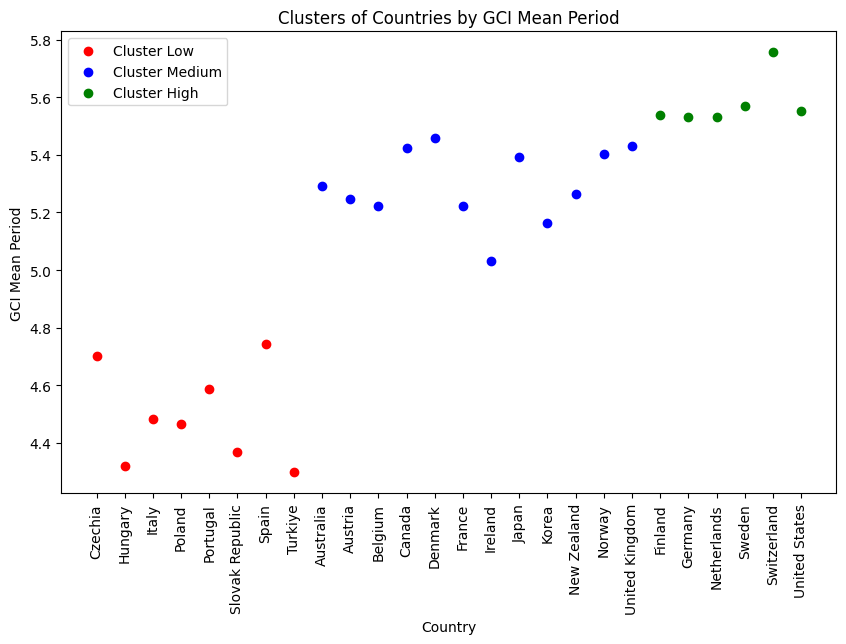

       Economy Name  gci_mean_period Cluster
0         Australia         5.292500  Medium
1           Austria         5.245606  Medium
2           Belgium         5.222121  Medium
4            Canada         5.422045  Medium
6           Czechia         4.702803     Low
7           Denmark         5.459924  Medium
9           Finland         5.538258    High
10           France         5.221667  Medium
11          Germany         5.531515    High
13          Hungary         4.318182     Low
14          Ireland         5.031894  Medium
15            Italy         4.484091     Low
16            Japan         5.391288  Medium
17            Korea         5.164924  Medium
21      Netherlands         5.531742    High
22      New Zealand         5.264773  Medium
23           Norway         5.403864  Medium
24           Poland         4.466591     Low
25         Portugal         4.587045     Low
26  Slovak Republic         4.367652     Low
27            Spain         4.742803     Low
28        

In [198]:

# Retirer les pays spécifiques
countries_to_remove = ['Greece', 'Lithuania', 'Brazil', 'Chile', 'Estonia', 'Luxembourg', 'Mexico']
df_clusters_gci_V2 = df_clusters_gci_V2[~df_clusters_gci_V2['Economy Name'].isin(countries_to_remove)]

# Recalculer les intervalles pour les clusters
bins = [df_clusters_gci_V2['gci_mean_period'].min(), 4.8, 5.5, df_clusters_gci_V2['gci_mean_period'].max()]
labels = ['Low', 'Medium', 'High']

# Ajouter une colonne 'Cluster' au DataFrame
df_clusters_gci_V2['Cluster'] = pd.cut(df_clusters_gci_V2['gci_mean_period'], bins=bins, labels=labels, include_lowest=True)

# Visualiser les clusters
plt.figure(figsize=(10, 6))

colors = {'Low': 'red', 'Medium': 'blue', 'High': 'green'}
for cluster in labels:
    cluster_data = df_clusters_gci_V2[df_clusters_gci_V2['Cluster'] == cluster]
    plt.scatter(cluster_data['Economy Name'], cluster_data['gci_mean_period'], color=colors[cluster], label=f'Cluster {cluster}')

plt.xlabel('Country')
plt.ylabel('GCI Mean Period')
plt.title('Clusters of Countries by GCI Mean Period')
plt.legend()
plt.xticks(rotation=90)
plt.grid(False)
plt.show()

# Afficher le DataFrame avec les clusters
print(df_clusters_gci_V2)

## KPI's comparatifs

### Top pays en investissements ER (2007-2017)

In [143]:
budgets_renewables

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
2,Australia,50.553,43.747,84.191,89.589,173.803,226.167,448.283,81.671,131.836,48.56,57.124
11,Austria,28.002,45.348,59.308,60.608,58.045,48.935,50.33,54.151,36.128,48.91,33.92
20,Belgium,27.484,18.322667,9.161333,0.0,29.66,29.787,32.115,44.781,28.922,24.496,25.865
29,Brazil,NaN,NaN,NaN,NaN,NaN,NaN,421.388,502.598,399.46,330.241,297.99
38,Canada,84.813,103.536,168.995,167.776,196.938,225.268,134.36,117.747,144.331,121.561,123.506
47,Chile,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.944,11.74,9.488,12.667
56,Czechia,3.239,14.504,17.274,16.814,27.03,22.797,14.155,14.069,17.55,15.384,16.499
65,Denmark,60.043,66.714,79.416,116.253,108.223,88.737,113.492,76.134,94.884,62.323,38.042
74,Estonia,NaN,NaN,NaN,NaN,12.435,0.42,3.629,2.545,2.967,2.649,0.987
83,Finland,56.76,58.03,70.931,66.722,90.959,57.42,75.19,47.815,54.073,48.433,54.702


In [144]:
budgets_renewables[colonne_to_float] = budgets_renewables[colonne_to_float].astype(float)

In [145]:
budgets_renewables.head(3)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
2,Australia,50.553,43.747000,84.191000,89.589,173.803,226.167,448.283,81.671,131.836,48.560,57.124
11,Austria,28.002,45.348000,59.308000,60.608,58.045,48.935,50.330,54.151,36.128,48.910,33.920
20,Belgium,27.484,18.322667,9.161333,0.000,29.660,29.787,32.115,44.781,28.922,24.496,25.865


In [146]:
budgets_renewables.dtypes

Economy Name     object
2007            float64
2008            float64
2009            float64
2010            float64
2011            float64
2012            float64
2013            float64
2014            float64
2015            float64
2016            float64
2017            float64
dtype: object

In [147]:
budgets_renewables['Period 2007-2017'] = budgets_renewables[years].sum(axis=1, skipna=True).round(2)
budgets_renewables.head(3)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Period 2007-2017
2,Australia,50.553,43.747000,84.191000,89.589,173.803,226.167,448.283,81.671,131.836,48.560,57.124,1435.52
11,Austria,28.002,45.348000,59.308000,60.608,58.045,48.935,50.330,54.151,36.128,48.910,33.920,523.68
20,Belgium,27.484,18.322667,9.161333,0.000,29.660,29.787,32.115,44.781,28.922,24.496,25.865,270.59


In [148]:
#Display the best values of the total in ER for the period 2007-2017
budgets_renewables.sort_values(by= 'Period 2007-2017', ascending= False).head(5)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Period 2007-2017
290,United States,787.765,622.482,3045.899,1787.038,1551.141,1955.033,1266.488,1146.593,1130.971,896.190,823.019,15012.62
146,Japan,235.353,231.091,149.684,244.473,1124.380,976.719,909.320,859.617,582.548,493.016,417.937,6224.14
101,Germany,174.564,224.299,341.314,349.592,444.060,429.055,450.964,329.721,351.803,315.693,390.165,3801.23
92,France,190.573,242.249,388.578,298.582,368.301,357.516,411.219,396.133,392.506,351.413,285.457,3682.53
155,Korea,129.524,151.780,218.479,274.846,246.099,289.010,276.769,254.233,226.701,242.974,220.966,2531.38


/var/folders/f0/kz3pcppd42x67vkzrt_f2f4w0000gn/T/ipykernel_52158/2790360620.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Economy Name', y='Period 2007-2017', data=budgets_renewables.sort_values(by= 'Period 2007-2017', ascending= False).head(5), palette='viridis')


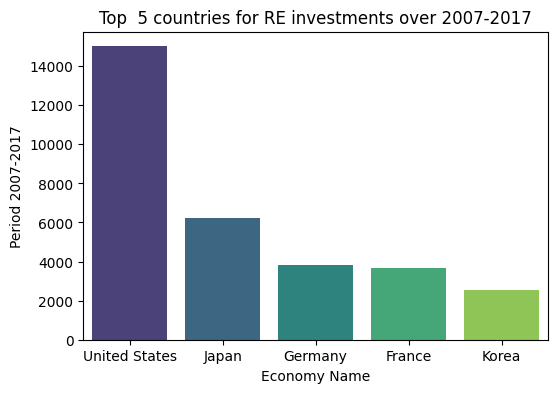

In [149]:
# Tracer le graphique en barres :
plt.figure(figsize=(6, 4))
sns.barplot(x='Economy Name', y='Period 2007-2017', data=budgets_renewables.sort_values(by= 'Period 2007-2017', ascending= False).head(5), palette='viridis')

plt.title('Top  5 countries for RE investments over 2007-2017')
plt.ylabel('Period 2007-2017')

plt.show()

### Top pays en GDP (2007-2017)

In [150]:
top_GDP = df_economy_gdp.copy()

In [151]:
years_period = [str(year) for year in range(2007, 2018)]

#Create a new column 'Period 2007-2017' in order to calculate the mean of GDP for mentioned time period and round its result to 2 decimals
top_GDP['Period 2007-2017'] = top_GDP[years_period].mean(axis=1).round(2)
top_GDP.head(3)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI,Period 2007-2017
279,Australia,680.15,760.81,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,1138.08,1187.32,NaN,934.13
605,Austria,297.73,317.81,328.57,322.51,332.00,352.02,359.02,361.40,395.49,404.29,417.23,NaN,353.46
931,Belgium,364.65,375.99,389.52,382.75,394.35,413.28,420.31,422.81,481.47,494.12,509.53,NaN,422.62


In [152]:
#Display the values of mean of GDP by descending order and filter top 5 GDP countries
top_GDP.sort_values(by= 'Period 2007-2017', ascending= False).head(5)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI,Period 2007-2017
10711,United States,13020.86,13843.82,14264.60,14256.28,14657.80,15094.03,15684.75,16799.70,17418.92,17947.00,18569.10,NaN,15596.08
6473,Japan,4170.53,4289.81,4354.37,4159.43,4309.53,4440.38,4627.89,4698.80,4750.77,4830.06,5237.79,NaN,4533.58
2887,Germany,2558.91,2809.69,2910.49,2806.27,2940.43,3099.08,3197.07,3232.54,3721.55,3840.55,3980.28,NaN,3190.62
1257,Brazil,1701.18,1835.64,1981.21,2013.19,2172.06,2294.24,2355.59,2423.31,3263.83,3192.40,3141.33,NaN,2397.63
4843,United Kingdom,2121.77,2137.42,2230.55,2139.40,2172.77,2260.80,2336.30,2390.87,2548.89,2679.32,2785.56,NaN,2345.79


/var/folders/f0/kz3pcppd42x67vkzrt_f2f4w0000gn/T/ipykernel_52158/882780243.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Economy Name', y='Period 2007-2017', data=top_GDP.sort_values(by= 'Period 2007-2017', ascending= False).head(5), palette='viridis')


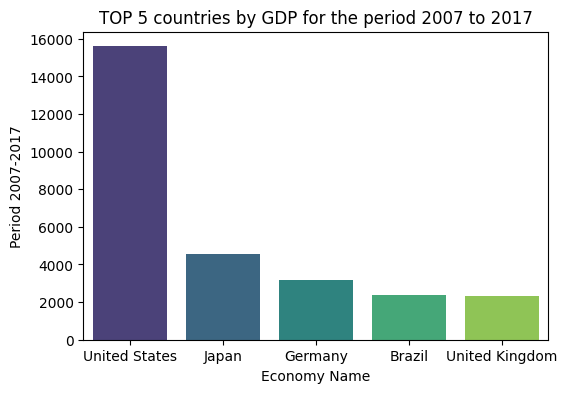

In [153]:
# Tracer le graphique en barres :
plt.figure(figsize=(6, 4))
sns.barplot(x='Economy Name', y='Period 2007-2017', data=top_GDP.sort_values(by= 'Period 2007-2017', ascending= False).head(5), palette='viridis')

plt.title('TOP 5 countries by GDP for the period 2007 to 2017')
plt.ylabel('Period 2007-2017')

plt.show()

### Top pays en GCI (2007-2017)

In [154]:
df_gci_mean_country = df_gci_mean_country_base.copy()

In [155]:
years_period = [str(year) for year in range(2007, 2018)]

#Create a new column 'Period 2007-2017' in order to calculate the mean of GCI for mentioned time period and round its result to 2 decimals
df_gci_mean_country['Period 2007-2017'] = df_gci_mean_country[years_period].mean(axis=1).round(2)
df_gci_mean_country.head(3)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,gci_mean_period,Period 2007-2017
0,Australia,5.317500,5.345000,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,5.326667,5.292500,5.29
1,Austria,5.297500,5.314167,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,5.300833,5.245606,5.25
2,Belgium,5.153333,5.215000,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,5.265833,5.222121,5.22


In [156]:
df_gci_mean_country.sort_values(by= 'Period 2007-2017', ascending= False).head(5)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,gci_mean_period,Period 2007-2017
29,Switzerland,5.655000,5.668333,5.636667,5.678333,5.790000,5.780000,5.722500,5.761667,5.822500,5.871667,5.927500,5.755833,5.76
28,Sweden,5.585833,5.597500,5.565000,5.597500,5.648333,5.588333,5.548333,5.471667,5.495000,5.599167,5.575833,5.570227,5.57
32,United States,5.638333,5.704167,5.525000,5.388333,5.395000,5.427500,5.440833,5.490833,5.570833,5.670000,5.818333,5.551742,5.55
9,Finland,5.559167,5.582500,5.507500,5.438333,5.529167,5.600000,5.583333,5.555833,5.511667,5.496667,5.556667,5.538258,5.54
21,Netherlands,5.493333,5.490833,5.395000,5.420000,5.490000,5.563333,5.494167,5.525000,5.583333,5.649167,5.745000,5.531742,5.53


/var/folders/f0/kz3pcppd42x67vkzrt_f2f4w0000gn/T/ipykernel_52158/374546352.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Economy Name', y='Period 2007-2017', data=df_gci_mean_country.sort_values(by= 'Period 2007-2017', ascending= False).head(5), palette='viridis')


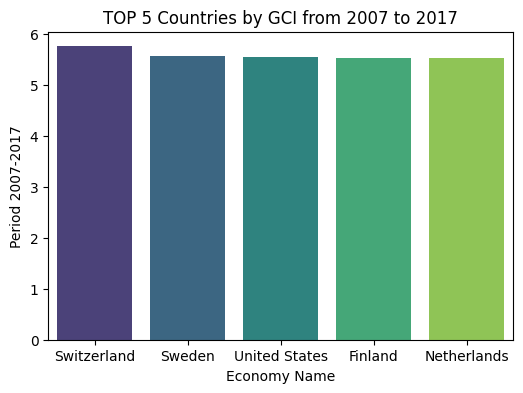

In [157]:
# Tracer le graphique en barres :
plt.figure(figsize=(6, 4))
sns.barplot(x='Economy Name', y='Period 2007-2017', data=df_gci_mean_country.sort_values(by= 'Period 2007-2017', ascending= False).head(5), palette='viridis')

plt.title('TOP 5 Countries by GCI from 2007 to 2017')
plt.ylabel('Period 2007-2017')

plt.show()

## 1. Corrélation GDP x GCI par pays de 2007 à 2017
(Global Competitiveness Index = moyenne 12 pilliers)

Répond à la question : est-ce qu'un pays avec un bon PBI est un pays ayant un bon score de compétitivité globale sur les 12 pilliers ?

##### Scatter plot des corrélations GDP x GCI
Permet de visualiser directement la relation entre le GDP et le score pour chaque pays. La ligne de régression permet de voir la tendance générale.

In [158]:
df_economy_gdp

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
279,Australia,680.15,760.81,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,1138.08,1187.32,NaN
605,Austria,297.73,317.81,328.57,322.51,332.00,352.02,359.02,361.40,395.49,404.29,417.23,NaN
931,Belgium,364.65,375.99,389.52,382.75,394.35,413.28,420.31,422.81,481.47,494.12,509.53,NaN
1257,Brazil,1701.18,1835.64,1981.21,2013.19,2172.06,2294.24,2355.59,2423.31,3263.83,3192.40,3141.33,NaN
1583,Canada,1156.46,1265.84,1303.23,1281.06,1330.27,1396.13,1488.31,1526.08,1591.58,1631.94,1682.36,NaN
1909,Switzerland,272.30,300.19,312.75,314.87,324.51,339.89,363.42,371.57,472.83,482.35,495.96,NaN
2235,Chile,212.67,231.06,243.04,243.57,257.88,299.63,320.54,334.76,409.33,422.42,438.75,NaN
2561,Czechia,236.54,248.90,262.17,252.95,261.29,284.95,286.95,286.04,314.58,332.48,350.72,NaN
2887,Germany,2558.91,2809.69,2910.49,2806.27,2940.43,3099.08,3197.07,3232.54,3721.55,3840.55,3980.28,NaN
3213,Denmark,198.37,203.68,204.06,197.06,201.74,206.59,210.15,211.92,249.53,258.70,273.86,NaN


In [159]:
df_economy_gdp.dtypes, df_gci_mean_country_base.dtypes

(Economy Name     object
 2007            float64
 2008            float64
 2009            float64
 2010            float64
 2011            float64
 2012            float64
 2013            float64
 2014            float64
 2015            float64
 2016            float64
 2017            float64
 Moyenne GCI     float64
 dtype: object,
 Economy Name        object
 2007               float64
 2008               float64
 2009               float64
 2010               float64
 2011               float64
 2012               float64
 2013               float64
 2014               float64
 2015               float64
 2016               float64
 2017               float64
 gci_mean_period    float64
 dtype: object)

In [160]:
df_gci_mean_country_base['Economy Name'].replace({'Korea, Rep.' : 'Korea'}, inplace=True)

/var/folders/f0/kz3pcppd42x67vkzrt_f2f4w0000gn/T/ipykernel_52158/3802302953.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_gci_mean_country_base['Economy Name'].replace({'Korea, Rep.' : 'Korea'}, inplace=True)


In [161]:
df_gci_mean_country_base

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,gci_mean_period
0,Australia,5.317500,5.345000,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,5.326667,5.292500
1,Austria,5.297500,5.314167,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,5.300833,5.245606
2,Belgium,5.153333,5.215000,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,5.265833,5.222121
3,Brazil,3.996667,4.137500,4.230833,4.267500,4.314167,4.415000,4.334167,4.332500,4.078333,4.027500,4.106667,4.203712
4,Canada,5.439167,5.491667,5.435000,5.411667,5.437500,5.399167,5.340000,5.373333,5.443333,5.403333,5.468333,5.422045
5,Chile,4.692500,4.670000,4.650833,4.625833,4.710000,4.742500,4.734167,4.740000,4.675000,4.700000,4.768333,4.700833
6,Czechia,4.606667,4.683333,4.715833,4.665000,4.629167,4.611667,4.530833,4.660833,4.835833,4.869167,4.922500,4.702803
7,Denmark,5.658333,5.685833,5.555833,5.414167,5.475833,5.345000,5.230833,5.374167,5.421667,5.425000,5.472500,5.459924
8,Estonia,4.760000,4.798333,4.710000,4.703333,4.733333,4.816667,4.807500,4.900833,4.929167,4.986667,5.043333,4.835379
9,Finland,5.559167,5.582500,5.507500,5.438333,5.529167,5.600000,5.583333,5.555833,5.511667,5.496667,5.556667,5.538258


In [162]:
# Initialiser une liste pour stocker les résultats de corrélation
correlation_results = []

# Calculer la corrélation pour chaque pays
for country in df_economy_gdp['Economy Name']:
    gdp_data = df_economy_gdp[df_economy_gdp['Economy Name'] == country].iloc[:, 1:].values.flatten()
    score_data = df_gci_mean_country_base[df_gci_mean_country_base['Economy Name'] == country].iloc[:, 1:].values.flatten()
    print(gdp_data)
    print(score_data)
    correlation = np.corrcoef(gdp_data, score_data)[0, 1]
    correlation_results.append({'Country': country, 'Correlation': correlation})

# Convertir la liste en DataFrame
correlation_results_df = pd.DataFrame(correlation_results)

# Afficher les résultats de la corrélation
correlation_results_df

[ 680.15  760.81  795.3   851.17  882.36  914.48  970.76  999.6  1095.38
 1138.08 1187.32     nan]
[5.3175     5.345      5.29       5.2725     5.26583333 5.27416667
 5.24333333 5.23666667 5.30333333 5.3425     5.32666667 5.2925    ]
[297.73 317.81 328.57 322.51 332.   352.02 359.02 361.4  395.49 404.29
 417.23    nan]
[5.2975     5.31416667 5.225      5.18166667 5.2075     5.2625
 5.21666667 5.23666667 5.1775     5.28166667 5.30083333 5.24560606]
[364.65 375.99 389.52 382.75 394.35 413.28 420.31 422.81 481.47 494.12
 509.53    nan]
[5.15333333 5.215      5.15583333 5.1425     5.26833333 5.2525
 5.19416667 5.235      5.25583333 5.305      5.26583333 5.22212121]
[1701.18 1835.64 1981.21 2013.19 2172.06 2294.24 2355.59 2423.31 3263.83
 3192.4  3141.33     nan]
[3.99666667 4.1375     4.23083333 4.2675     4.31416667 4.415
 4.33416667 4.3325     4.07833333 4.0275     4.10666667 4.20371212]
[1156.46 1265.84 1303.23 1281.06 1330.27 1396.13 1488.31 1526.08 1591.58
 1631.94 1682.36     nan]
[5

,Country,Correlation
0,Australia,NaN
1,Austria,NaN
2,Belgium,NaN
3,Brazil,NaN
4,Canada,NaN
5,Switzerland,NaN
6,Chile,NaN
7,Czechia,NaN
8,Germany,NaN
9,Denmark,NaN


In [163]:
# Initialiser une liste pour stocker les résultats de corrélation
correlation_results = []

# Calculer la corrélation pour chaque pays
for country in df_economy_gdp['Economy Name']:
    gdp_data = df_economy_gdp[df_economy_gdp['Economy Name'] == country].iloc[:, 1:].values.flatten()
    score_data = df_gci_mean_country_base[df_gci_mean_country_base['Economy Name'] == country].iloc[:, 1:].values.flatten()
    print(gdp_data)
    print(score_data)
    correlation = np.corrcoef(gdp_data, score_data)[0, 1]
    correlation_results.append({'Country': country, 'Correlation': correlation})

# Convertir la liste en DataFrame
correlation_results_df = pd.DataFrame(correlation_results)

# Afficher les résultats de la corrélation
print(correlation_results_df)

[ 680.15  760.81  795.3   851.17  882.36  914.48  970.76  999.6  1095.38
 1138.08 1187.32     nan]
[5.3175     5.345      5.29       5.2725     5.26583333 5.27416667
 5.24333333 5.23666667 5.30333333 5.3425     5.32666667 5.2925    ]
[297.73 317.81 328.57 322.51 332.   352.02 359.02 361.4  395.49 404.29
 417.23    nan]
[5.2975     5.31416667 5.225      5.18166667 5.2075     5.2625
 5.21666667 5.23666667 5.1775     5.28166667 5.30083333 5.24560606]
[364.65 375.99 389.52 382.75 394.35 413.28 420.31 422.81 481.47 494.12
 509.53    nan]
[5.15333333 5.215      5.15583333 5.1425     5.26833333 5.2525
 5.19416667 5.235      5.25583333 5.305      5.26583333 5.22212121]
[1701.18 1835.64 1981.21 2013.19 2172.06 2294.24 2355.59 2423.31 3263.83
 3192.4  3141.33     nan]
[3.99666667 4.1375     4.23083333 4.2675     4.31416667 4.415
 4.33416667 4.3325     4.07833333 4.0275     4.10666667 4.20371212]
[1156.46 1265.84 1303.23 1281.06 1330.27 1396.13 1488.31 1526.08 1591.58
 1631.94 1682.36     nan]
[5

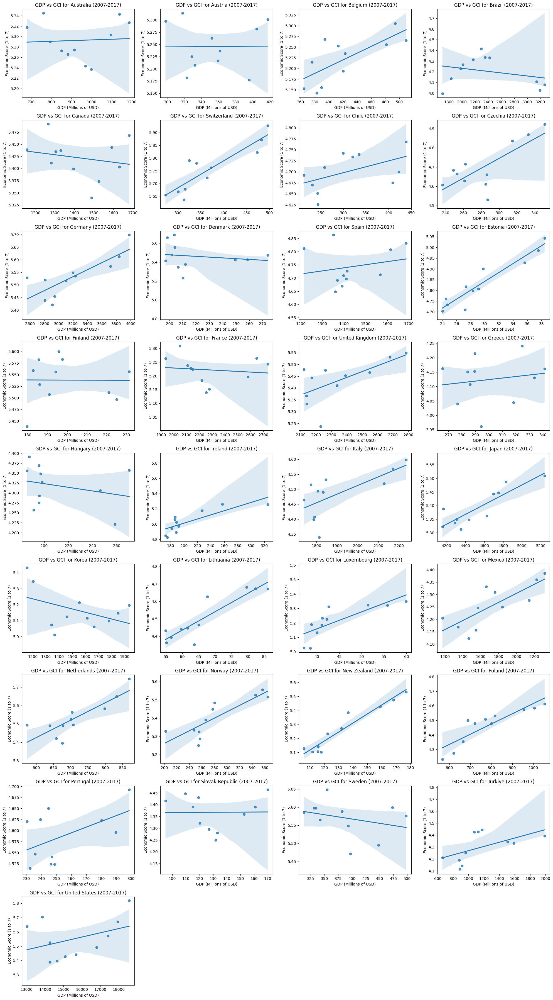

In [164]:
# Visualiser les scatter plots avec ligne de régression pour chaque pays
# Scatter plots avec ligne de régression : Ces graphiques permettent de visualiser directement la relation entre le GDP et le score pour chaque pays.
# Une ligne de régression permet de voir la tendance générale.
# Liste des pays à visualiser
countries = df_economy_gdp['Economy Name'].unique()

# Définir la taille de la grille
n_countries = len(countries)
n_cols = 4  # Nombre de colonnes de la grille
n_rows = (n_countries + n_cols - 1) // n_cols  # Calculer le nombre de lignes nécessaire

# Créer une figure et des axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 4))

# Boucle pour chaque pays et tracer les scatter plots
for i, country in enumerate(countries):
    row = i // n_cols
    col = i % n_cols
    ax = axes[row, col]

    gdp_data = df_economy_gdp[df_economy_gdp['Economy Name'] == country].iloc[:, 1:].values.flatten()
    score_data = df_gci_mean_country_base[df_gci_mean_country_base['Economy Name'] == country].iloc[:, 1:].values.flatten()

    sns.regplot(x=gdp_data, y=score_data, ax=ax)
    ax.set_title(f'GDP vs GCI for {country} (2007-2017)')
    ax.set_xlabel('GDP (Millions of USD)')
    ax.set_ylabel('Economic Score (1 to 7)')

# Supprimer les axes inutilisés
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()


****Interprétation des résultats :****

****Points de données :****
Chaque point sur le graphique représente une année entre 2007 et 2017.
Les points montrent la combinaison de GDP et de score économique pour chaque année.

****La ligne de régression linéaire :**** tente de modéliser la relation entre le GDP et le score économique
La pente de cette ligne indique la tendance générale
    Si pente fortement positive/négative <-> forte corrélation positive/négative entre GDP et GCI <-> lorsque GDP augmente, GCI a tendance à augmenter/diminuer fortement
    Si pente faiblement positive/négative <-> faible corrélation positive/négative entre GDP et GCI <-> lorsque GDP augmente, GCI a tendance à augmenter/diminuer faiblement
    
****L'intervalle de confiance :**** Zone bleue -> montre l'incertitude de la ligne de régression. Plus la bande est large, plus l'incertitude est grande.
    La large bande de l'intervalle de confiance indique une incertitude importante autour de la relation entre le GDP et le score économique.
    Cela signifie que la corrélation observée n'est pas très robuste et peut être sujette à des variations.

****Dispersion des données :****
    Les points sont assez dispersés autour de la ligne de régression <-> beaucoup de variabilité dans les données <-> Cela signifie que d'autres facteurs, en plus du GDP, influencent le score économique


Si ligne de régression linéaire a une faible pente
+ forte dispersion des données autour de cette ligne
+ intervalle de confiance faible (zone bleue importante)
=
Interprétation prudente : La relation entre le GDP et le score économique n'est pas suffisamment forte pour tirer des conclusions définitives

##### Heatmap des corrélations GDP x GCI
Permet de voir rapidement quelles paires de pays ont des corrélations fortes (positives ou négatives) entre leur GDP et leur score économique.

In [165]:
# Initialiser un DataFrame pour stocker les corrélations annuelles
correlation_matrix = pd.DataFrame(index=df_economy_gdp['Economy Name'].unique(), columns=['Correlation'])

# Ajouter les corrélations calculées au DataFrame
for result in correlation_results:
    correlation_matrix.loc[result['Country']] = result['Correlation']

# Convertir les valeurs en flottants
correlation_matrix = correlation_matrix.astype(float)

# Afficher les résultats de la corrélation
print(correlation_matrix)


                 Correlation
Australia                NaN
Austria                  NaN
Belgium                  NaN
Brazil                   NaN
Canada                   NaN
Switzerland              NaN
Chile                    NaN
Czechia                  NaN
Germany                  NaN
Denmark                  NaN
Spain                    NaN
Estonia                  NaN
Finland                  NaN
France                   NaN
United Kingdom           NaN
Greece                   NaN
Hungary                  NaN
Ireland                  NaN
Italy                    NaN
Japan                    NaN
Korea                    NaN
Lithuania                NaN
Luxembourg               NaN
Mexico                   NaN
Netherlands              NaN
Norway                   NaN
New Zealand              NaN
Poland                   NaN
Portugal                 NaN
Slovak Republic          NaN
Sweden                   NaN
Turkiye                  NaN
United States            NaN


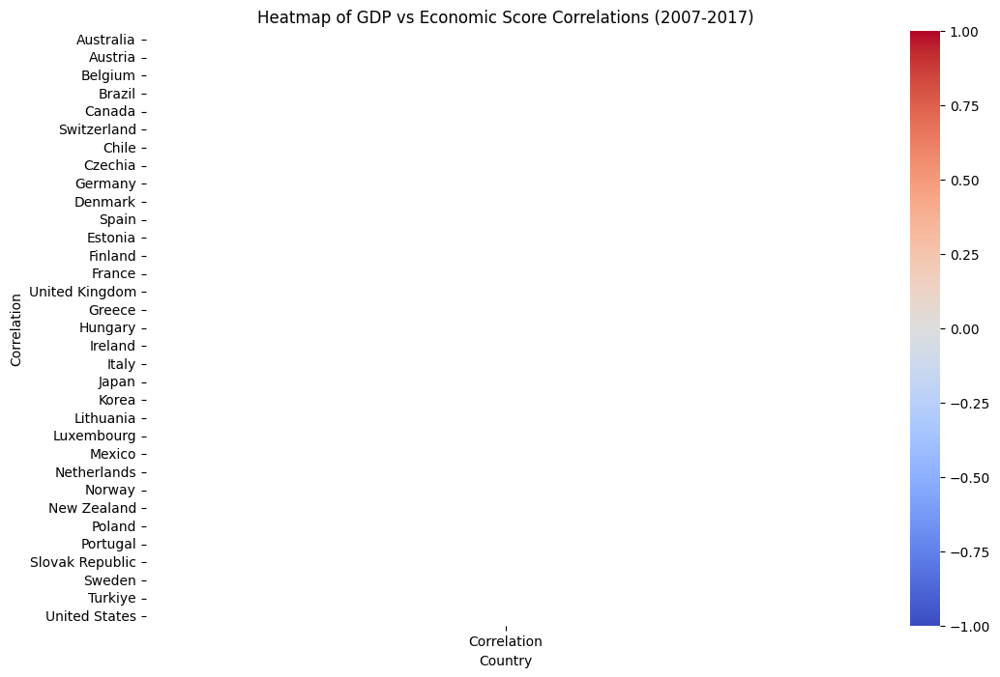

In [166]:
# Générer la heatmap de corrélation
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Heatmap of GDP vs Economic Score Correlations (2007-2017)')
plt.xlabel('Country')
plt.ylabel('Correlation')
plt.show()


****Interprétation des résultats :****

****Corrélation positive modérée à forte (orange / rouge) :****
    Ces pays montrent une forte corrélation positive entre le GDP et le score économique. Cela signifie qu'une augmentation du GDP est fortement associée à une augmentation du score économique

****Corrélations proches de zéro :**** indiquent peu ou pas de relation entre le GDP et le score économique. Cela pourrait suggérer que le score économique de ces pays est influencé par des facteurs autres que le GDP.

Si nous avions eu des corrélations négatives fortes <-> corrélation négative forte entre le GDP et le score économique. Cela signifie qu'une augmentation du GDP est associée à une diminution importante du score économique, ce qui pourrait indiquer des problèmes structurels ou d'autres facteurs influençant négativement le score économique malgré une augmentation du GDP.

## 2. Corrélation GCI x ER (en excluant pays et dates sans données)

In [203]:
budgets_renewables_without_nan = budgets_renewables
budgets_renewables_without_nan

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Period 2007-2017
2,Australia,50.553,43.747000,84.191000,89.5890,173.8030,226.1670,448.2830,81.671,131.836,48.560,57.124,1435.52
11,Austria,28.002,45.348000,59.308000,60.6080,58.0450,48.9350,50.3300,54.151,36.128,48.910,33.920,523.68
20,Belgium,27.484,18.322667,9.161333,0.0000,29.6600,29.7870,32.1150,44.781,28.922,24.496,25.865,270.59
29,Brazil,NaN,NaN,NaN,NaN,NaN,NaN,421.3880,502.598,399.460,330.241,297.990,1951.68
38,Canada,84.813,103.536000,168.995000,167.7760,196.9380,225.2680,134.3600,117.747,144.331,121.561,123.506,1588.83
47,Chile,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.944,11.740,9.488,12.667,53.84
56,Czechia,3.239,14.504000,17.274000,16.8140,27.0300,22.7970,14.1550,14.069,17.550,15.384,16.499,179.32
65,Denmark,60.043,66.714000,79.416000,116.2530,108.2230,88.7370,113.4920,76.134,94.884,62.323,38.042,904.26
74,Estonia,NaN,NaN,NaN,NaN,12.4350,0.4200,3.6290,2.545,2.967,2.649,0.987,25.63
83,Finland,56.760,58.030000,70.931000,66.7220,90.9590,57.4200,75.1900,47.815,54.073,48.433,54.702,681.04


In [211]:
# Retirer les pays NaN
countries_to_remove = ['Greece', 'Lithuania', 'Brazil', 'Chile', 'Estonia', 'Luxembourg', 'Mexico']
budgets_renewables_without_nan = budgets_renewables_without_nan[~budgets_renewables_without_nan['Economy Name'].isin(countries_to_remove)]
budgets_renewables_without_nan


,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Period 2007-2017
2,Australia,50.553,43.747000,84.191000,89.5890,173.8030,226.1670,448.2830,81.671,131.836,48.560,57.124,1435.52
11,Austria,28.002,45.348000,59.308000,60.6080,58.0450,48.9350,50.3300,54.151,36.128,48.910,33.920,523.68
20,Belgium,27.484,18.322667,9.161333,0.0000,29.6600,29.7870,32.1150,44.781,28.922,24.496,25.865,270.59
38,Canada,84.813,103.536000,168.995000,167.7760,196.9380,225.2680,134.3600,117.747,144.331,121.561,123.506,1588.83
56,Czechia,3.239,14.504000,17.274000,16.8140,27.0300,22.7970,14.1550,14.069,17.550,15.384,16.499,179.32
65,Denmark,60.043,66.714000,79.416000,116.2530,108.2230,88.7370,113.4920,76.134,94.884,62.323,38.042,904.26
83,Finland,56.760,58.030000,70.931000,66.7220,90.9590,57.4200,75.1900,47.815,54.073,48.433,54.702,681.04
92,France,190.573,242.249000,388.578000,298.5820,368.3010,357.5160,411.2190,396.133,392.506,351.413,285.457,3682.53
101,Germany,174.564,224.299000,341.314000,349.5920,444.0600,429.0550,450.9640,329.721,351.803,315.693,390.165,3801.23
119,Hungary,14.385,13.725000,14.302000,13.9490,13.6850,12.7750,1.7420,2.319,3.250,9.948,40.589,140.67


In [218]:
# Slovaquie et Pologne conservés avec 1 seul NaN en 2007 (limite)
budgets_renewables_without_nan = budgets_renewables_without_nan.drop(columns='2007')
budgets_renewables_without_nan

,Economy Name,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Period 2007-2017
2,Australia,43.747000,84.191000,89.5890,173.8030,226.1670,448.2830,81.671,131.836,48.560,57.124,1435.52
11,Austria,45.348000,59.308000,60.6080,58.0450,48.9350,50.3300,54.151,36.128,48.910,33.920,523.68
20,Belgium,18.322667,9.161333,0.0000,29.6600,29.7870,32.1150,44.781,28.922,24.496,25.865,270.59
38,Canada,103.536000,168.995000,167.7760,196.9380,225.2680,134.3600,117.747,144.331,121.561,123.506,1588.83
56,Czechia,14.504000,17.274000,16.8140,27.0300,22.7970,14.1550,14.069,17.550,15.384,16.499,179.32
65,Denmark,66.714000,79.416000,116.2530,108.2230,88.7370,113.4920,76.134,94.884,62.323,38.042,904.26
83,Finland,58.030000,70.931000,66.7220,90.9590,57.4200,75.1900,47.815,54.073,48.433,54.702,681.04
92,France,242.249000,388.578000,298.5820,368.3010,357.5160,411.2190,396.133,392.506,351.413,285.457,3682.53
101,Germany,224.299000,341.314000,349.5920,444.0600,429.0550,450.9640,329.721,351.803,315.693,390.165,3801.23
119,Hungary,13.725000,14.302000,13.9490,13.6850,12.7750,1.7420,2.319,3.250,9.948,40.589,140.67


In [209]:
df_gci_mean_country_base_for_corr2 = df_gci_mean_country_base
df_gci_mean_country_base_for_corr2

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,gci_mean_period
0,Australia,5.317500,5.345000,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,5.326667,5.292500
1,Austria,5.297500,5.314167,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,5.300833,5.245606
2,Belgium,5.153333,5.215000,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,5.265833,5.222121
3,Brazil,3.996667,4.137500,4.230833,4.267500,4.314167,4.415000,4.334167,4.332500,4.078333,4.027500,4.106667,4.203712
4,Canada,5.439167,5.491667,5.435000,5.411667,5.437500,5.399167,5.340000,5.373333,5.443333,5.403333,5.468333,5.422045
5,Chile,4.692500,4.670000,4.650833,4.625833,4.710000,4.742500,4.734167,4.740000,4.675000,4.700000,4.768333,4.700833
6,Czechia,4.606667,4.683333,4.715833,4.665000,4.629167,4.611667,4.530833,4.660833,4.835833,4.869167,4.922500,4.702803
7,Denmark,5.658333,5.685833,5.555833,5.414167,5.475833,5.345000,5.230833,5.374167,5.421667,5.425000,5.472500,5.459924
8,Estonia,4.760000,4.798333,4.710000,4.703333,4.733333,4.816667,4.807500,4.900833,4.929167,4.986667,5.043333,4.835379
9,Finland,5.559167,5.582500,5.507500,5.438333,5.529167,5.600000,5.583333,5.555833,5.511667,5.496667,5.556667,5.538258


In [212]:
countries_to_remove = ['Greece', 'Lithuania', 'Brazil', 'Chile', 'Estonia', 'Luxembourg', 'Mexico']
df_gci_mean_country_base_for_corr2 = df_gci_mean_country_base_for_corr2[~df_gci_mean_country_base_for_corr2['Economy Name'].isin(countries_to_remove)]
df_gci_mean_country_base_for_corr2

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,gci_mean_period
0,Australia,5.317500,5.345000,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,5.326667,5.292500
1,Austria,5.297500,5.314167,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,5.300833,5.245606
2,Belgium,5.153333,5.215000,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,5.265833,5.222121
4,Canada,5.439167,5.491667,5.435000,5.411667,5.437500,5.399167,5.340000,5.373333,5.443333,5.403333,5.468333,5.422045
6,Czechia,4.606667,4.683333,4.715833,4.665000,4.629167,4.611667,4.530833,4.660833,4.835833,4.869167,4.922500,4.702803
7,Denmark,5.658333,5.685833,5.555833,5.414167,5.475833,5.345000,5.230833,5.374167,5.421667,5.425000,5.472500,5.459924
9,Finland,5.559167,5.582500,5.507500,5.438333,5.529167,5.600000,5.583333,5.555833,5.511667,5.496667,5.556667,5.538258
10,France,5.263333,5.309167,5.227500,5.238333,5.223333,5.183333,5.139167,5.151667,5.195833,5.264167,5.242500,5.221667
11,Germany,5.528333,5.520000,5.420833,5.439167,5.454167,5.516667,5.548333,5.535000,5.573333,5.612500,5.698333,5.531515
13,Hungary,4.348333,4.256667,4.292500,4.355833,4.390833,4.369167,4.275000,4.327500,4.305833,4.220833,4.357500,4.318182


In [221]:
# Slovaquie et Pologne conservés avec 1 seul NaN en 2007 (limite)
df_gci_mean_country_base_for_corr2 = df_gci_mean_country_base_for_corr2.drop(columns='2007')
df_gci_mean_country_base_for_corr2

,Economy Name,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,gci_mean_period
0,Australia,5.345000,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,5.326667,5.292500
1,Austria,5.314167,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,5.300833,5.245606
2,Belgium,5.215000,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,5.265833,5.222121
4,Canada,5.491667,5.435000,5.411667,5.437500,5.399167,5.340000,5.373333,5.443333,5.403333,5.468333,5.422045
6,Czechia,4.683333,4.715833,4.665000,4.629167,4.611667,4.530833,4.660833,4.835833,4.869167,4.922500,4.702803
7,Denmark,5.685833,5.555833,5.414167,5.475833,5.345000,5.230833,5.374167,5.421667,5.425000,5.472500,5.459924
9,Finland,5.582500,5.507500,5.438333,5.529167,5.600000,5.583333,5.555833,5.511667,5.496667,5.556667,5.538258
10,France,5.309167,5.227500,5.238333,5.223333,5.183333,5.139167,5.151667,5.195833,5.264167,5.242500,5.221667
11,Germany,5.520000,5.420833,5.439167,5.454167,5.516667,5.548333,5.535000,5.573333,5.612500,5.698333,5.531515
13,Hungary,4.256667,4.292500,4.355833,4.390833,4.369167,4.275000,4.327500,4.305833,4.220833,4.357500,4.318182


In [222]:
# Fusionner les deux dataframes
merged_gci_er_df_corr2 = pd.merge(df_gci_mean_country_base_for_corr2, budgets_renewables_without_nan, on="Economy Name", suffixes=('_GCI', '_ERInvestments'))

# Liste des pays à visualiser
countries = merged_gci_er_df_corr2['Economy Name'].unique()

In [223]:
merged_gci_er_df_corr2

,Economy Name,2008_GCI,2009_GCI,2010_GCI,2011_GCI,2012_GCI,2013_GCI,2014_GCI,2015_GCI,2016_GCI,...,2009_ERInvestments,2010_ERInvestments,2011_ERInvestments,2012_ERInvestments,2013_ERInvestments,2014_ERInvestments,2015_ERInvestments,2016_ERInvestments,2017_ERInvestments,Period 2007-2017
0,Australia,5.345000,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,...,84.191000,89.5890,173.8030,226.1670,448.2830,81.671,131.836,48.560,57.124,1435.52
1,Austria,5.314167,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,...,59.308000,60.6080,58.0450,48.9350,50.3300,54.151,36.128,48.910,33.920,523.68
2,Belgium,5.215000,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,...,9.161333,0.0000,29.6600,29.7870,32.1150,44.781,28.922,24.496,25.865,270.59
3,Canada,5.491667,5.435000,5.411667,5.437500,5.399167,5.340000,5.373333,5.443333,5.403333,...,168.995000,167.7760,196.9380,225.2680,134.3600,117.747,144.331,121.561,123.506,1588.83
4,Czechia,4.683333,4.715833,4.665000,4.629167,4.611667,4.530833,4.660833,4.835833,4.869167,...,17.274000,16.8140,27.0300,22.7970,14.1550,14.069,17.550,15.384,16.499,179.32
5,Denmark,5.685833,5.555833,5.414167,5.475833,5.345000,5.230833,5.374167,5.421667,5.425000,...,79.416000,116.2530,108.2230,88.7370,113.4920,76.134,94.884,62.323,38.042,904.26
6,Finland,5.582500,5.507500,5.438333,5.529167,5.600000,5.583333,5.555833,5.511667,5.496667,...,70.931000,66.7220,90.9590,57.4200,75.1900,47.815,54.073,48.433,54.702,681.04
7,France,5.309167,5.227500,5.238333,5.223333,5.183333,5.139167,5.151667,5.195833,5.264167,...,388.578000,298.5820,368.3010,357.5160,411.2190,396.133,392.506,351.413,285.457,3682.53
8,Germany,5.520000,5.420833,5.439167,5.454167,5.516667,5.548333,5.535000,5.573333,5.612500,...,341.314000,349.5920,444.0600,429.0550,450.9640,329.721,351.803,315.693,390.165,3801.23
9,Hungary,4.256667,4.292500,4.355833,4.390833,4.369167,4.275000,4.327500,4.305833,4.220833,...,14.302000,13.9490,13.6850,12.7750,1.7420,2.319,3.250,9.948,40.589,140.67


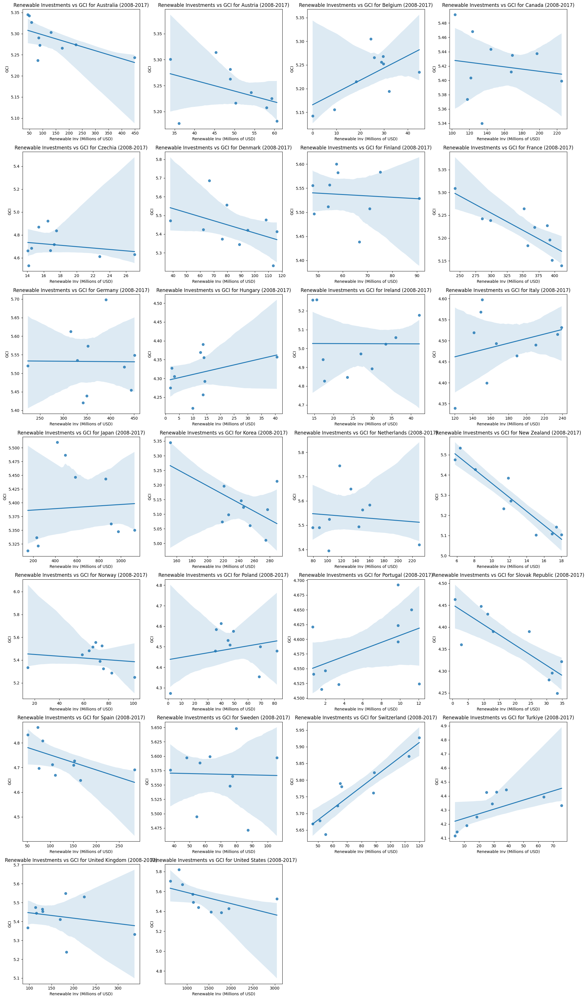

In [225]:
# Définir la taille de la grille
n_countries = len(countries)
n_cols = 4  # Nombre de colonnes de la grille
n_rows = (n_countries + n_cols - 1) // n_cols  # Calculer le nombre de lignes nécessaire

# Créer une figure et des axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))

# Boucle pour chaque pays et tracer les scatter plots
for i, country in enumerate(countries):
    row = i // n_cols
    col = i % n_cols
    ax = axes[row, col]

    gci_data_corr2 = merged_gci_er_df_corr2.loc[merged_gci_er_df_corr2['Economy Name'] == country, '2008_GCI':'2017_GCI'].values.flatten()
    er_data_corr2 = merged_gci_er_df_corr2.loc[merged_gci_er_df_corr2['Economy Name'] == country, '2008_ERInvestments':'2017_ERInvestments'].values.flatten()

    sns.regplot(x=er_data_corr2, y=gci_data_corr2, ax=ax)
    ax.set_title(f'Renewable Investments vs GCI for {country} (2008-2017)')
    ax.set_xlabel('Renewable Inv (Millions of USD)')
    ax.set_ylabel('GCI')

# Supprimer les axes inutilisés
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

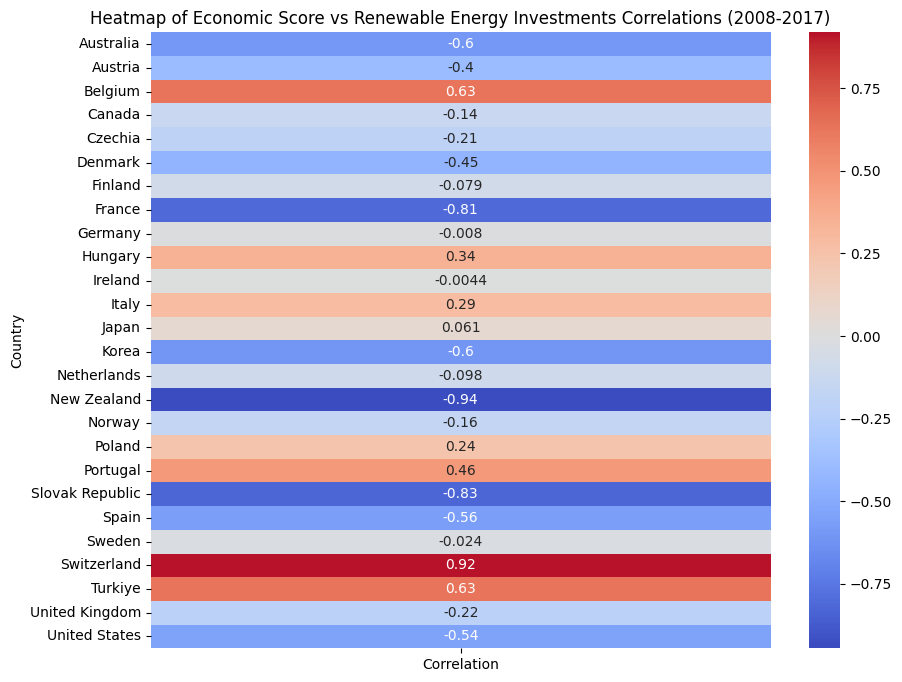

In [226]:
# Calculer les corrélations
correlation2_gci_er = []

for country in merged_gci_er_df_corr2['Economy Name'].unique():
    gci_data_corr2 = merged_gci_er_df_corr2.loc[merged_gci_er_df_corr2['Economy Name'] == country, '2008_GCI':'2017_GCI'].values.flatten()
    er_data_corr2 = merged_gci_er_df_corr2.loc[merged_gci_er_df_corr2['Economy Name'] == country, '2008_ERInvestments':'2017_ERInvestments'].values.flatten()
    correcoef_gci_er_2 = np.corrcoef(gci_data_corr2, er_data_corr2)[0, 1]
    correlation2_gci_er.append({'Country': country, 'Correlation': correcoef_gci_er_2})

# Convertir la liste en DataFrame
correlation2_gci_er_df = pd.DataFrame(correlation2_gci_er).set_index('Country')

# Heatmap des corrélations
plt.figure(figsize=(10, 8))
sns.heatmap(correlation2_gci_er_df, annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap of Economic Score vs Renewable Energy Investments Correlations (2008-2017)')
plt.show()

## Old_Corrélation entre le GCI x ER (part d'investissement en énergie renouvelable) pour tous les pays

Répond à la question : Existe-t-il une corrélation entre la compétitivité d'un pays et l'inv en ER ?

In [167]:
df_gci_mean_country_base.head(3)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,gci_mean_period
0,Australia,5.317500,5.345000,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,5.326667,5.292500
1,Austria,5.297500,5.314167,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,5.300833,5.245606
2,Belgium,5.153333,5.215000,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,5.265833,5.222121


In [199]:
budgets_renewables.head()
# Attention, revoir le interpolate dans le code Dépenses en énergie car les ordres de grandeur ne sont pas OK


,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Period 2007-2017
2,Australia,50.553,43.747000,84.191000,89.589,173.803,226.167,448.283,81.671,131.836,48.560,57.124,1435.52
11,Austria,28.002,45.348000,59.308000,60.608,58.045,48.935,50.330,54.151,36.128,48.910,33.920,523.68
20,Belgium,27.484,18.322667,9.161333,0.000,29.660,29.787,32.115,44.781,28.922,24.496,25.865,270.59
29,Brazil,NaN,NaN,NaN,NaN,NaN,NaN,421.388,502.598,399.460,330.241,297.990,1951.68
38,Canada,84.813,103.536000,168.995000,167.776,196.938,225.268,134.360,117.747,144.331,121.561,123.506,1588.83


##### Scatter plot des corrélations GCI x ER

In [169]:
# Fusionner les deux dataframes
merged_gci_er_df = pd.merge(df_gci_mean_country_base, budgets_renewables, on="Economy Name", suffixes=('_GCI', '_ERInvestments'))

# Liste des pays à visualiser
countries = merged_gci_er_df['Economy Name'].unique()

In [170]:
merged_gci_er_df

,Economy Name,2007_GCI,2008_GCI,2009_GCI,2010_GCI,2011_GCI,2012_GCI,2013_GCI,2014_GCI,2015_GCI,...,2009_ERInvestments,2010_ERInvestments,2011_ERInvestments,2012_ERInvestments,2013_ERInvestments,2014_ERInvestments,2015_ERInvestments,2016_ERInvestments,2017_ERInvestments,Period 2007-2017
0,Australia,5.317500,5.345000,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,...,84.191000,89.5890,173.8030,226.1670,448.2830,81.671,131.836,48.560,57.124,1435.52
1,Austria,5.297500,5.314167,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,...,59.308000,60.6080,58.0450,48.9350,50.3300,54.151,36.128,48.910,33.920,523.68
2,Belgium,5.153333,5.215000,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,...,9.161333,0.0000,29.6600,29.7870,32.1150,44.781,28.922,24.496,25.865,270.59
3,Brazil,3.996667,4.137500,4.230833,4.267500,4.314167,4.415000,4.334167,4.332500,4.078333,...,NaN,NaN,NaN,NaN,421.3880,502.598,399.460,330.241,297.990,1951.68
4,Canada,5.439167,5.491667,5.435000,5.411667,5.437500,5.399167,5.340000,5.373333,5.443333,...,168.995000,167.7760,196.9380,225.2680,134.3600,117.747,144.331,121.561,123.506,1588.83
5,Chile,4.692500,4.670000,4.650833,4.625833,4.710000,4.742500,4.734167,4.740000,4.675000,...,NaN,NaN,NaN,NaN,NaN,19.944,11.740,9.488,12.667,53.84
6,Czechia,4.606667,4.683333,4.715833,4.665000,4.629167,4.611667,4.530833,4.660833,4.835833,...,17.274000,16.8140,27.0300,22.7970,14.1550,14.069,17.550,15.384,16.499,179.32
7,Denmark,5.658333,5.685833,5.555833,5.414167,5.475833,5.345000,5.230833,5.374167,5.421667,...,79.416000,116.2530,108.2230,88.7370,113.4920,76.134,94.884,62.323,38.042,904.26
8,Estonia,4.760000,4.798333,4.710000,4.703333,4.733333,4.816667,4.807500,4.900833,4.929167,...,NaN,NaN,12.4350,0.4200,3.6290,2.545,2.967,2.649,0.987,25.63
9,Finland,5.559167,5.582500,5.507500,5.438333,5.529167,5.600000,5.583333,5.555833,5.511667,...,70.931000,66.7220,90.9590,57.4200,75.1900,47.815,54.073,48.433,54.702,681.04


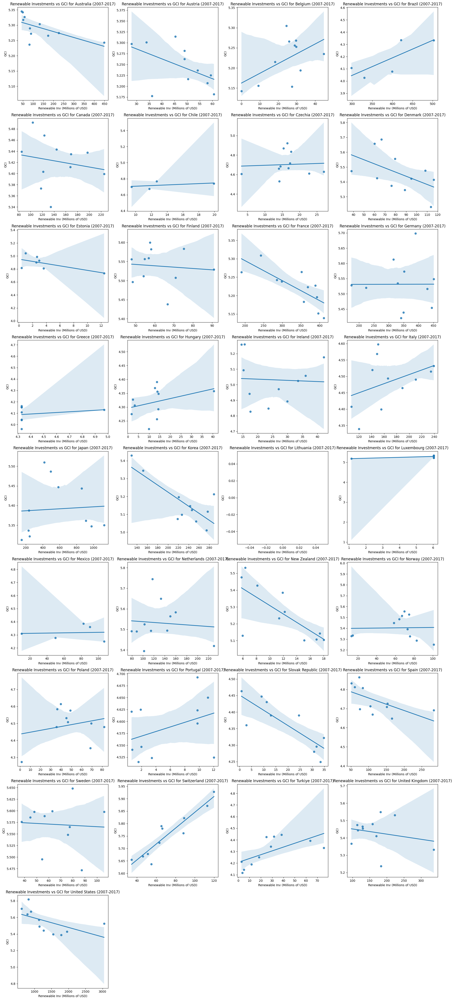

In [171]:
# Définir la taille de la grille
n_countries = len(countries)
n_cols = 4  # Nombre de colonnes de la grille
n_rows = (n_countries + n_cols - 1) // n_cols  # Calculer le nombre de lignes nécessaire

# Créer une figure et des axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))

# Boucle pour chaque pays et tracer les scatter plots
for i, country in enumerate(countries):
    row = i // n_cols
    col = i % n_cols
    ax = axes[row, col]

    gci_data = merged_gci_er_df.loc[merged_gci_er_df['Economy Name'] == country, '2007_GCI':'2017_GCI'].values.flatten()
    er_data = merged_gci_er_df.loc[merged_gci_er_df['Economy Name'] == country, '2007_ERInvestments':'2017_ERInvestments'].values.flatten()

    sns.regplot(x=er_data, y=gci_data, ax=ax)
    ax.set_title(f'Renewable Investments vs GCI for {country} (2007-2017)')
    ax.set_xlabel('Renewable Inv (Millions of USD)')
    ax.set_ylabel('GCI')

# Supprimer les axes inutilisés
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

##### Heatmap des corrélations GCI x ER #####

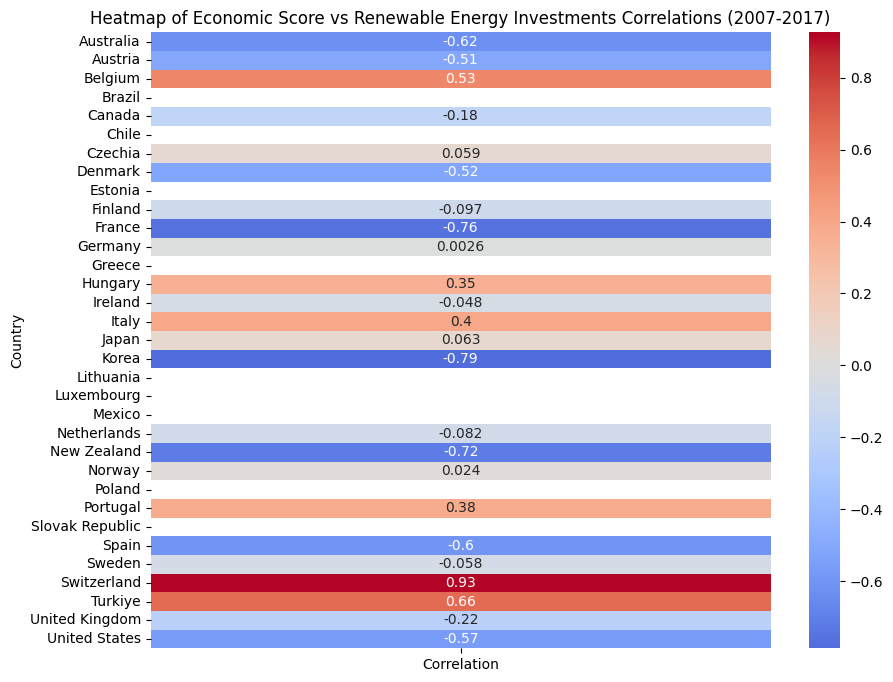

In [172]:
# Calculer les corrélations
correlation_gci_er = []

for country in merged_gci_er_df['Economy Name'].unique():
    gci_data = merged_gci_er_df.loc[merged_gci_er_df['Economy Name'] == country, '2007_GCI':'2017_GCI'].values.flatten()
    er_data = merged_gci_er_df.loc[merged_gci_er_df['Economy Name'] == country, '2007_ERInvestments':'2017_ERInvestments'].values.flatten()
    correcoef_gci_er = np.corrcoef(gci_data, er_data)[0, 1]
    correlation_gci_er.append({'Country': country, 'Correlation': correcoef_gci_er})

# Convertir la liste en DataFrame
correlation_gci_er_df = pd.DataFrame(correlation_gci_er).set_index('Country')

# Heatmap des corrélations
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_gci_er_df, annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap of Economic Score vs Renewable Energy Investments Correlations (2007-2017)')
plt.show()

****Interprétation des résultats :****

****Corrélation négative forte (bleu) :****
    corrélation négative entre les investissements en énergie renouvelable et le score économique (GCI) <-> l'augmentation des investissements en énergie renouvelable est associée à une diminution du score économique.

****Corrélation proche de zéro (gris) :****
    Peu ou pas de corrélation


## 3. Corrélation GDP x ER (en excluant pays et dates sans données)

In [231]:
df_economy_gdp_corr2 = df_economy_gdp
df_economy_gdp_corr2 = df_economy_gdp_corr2.drop(columns='2007')
df_economy_gdp_corr2

,Economy Name,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
279,Australia,760.81,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,1138.08,1187.32,NaN
605,Austria,317.81,328.57,322.51,332.00,352.02,359.02,361.40,395.49,404.29,417.23,NaN
931,Belgium,375.99,389.52,382.75,394.35,413.28,420.31,422.81,481.47,494.12,509.53,NaN
1257,Brazil,1835.64,1981.21,2013.19,2172.06,2294.24,2355.59,2423.31,3263.83,3192.40,3141.33,NaN
1583,Canada,1265.84,1303.23,1281.06,1330.27,1396.13,1488.31,1526.08,1591.58,1631.94,1682.36,NaN
1909,Switzerland,300.19,312.75,314.87,324.51,339.89,363.42,371.57,472.83,482.35,495.96,NaN
2235,Chile,231.06,243.04,243.57,257.88,299.63,320.54,334.76,409.33,422.42,438.75,NaN
2561,Czechia,248.90,262.17,252.95,261.29,284.95,286.95,286.04,314.58,332.48,350.72,NaN
2887,Germany,2809.69,2910.49,2806.27,2940.43,3099.08,3197.07,3232.54,3721.55,3840.55,3980.28,NaN
3213,Denmark,203.68,204.06,197.06,201.74,206.59,210.15,211.92,249.53,258.70,273.86,NaN


In [228]:
budgets_renewables_without_nan

,Economy Name,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Period 2007-2017
2,Australia,43.747000,84.191000,89.5890,173.8030,226.1670,448.2830,81.671,131.836,48.560,57.124,1435.52
11,Austria,45.348000,59.308000,60.6080,58.0450,48.9350,50.3300,54.151,36.128,48.910,33.920,523.68
20,Belgium,18.322667,9.161333,0.0000,29.6600,29.7870,32.1150,44.781,28.922,24.496,25.865,270.59
38,Canada,103.536000,168.995000,167.7760,196.9380,225.2680,134.3600,117.747,144.331,121.561,123.506,1588.83
56,Czechia,14.504000,17.274000,16.8140,27.0300,22.7970,14.1550,14.069,17.550,15.384,16.499,179.32
65,Denmark,66.714000,79.416000,116.2530,108.2230,88.7370,113.4920,76.134,94.884,62.323,38.042,904.26
83,Finland,58.030000,70.931000,66.7220,90.9590,57.4200,75.1900,47.815,54.073,48.433,54.702,681.04
92,France,242.249000,388.578000,298.5820,368.3010,357.5160,411.2190,396.133,392.506,351.413,285.457,3682.53
101,Germany,224.299000,341.314000,349.5920,444.0600,429.0550,450.9640,329.721,351.803,315.693,390.165,3801.23
119,Hungary,13.725000,14.302000,13.9490,13.6850,12.7750,1.7420,2.319,3.250,9.948,40.589,140.67


In [232]:
budgets_renewables_base_2 = budgets_renewables_without_nan.drop(columns='Period 2007-2017')

In [233]:
# Fusionner les deux dataframes
merged_gdp_er_df_corr2 = pd.merge(df_economy_gdp_corr2, budgets_renewables_without_nan, on="Economy Name", suffixes=('_GDP', '_ERInvestments'))

# Liste des pays à visualiser
countries = merged_gdp_er_df_corr2['Economy Name'].unique()

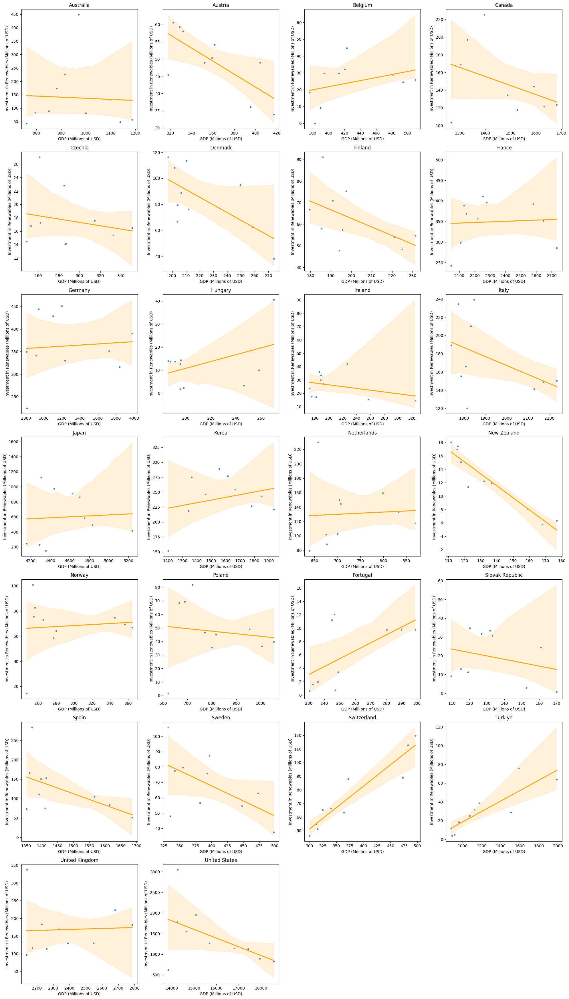

In [234]:
# Obtenir la liste des pays communs dans les deux dataframes
common_countries = sorted(set(df_economy_gdp_corr2['Economy Name']).intersection(set(budgets_renewables_without_nan['Economy Name'])))

# Définir le nombre de lignes et de colonnes dynamiquement en fonction du nombre de pays
num_countries = len(common_countries)
num_cols = 4
num_rows = (num_countries + num_cols - 1) // num_cols  # Calculer le nombre de lignes nécessaires

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 5 * num_rows))

for i, country in enumerate(common_countries):
    row, col = divmod(i, num_cols)
    ax = axes[row, col] if num_rows > 1 else axes[col]

    # Obtenir les valeurs de GDP et d'investissement en renouvelable pour chaque pays
    gdp_corr2 = df_economy_gdp_corr2[df_economy_gdp_corr2['Economy Name'] == country].iloc[:, 1:].values.flatten()
    renewables_corr2 = budgets_renewables_without_nan[budgets_renewables_without_nan['Economy Name'] == country].iloc[:, 1:].values.flatten()

    # Vérifier si les deux arrays ont la même longueur
    if len(gdp_corr2) == len(renewables_corr2) and len(gdp_corr2) > 0:
        sns.regplot(x=gdp_corr2, y=renewables_corr2, ax=ax, scatter_kws={'s':10}, line_kws={'color':'orange'})

    ax.set_title(country)
    ax.set_xlabel('GDP (Millions of USD)')
    ax.set_ylabel('Investment in Renewables (Millions of USD)')

# Si le nombre de pays n'est pas un multiple exact de num_cols, les derniers sous-plots seront vides
for j in range(i + 1, num_rows * num_cols):
    row, col = divmod(j, num_cols)
    fig.delaxes(axes[row, col] if num_rows > 1 else axes[col])

plt.tight_layout()
plt.show()

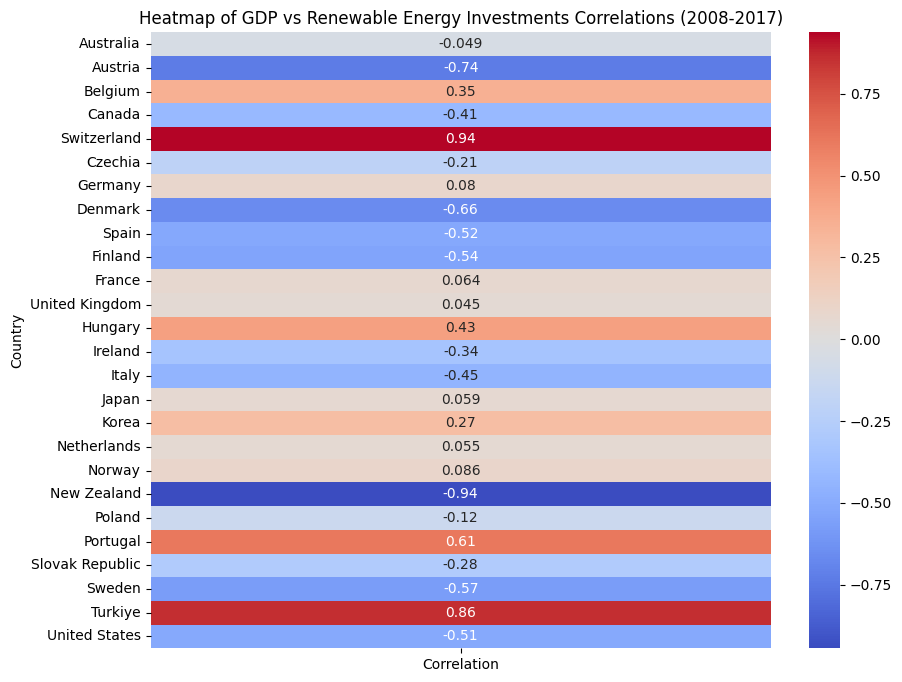

In [236]:
# Calculer les corrélations
correlation_gdp_er_2 = []

for country in merged_gdp_er_df_corr2['Economy Name'].unique():
    gdp_corr2 = merged_gdp_er_df_corr2.loc[merged_gdp_er_df_corr2['Economy Name'] == country, '2008_GDP':'2017_GDP'].values.flatten()
    renewables_corr2 = merged_gdp_er_df_corr2.loc[merged_gdp_er_df_corr2['Economy Name'] == country, '2008_ERInvestments':'2017_ERInvestments'].values.flatten()
    correcoef_gdp_er_2 = np.corrcoef(gdp_corr2, renewables_corr2)[0, 1]
    correlation_gdp_er_2.append({'Country': country, 'Correlation': correcoef_gdp_er_2})

# Convertir la liste en DataFrame
correlation_gdp_er_df_corr2 = pd.DataFrame(correlation_gdp_er_2).set_index('Country')

# Heatmap des corrélations
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_gdp_er_df_corr2, annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap of GDP vs Renewable Energy Investments Correlations (2008-2017)')
plt.show()

## Old_Corrélation entre GDP x ER

In [173]:
df_economy_gdp.head(3)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
279,Australia,680.15,760.81,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,1138.08,1187.32,NaN
605,Austria,297.73,317.81,328.57,322.51,332.00,352.02,359.02,361.40,395.49,404.29,417.23,NaN
931,Belgium,364.65,375.99,389.52,382.75,394.35,413.28,420.31,422.81,481.47,494.12,509.53,NaN


In [174]:
budgets_renewables.head(3)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Period 2007-2017
2,Australia,50.553,43.747000,84.191000,89.589,173.803,226.167,448.283,81.671,131.836,48.560,57.124,1435.52
11,Austria,28.002,45.348000,59.308000,60.608,58.045,48.935,50.330,54.151,36.128,48.910,33.920,523.68
20,Belgium,27.484,18.322667,9.161333,0.000,29.660,29.787,32.115,44.781,28.922,24.496,25.865,270.59


In [175]:
budgets_renewables_base = budgets_renewables.drop(columns='Period 2007-2017')

In [176]:
# Fusionner les deux dataframes
merged_gdp_er_df = pd.merge(df_economy_gdp, budgets_renewables_base, on="Economy Name", suffixes=('_GDP', '_ERInvestments'))

# Liste des pays à visualiser
countries = merged_gdp_er_df['Economy Name'].unique()

##### Scatter plot des corrélations GDP x ER #####

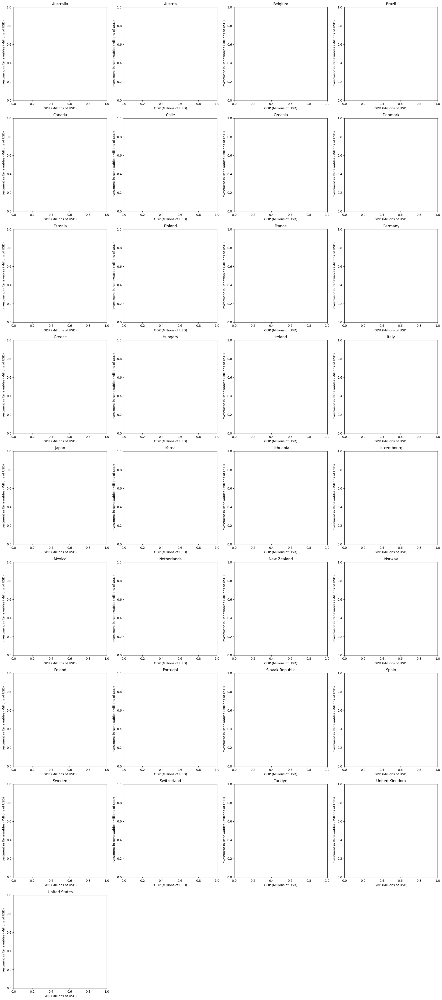

In [177]:
# Obtenir la liste des pays communs dans les deux dataframes
common_countries = sorted(set(df_economy_gdp['Economy Name']).intersection(set(budgets_renewables_base['Economy Name'])))

# Définir le nombre de lignes et de colonnes dynamiquement en fonction du nombre de pays
num_countries = len(common_countries)
num_cols = 4
num_rows = (num_countries + num_cols - 1) // num_cols  # Calculer le nombre de lignes nécessaires

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 5 * num_rows))

for i, country in enumerate(common_countries):
    row, col = divmod(i, num_cols)
    ax = axes[row, col] if num_rows > 1 else axes[col]

    # Obtenir les valeurs de GDP et d'investissement en renouvelable pour chaque pays
    gdp = df_economy_gdp[df_economy_gdp['Economy Name'] == country].iloc[:, 1:].values.flatten()
    renewables = budgets_renewables_base[budgets_renewables_base['Economy Name'] == country].iloc[:, 1:].values.flatten()

    # Vérifier si les deux arrays ont la même longueur
    if len(gdp) == len(renewables) and len(gdp) > 0:
        sns.regplot(x=gdp, y=renewables, ax=ax, scatter_kws={'s':10}, line_kws={'color':'orange'})

    ax.set_title(country)
    ax.set_xlabel('GDP (Millions of USD)')
    ax.set_ylabel('Investment in Renewables (Millions of USD)')

# Si le nombre de pays n'est pas un multiple exact de num_cols, les derniers sous-plots seront vides
for j in range(i + 1, num_rows * num_cols):
    row, col = divmod(j, num_cols)
    fig.delaxes(axes[row, col] if num_rows > 1 else axes[col])

plt.tight_layout()
plt.show()

##### Heatmap des corrélations GDP x ER #####

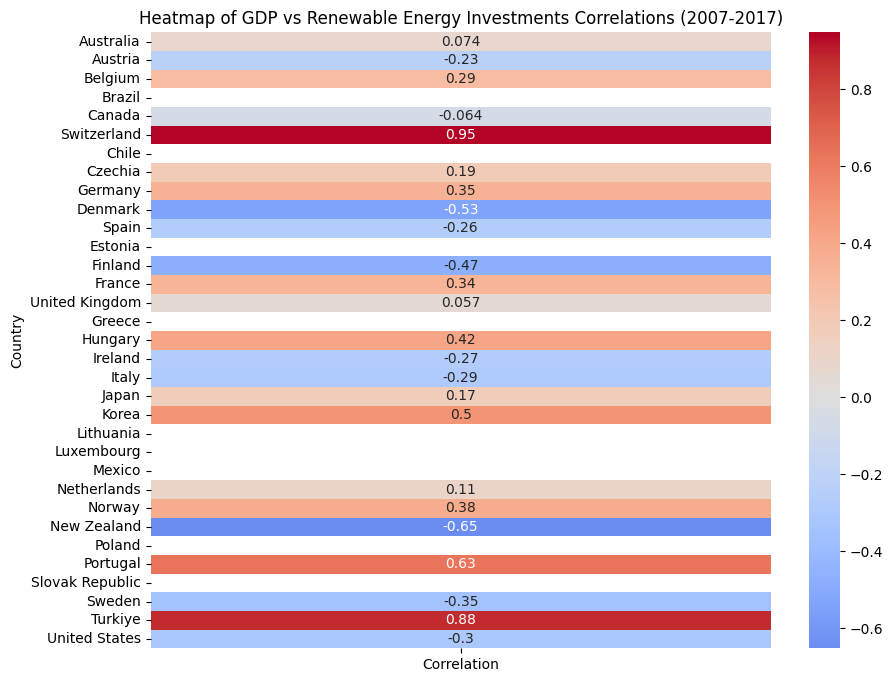

In [178]:
# Calculer les corrélations
correlation_gdp_er = []

for country in merged_gdp_er_df['Economy Name'].unique():
    gdp_data = merged_gdp_er_df.loc[merged_gdp_er_df['Economy Name'] == country, '2007_GDP':'2017_GDP'].values.flatten()
    er_data = merged_gdp_er_df.loc[merged_gdp_er_df['Economy Name'] == country, '2007_ERInvestments':'2017_ERInvestments'].values.flatten()
    correcoef_gdp_er = np.corrcoef(gdp_data, er_data)[0, 1]
    correlation_gdp_er.append({'Country': country, 'Correlation': correcoef_gdp_er})

# Convertir la liste en DataFrame
correlation_gdp_er_df = pd.DataFrame(correlation_gdp_er).set_index('Country')

# Heatmap des corrélations
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_gdp_er_df, annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap of GDP vs Renewable Energy Investments Correlations (2007-2017)')
plt.show()

## 4. Corrélation GDP x GCI x ER (en excluant pays et dates sans données)

In [237]:
df_economy_gdp_corr2

,Economy Name,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
279,Australia,760.81,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,1138.08,1187.32,NaN
605,Austria,317.81,328.57,322.51,332.00,352.02,359.02,361.40,395.49,404.29,417.23,NaN
931,Belgium,375.99,389.52,382.75,394.35,413.28,420.31,422.81,481.47,494.12,509.53,NaN
1257,Brazil,1835.64,1981.21,2013.19,2172.06,2294.24,2355.59,2423.31,3263.83,3192.40,3141.33,NaN
1583,Canada,1265.84,1303.23,1281.06,1330.27,1396.13,1488.31,1526.08,1591.58,1631.94,1682.36,NaN
1909,Switzerland,300.19,312.75,314.87,324.51,339.89,363.42,371.57,472.83,482.35,495.96,NaN
2235,Chile,231.06,243.04,243.57,257.88,299.63,320.54,334.76,409.33,422.42,438.75,NaN
2561,Czechia,248.90,262.17,252.95,261.29,284.95,286.95,286.04,314.58,332.48,350.72,NaN
2887,Germany,2809.69,2910.49,2806.27,2940.43,3099.08,3197.07,3232.54,3721.55,3840.55,3980.28,NaN
3213,Denmark,203.68,204.06,197.06,201.74,206.59,210.15,211.92,249.53,258.70,273.86,NaN


In [239]:
budgets_renewables_without_nan

,Economy Name,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Period 2007-2017
2,Australia,43.747000,84.191000,89.5890,173.8030,226.1670,448.2830,81.671,131.836,48.560,57.124,1435.52
11,Austria,45.348000,59.308000,60.6080,58.0450,48.9350,50.3300,54.151,36.128,48.910,33.920,523.68
20,Belgium,18.322667,9.161333,0.0000,29.6600,29.7870,32.1150,44.781,28.922,24.496,25.865,270.59
38,Canada,103.536000,168.995000,167.7760,196.9380,225.2680,134.3600,117.747,144.331,121.561,123.506,1588.83
56,Czechia,14.504000,17.274000,16.8140,27.0300,22.7970,14.1550,14.069,17.550,15.384,16.499,179.32
65,Denmark,66.714000,79.416000,116.2530,108.2230,88.7370,113.4920,76.134,94.884,62.323,38.042,904.26
83,Finland,58.030000,70.931000,66.7220,90.9590,57.4200,75.1900,47.815,54.073,48.433,54.702,681.04
92,France,242.249000,388.578000,298.5820,368.3010,357.5160,411.2190,396.133,392.506,351.413,285.457,3682.53
101,Germany,224.299000,341.314000,349.5920,444.0600,429.0550,450.9640,329.721,351.803,315.693,390.165,3801.23
119,Hungary,13.725000,14.302000,13.9490,13.6850,12.7750,1.7420,2.319,3.250,9.948,40.589,140.67


In [238]:
df_gci_mean_country_base_for_corr2

,Economy Name,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,gci_mean_period
0,Australia,5.345000,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,5.326667,5.292500
1,Austria,5.314167,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,5.300833,5.245606
2,Belgium,5.215000,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,5.265833,5.222121
4,Canada,5.491667,5.435000,5.411667,5.437500,5.399167,5.340000,5.373333,5.443333,5.403333,5.468333,5.422045
6,Czechia,4.683333,4.715833,4.665000,4.629167,4.611667,4.530833,4.660833,4.835833,4.869167,4.922500,4.702803
7,Denmark,5.685833,5.555833,5.414167,5.475833,5.345000,5.230833,5.374167,5.421667,5.425000,5.472500,5.459924
9,Finland,5.582500,5.507500,5.438333,5.529167,5.600000,5.583333,5.555833,5.511667,5.496667,5.556667,5.538258
10,France,5.309167,5.227500,5.238333,5.223333,5.183333,5.139167,5.151667,5.195833,5.264167,5.242500,5.221667
11,Germany,5.520000,5.420833,5.439167,5.454167,5.516667,5.548333,5.535000,5.573333,5.612500,5.698333,5.531515
13,Hungary,4.256667,4.292500,4.355833,4.390833,4.369167,4.275000,4.327500,4.305833,4.220833,4.357500,4.318182


In [240]:
# Fusionner les trois DataFrames sur la colonne 'Economy Name'
merged_2df_corr2 = pd.merge(df_economy_gdp_corr2, budgets_renewables_without_nan, on='Economy Name', suffixes=('_GDP', '_Renewables'))
merged_2df_corr2.head(3)

,Economy Name,2008_GDP,2009_GDP,2010_GDP,2011_GDP,2012_GDP,2013_GDP,2014_GDP,2015_GDP,2016_GDP,...,2009_Renewables,2010_Renewables,2011_Renewables,2012_Renewables,2013_Renewables,2014_Renewables,2015_Renewables,2016_Renewables,2017_Renewables,Period 2007-2017
0,Australia,760.81,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,1138.08,...,84.191000,89.589,173.803,226.167,448.283,81.671,131.836,48.560,57.124,1435.52
1,Austria,317.81,328.57,322.51,332.00,352.02,359.02,361.40,395.49,404.29,...,59.308000,60.608,58.045,48.935,50.330,54.151,36.128,48.910,33.920,523.68
2,Belgium,375.99,389.52,382.75,394.35,413.28,420.31,422.81,481.47,494.12,...,9.161333,0.000,29.660,29.787,32.115,44.781,28.922,24.496,25.865,270.59


In [241]:
merged_3df_corr2 = pd.merge(merged_2df_corr2, df_gci_mean_country_base_for_corr2, on='Economy Name', suffixes=('', '_GCI'))
merged_3df_corr2.head(3)

,Economy Name,2008_GDP,2009_GDP,2010_GDP,2011_GDP,2012_GDP,2013_GDP,2014_GDP,2015_GDP,2016_GDP,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,gci_mean_period
0,Australia,760.81,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,1138.08,...,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,5.326667,5.292500
1,Austria,317.81,328.57,322.51,332.00,352.02,359.02,361.40,395.49,404.29,...,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,5.300833,5.245606
2,Belgium,375.99,389.52,382.75,394.35,413.28,420.31,422.81,481.47,494.12,...,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,5.265833,5.222121


In [242]:
# Calcul de la corrélation
correlation_3var_corr2 = []

for country in merged_3df_corr2['Economy Name'].unique():
    data_corr2 = merged_3df_corr2[merged_3df_corr2['Economy Name'] == country]

    for year in range(2008, 2018):
        gdp_c2 = data_corr2[f'{year}_GDP'].values[0]
        renewables_c2 = data_corr2[f'{year}_Renewables'].values[0]
        gci_c2 = data_corr2[f'{year}'].values[0]

        correlation_3var_corr2.append({
            'Country': country,
            'Year': year,
            'GDP': gdp_c2,
            'Renewables': renewables_c2,
            'GCI': gci_c2
        })

# Convertir en DataFrame
correlation_3df_corr2 = pd.DataFrame(correlation_3var_corr2)

# Calculer les corrélations
corr2_matrix3 = correlation_3df_corr2[['GDP', 'Renewables', 'GCI']].corr()
print(corr2_matrix3)

                 GDP  Renewables       GCI
GDP         1.000000    0.837591  0.238388
Renewables  0.837591    1.000000  0.264661
GCI         0.238388    0.264661  1.000000


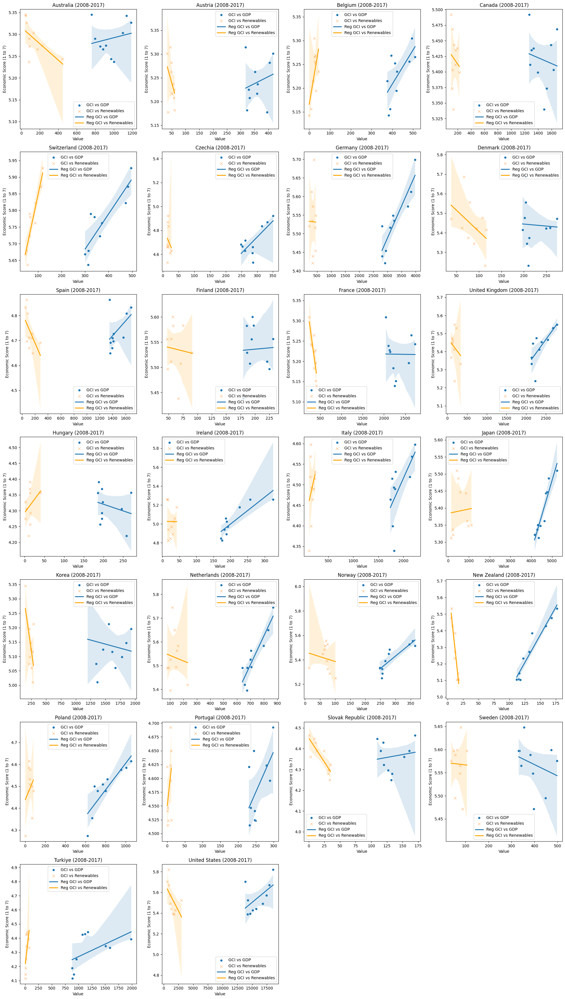

In [244]:

# Définir la taille de la grille
n_countries = len(merged_3df_corr2['Economy Name'].unique())
n_cols = 4  # Nombre de colonnes de la grille
n_rows = (n_countries + n_cols - 1) // n_cols  # Calculer le nombre de lignes nécessaires

# Créer une figure et des axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))

# Boucle pour chaque pays et tracer les scatter plots
for i, country in enumerate(merged_3df_corr2['Economy Name'].unique()):
    row = i // n_cols
    col = i % n_cols
    ax = axes[row, col]

    data_c2 = correlation_3df_corr2[correlation_3df_corr2['Country'] == country]
    sns.scatterplot(x='GDP', y='GCI', data=data_c2, ax=ax, label='GCI vs GDP')
    sns.scatterplot(x='Renewables', y='GCI', data=data_c2, ax=ax, label='GCI vs Renewables', marker='x')
    sns.regplot(x='GDP', y='GCI', data=data_c2, ax=ax, scatter=False, label='Reg GCI vs GDP')
    sns.regplot(x='Renewables', y='GCI', data=data_c2, ax=ax, scatter=False, label='Reg GCI vs Renewables', color='orange')

    ax.set_title(f'{country} (2008-2017)')
    ax.set_xlabel('Value')
    ax.set_ylabel('Economic Score (1 to 7)')
    ax.legend()

# Supprimer les axes inutilisés
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

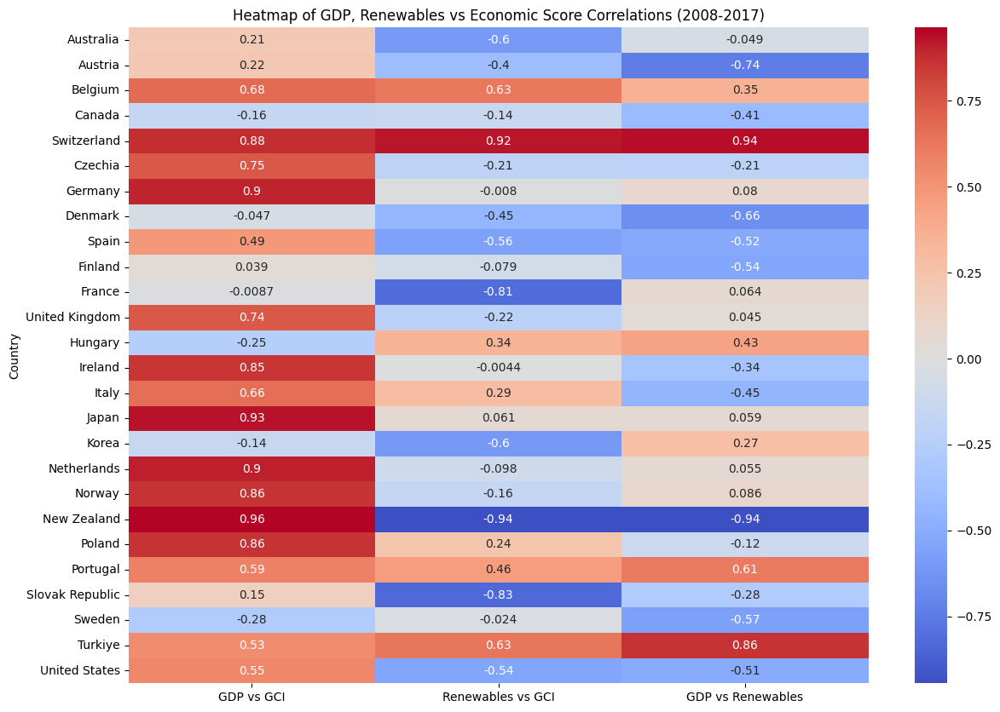

In [247]:

# Calculer les corrélations pour chaque pays
heatmap_data_corr2 = []

for country in merged_3df_corr2['Economy Name'].unique():
    data = merged_3df_corr2[merged_3df_corr2['Economy Name'] == country]

    # Calculer les corrélations
    correlation_gdp_gci_corr2 = np.corrcoef(data.loc[:, '2008_GDP':'2017_GDP'].values.flatten(), data.loc[:, '2008':'2017'].values.flatten())[0, 1]
    correlation_renewables_gci_corr2 = np.corrcoef(data.loc[:, '2008_Renewables':'2017_Renewables'].values.flatten(), data.loc[:, '2008':'2017'].values.flatten())[0, 1]
    correlation_gdp_renewables_corr2 = np.corrcoef(data.loc[:, '2008_GDP':'2017_GDP'].values.flatten(), data.loc[:, '2008_Renewables':'2017_Renewables'].values.flatten())[0, 1]

    heatmap_data_corr2.append({
        'Country': country,
        'GDP vs GCI': correlation_gdp_gci_corr2,
        'Renewables vs GCI': correlation_renewables_gci_corr2,
        'GDP vs Renewables': correlation_gdp_renewables_corr2
    })

# Convertir en DataFrame
heatmap_df = pd.DataFrame(heatmap_data_corr2).set_index('Country')

# Plot de la heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_df, annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap of GDP, Renewables vs Economic Score Correlations (2008-2017)')
plt.show()

## Old_Corrélation entre GDP x GCI x ER

In [179]:
df_economy_gdp.head(3)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Moyenne GCI
279,Australia,680.15,760.81,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,1138.08,1187.32,NaN
605,Austria,297.73,317.81,328.57,322.51,332.00,352.02,359.02,361.40,395.49,404.29,417.23,NaN
931,Belgium,364.65,375.99,389.52,382.75,394.35,413.28,420.31,422.81,481.47,494.12,509.53,NaN


In [180]:
budgets_renewables.head(3)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,Period 2007-2017
2,Australia,50.553,43.747000,84.191000,89.589,173.803,226.167,448.283,81.671,131.836,48.560,57.124,1435.52
11,Austria,28.002,45.348000,59.308000,60.608,58.045,48.935,50.330,54.151,36.128,48.910,33.920,523.68
20,Belgium,27.484,18.322667,9.161333,0.000,29.660,29.787,32.115,44.781,28.922,24.496,25.865,270.59


In [181]:
df_gci_mean_country.head(3)

,Economy Name,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,gci_mean_period,Period 2007-2017
0,Australia,5.317500,5.345000,5.290000,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,5.326667,5.292500,5.29
1,Austria,5.297500,5.314167,5.225000,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,5.300833,5.245606,5.25
2,Belgium,5.153333,5.215000,5.155833,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,5.265833,5.222121,5.22


##### Scatter plot des corrélations GDP x GCI x ER #####

In [182]:
# Fusionner les trois DataFrames sur la colonne 'Economy Name'
merged_2df = pd.merge(df_economy_gdp, budgets_renewables, on='Economy Name', suffixes=('_GDP', '_Renewables'))
merged_2df.head(3)

,Economy Name,2007_GDP,2008_GDP,2009_GDP,2010_GDP,2011_GDP,2012_GDP,2013_GDP,2014_GDP,2015_GDP,...,2009_Renewables,2010_Renewables,2011_Renewables,2012_Renewables,2013_Renewables,2014_Renewables,2015_Renewables,2016_Renewables,2017_Renewables,Period 2007-2017
0,Australia,680.15,760.81,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,...,84.191000,89.589,173.803,226.167,448.283,81.671,131.836,48.560,57.124,1435.52
1,Austria,297.73,317.81,328.57,322.51,332.00,352.02,359.02,361.40,395.49,...,59.308000,60.608,58.045,48.935,50.330,54.151,36.128,48.910,33.920,523.68
2,Belgium,364.65,375.99,389.52,382.75,394.35,413.28,420.31,422.81,481.47,...,9.161333,0.000,29.660,29.787,32.115,44.781,28.922,24.496,25.865,270.59


In [183]:
merged_3df = pd.merge(merged_2df, df_gci_mean_country, on='Economy Name', suffixes=('', '_GCI'))
merged_3df.head(3)


,Economy Name,2007_GDP,2008_GDP,2009_GDP,2010_GDP,2011_GDP,2012_GDP,2013_GDP,2014_GDP,2015_GDP,...,2010,2011,2012,2013,2014,2015,2016,2017,gci_mean_period,Period 2007-2017_GCI
0,Australia,680.15,760.81,795.30,851.17,882.36,914.48,970.76,999.60,1095.38,...,5.272500,5.265833,5.274167,5.243333,5.236667,5.303333,5.342500,5.326667,5.292500,5.29
1,Austria,297.73,317.81,328.57,322.51,332.00,352.02,359.02,361.40,395.49,...,5.181667,5.207500,5.262500,5.216667,5.236667,5.177500,5.281667,5.300833,5.245606,5.25
2,Belgium,364.65,375.99,389.52,382.75,394.35,413.28,420.31,422.81,481.47,...,5.142500,5.268333,5.252500,5.194167,5.235000,5.255833,5.305000,5.265833,5.222121,5.22


In [184]:
# Calcul de la corrélation
correlation_3var = []

for country in merged_3df['Economy Name'].unique():
    data = merged_3df[merged_3df['Economy Name'] == country]

    for year in range(2007, 2018):
        gdp = data[f'{year}_GDP'].values[0]
        renewables = data[f'{year}_Renewables'].values[0]
        gci = data[f'{year}'].values[0]

        correlation_3var.append({
            'Country': country,
            'Year': year,
            'GDP': gdp,
            'Renewables': renewables,
            'GCI': gci
        })

# Convertir en DataFrame
correlation_3df = pd.DataFrame(correlation_3var)

# Calculer les corrélations
corr_matrix3 = correlation_3df[['GDP', 'Renewables', 'GCI']].corr()
print(corr_matrix3)

                 GDP  Renewables       GCI
GDP         1.000000    0.839495  0.222920
Renewables  0.839495    1.000000  0.245373
GCI         0.222920    0.245373  1.000000


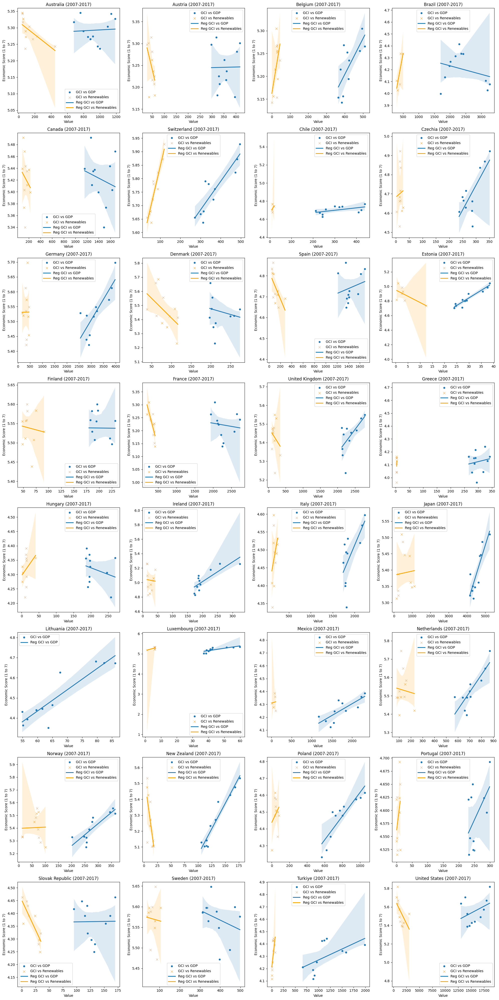

In [185]:
# Définir la taille de la grille
n_countries = len(merged_3df['Economy Name'].unique())
n_cols = 4  # Nombre de colonnes de la grille
n_rows = (n_countries + n_cols - 1) // n_cols  # Calculer le nombre de lignes nécessaires

# Créer une figure et des axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))

# Boucle pour chaque pays et tracer les scatter plots
for i, country in enumerate(merged_3df['Economy Name'].unique()):
    row = i // n_cols
    col = i % n_cols
    ax = axes[row, col]

    data = correlation_3df[correlation_3df['Country'] == country]
    sns.scatterplot(x='GDP', y='GCI', data=data, ax=ax, label='GCI vs GDP')
    sns.scatterplot(x='Renewables', y='GCI', data=data, ax=ax, label='GCI vs Renewables', marker='x')
    sns.regplot(x='GDP', y='GCI', data=data, ax=ax, scatter=False, label='Reg GCI vs GDP')
    sns.regplot(x='Renewables', y='GCI', data=data, ax=ax, scatter=False, label='Reg GCI vs Renewables', color='orange')

    ax.set_title(f'{country} (2007-2017)')
    ax.set_xlabel('Value')
    ax.set_ylabel('Economic Score (1 to 7)')
    ax.legend()

# Supprimer les axes inutilisés
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()


##### Heatmap des corrélations GDP x GCI x ER #####

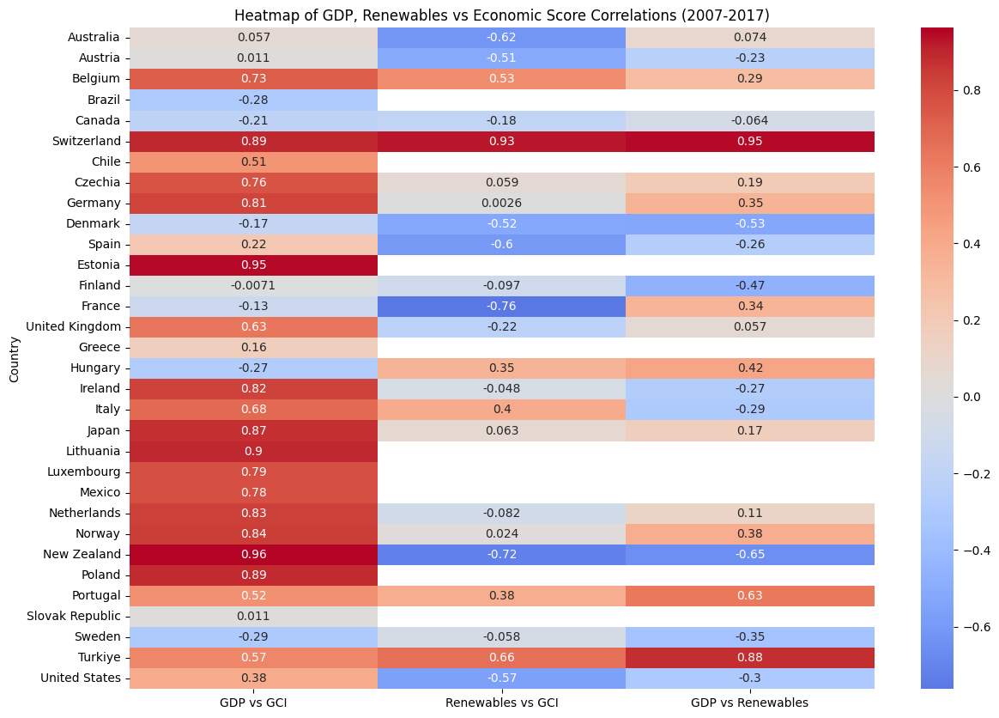

In [186]:
# Calculer les corrélations pour chaque pays
heatmap_data = []

for country in merged_3df['Economy Name'].unique():
    data = merged_3df[merged_3df['Economy Name'] == country]
    correlation_gdp_gci = data.loc[:, '2007_GDP':'2017_GDP'].values.flatten()
    correlation_renewables_gci = data.loc[:, '2007_Renewables':'2017_Renewables'].values.flatten()
    correlation_gdp_renewables = data.loc[:, '2007_GDP':'2017_GDP'].values.flatten()
    correlation_gdp_gci = np.corrcoef(correlation_gdp_gci, data.loc[:, '2007':'2017'].values.flatten())[0, 1]
    correlation_renewables_gci = np.corrcoef(correlation_renewables_gci, data.loc[:, '2007':'2017'].values.flatten())[0, 1]
    correlation_gdp_renewables = np.corrcoef(correlation_gdp_renewables, data.loc[:, '2007_Renewables':'2017_Renewables'].values.flatten())[0, 1]

    heatmap_data.append({
        'Country': country,
        'GDP vs GCI': correlation_gdp_gci,
        'Renewables vs GCI': correlation_renewables_gci,
        'GDP vs Renewables': correlation_gdp_renewables
    })

# Convertir en DataFrame
heatmap_df = pd.DataFrame(heatmap_data).set_index('Country')

# Plot de la heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_df, annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap of GDP, Renewables vs Economic Score Correlations (2007-2017)')
plt.show()